In [94]:
import tensorflow as tf

def load_image(filename):
    img = tf.io.read_file(filename)
    img = tf.io.decode_image(img) 
   
    return img

In [95]:
image = load_image('rex.png')

In [96]:
import matplotlib.pyplot as plt
import numpy as np

def display_image(image):
    plt.figure(figsize=(20, 20))
    plt.imshow(image)
    plt.axis(False)
    plt.show()

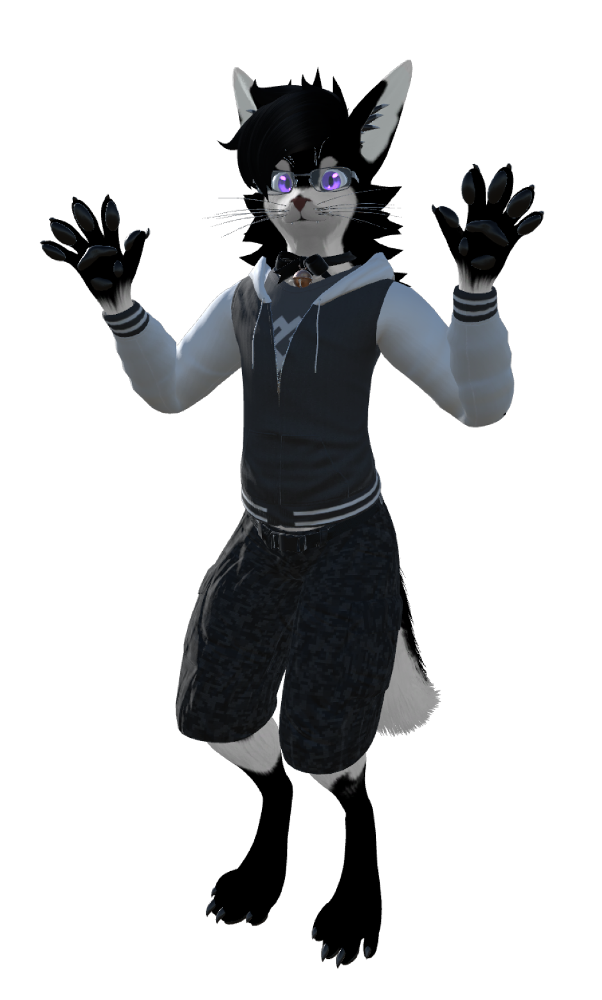

In [97]:
display_image(image.numpy()/255)

In [98]:
image = image.numpy()

In [99]:
image.shape

(1290, 771, 4)

In [100]:
black = [0, 0, 0, 1]
transparent = [1, 1, 1, 0]

In [101]:
def make_image_black(imgclr):
    imgblck = np.zeros(imgclr.shape)
    for x in range(imgclr.shape[1]):
        for y in range(imgclr.shape[0]):
            if (imgclr[y][x][3]) == 0:
                imgblck[y, x, :] = transparent
            else:
                imgblck[y, x, :] = black

    return imgblck

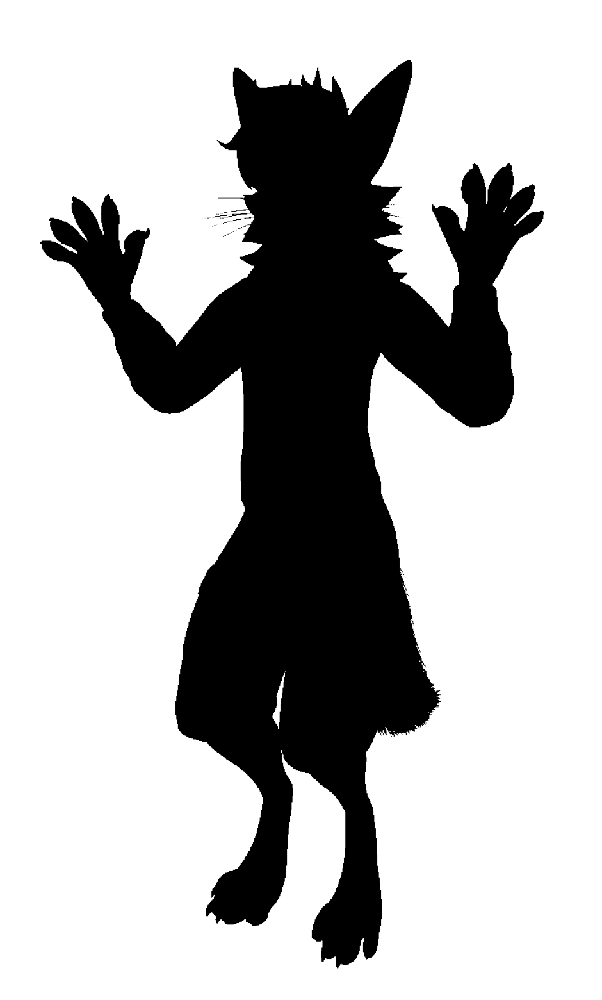

In [102]:
image1 = make_image_black(image)
display_image(image1)

In [103]:
def clean_ghost_lines(img_input):
    img = np.copy(img_input)
    for x in range(img_input.shape[1]):
        for y in range(img_input.shape[0]):
            if (img_input[y, x, 3]) == 1: #if opaque and on border make transparent to get rid ghost lines
                if y > 0:
                    if img_input[y - 1, x, 3] == 0:
                        img[y, x, :] = transparent
                    if x > 0:
                        if img_input[y - 1, x - 1, 3] == 0:
                            img[y, x, :] = transparent
                    elif x < img_input.shape[1] - 1:
                        if img_input[y - 1, x + 1, 3] == 0:
                            img[y, x, :] = transparent
                if y < img_input.shape[0] - 1:
                    if img_input[y + 1, x, 3] == 0:
                        img[y, x, :] = transparent
                    if x > 0:
                        if img_input[y + 1, x - 1, 3] == 0:
                            img[y, x, :] = transparent
                    elif x < img_input.shape[1] - 1:
                        if img_input[y + 1, x + 1, 3] == 0:
                            img[y, x, :] = transparent
    
                    
                if x > 0:
                    if img_input[y, x - 1, 3] == 0:
                        img[y, x, :] = transparent
                elif x < img.shape[1] - 1:
                    if img_input[y, x + 1, 3] == 0:
                        img[y, x, :] = transparent

    return img

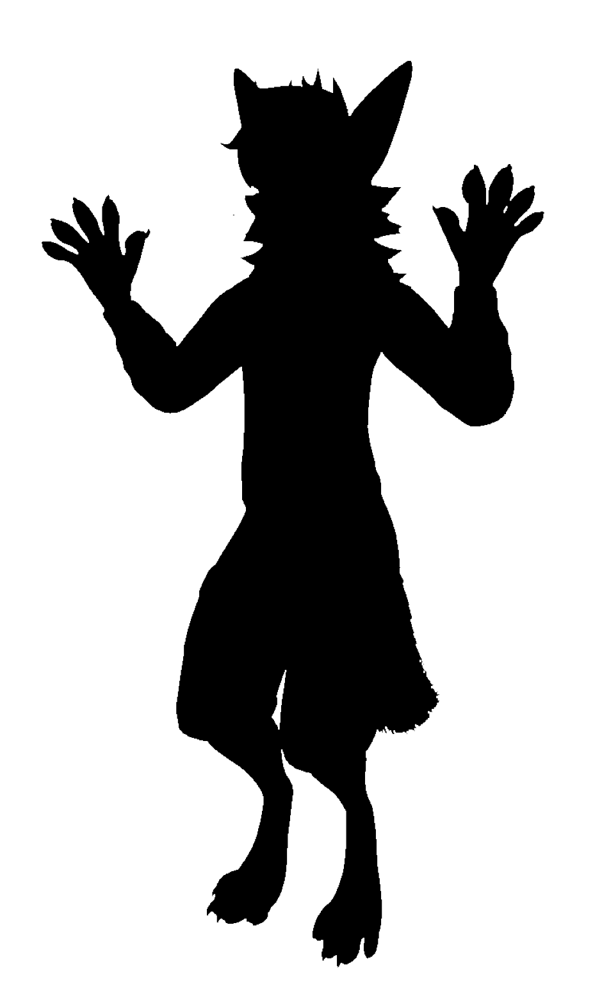

In [104]:
image2 = clean_ghost_lines(image1)
display_image(image2)

In [ ]:
        counter = 0
        still_corners = False
        for _ in range(100):
            for point in points_to_remove:#remove corners first
                if point[0] > 0:
                    if point[1] > 0:
                        if ((img[point[0] - 1, point[1], 3] == 0) and (img[point[0], point[1] - 1, 3] == 0) and (img[point[0] - 1, point[1] - 1, 3] == 0)): 
                            check_if_line(point[0], point[1])
                            img[point[0], point[1], :] = transparent
                            points_to_remove.remove(point)
                            still_corners = True
                            counter += 1
                            continue
    
                if point[0] < img.shape[0]:
                     if point[1] < img.shape[1]:
                        if ((img[point[0] + 1, point[1], 3] == 0) and (img[point[0], point[1] + 1, 3] == 0) and (img[point[0] + 1, point[1] + 1, 3] == 0)): 
                            check_if_line(point[0], point[1])
                            img[point[0], point[1], :] = transparent
                            points_to_remove.remove(point)
                            still_corners = True
                            counter += 1
                            continue
    
                if point[0] > 0:
                     if point[1] < img.shape[1]:
                        if ((img[point[0] - 1, point[1], 3] == 0) and (img[point[0], point[1] + 1, 3] == 0) and (img[point[0] - 1, point[1] + 1, 3] == 0)): 
                            check_if_line(point[0], point[1])
                            img[point[0], point[1], :] = transparent
                            points_to_remove.remove(point)
                            still_corners = True
                            counter += 1
                            continue
    
                if point[0] < img.shape[0]:
                     if point[1] > 0:
                        if ((img[point[0] + 1, point[1], 3] == 0) and (img[point[0], point[1] - 1, 3] == 0) and (img[point[0] + 1, point[1] - 1, 3] == 0)): 
                            check_if_line(point[0], point[1])
                            img[point[0], point[1], :] = transparent
                            points_to_remove.remove(point)
                            still_corners = True
                            counter += 1
                            continue

 print(counter)

In [105]:
gray = [0.0, 0.1, 0.0]

def combine_top_and_bottom_image(image1, image2):
    line_image = np.zeros((image1.shape))
    for x in range(image1.shape[1]):
        for y in range(image1.shape[0]):
            minvalue = np.minimum(image1[y, x, 1], image2[y, x, 1])
            maxvalue = np.maximum(image1[y, x, 1], image2[y, x, 1])

            line_image[y, x, 1] = minvalue
            
            if (minvalue == 0):
                if (maxvalue > 0):
                    if y > 0: #up
                        if image1[y - 1, x, 1] == maxvalue:
                            line_image[y, x, 1] = maxvalue

                    if x > 0:
                        if image1[y, x - 1, 1] == maxvalue: #left
                            line_image[y, x, 1] = maxvalue

                    if y < image1.shape[0] - 1:
                        if image1[y + 1, x, 1] == maxvalue:
                            line_image[y, x, 1] = maxvalue

                    if x < image1.shape[1] - 1:
                        if image1[y, x + 1, 1] == maxvalue: #right
                            line_image[y, x, 1] = maxvalue

    return line_image
                


def shrink_to_lines(img_orig):
    def check_if_line(y, x, new_image, work_image):
        #build lines
        if ((y > 0) and (y < work_image.shape[0] - 1)):
            if ((work_image[y - 1, x, 3] == 0) and (work_image[y + 1, x, 3] == 0)): #line is black with white on two sides
                new_image[y, x, :] = line_color
                    
        if ((x > 0) and ( x < work_image.shape[1] - 1)):
            if ((work_image[y, x - 1, 3] == 0) and (work_image[y, x + 1, 3] == 0)): #line is black with white on two sides
                new_image[y, x, :] = line_color

        if ((y > 0) and (y < work_image.shape[0] - 1) and (x > 0) and ( x < work_image.shape[1] - 1)):
            if ((work_image[y + 1, x + 1, 3] == 0) and (work_image[y - 1, x - 1, 3] == 0) and (work_image[y + 1, x - 1, 3] != 0) and (work_image[y - 1, x + 1, 3] != 0)):
                new_image[y, x, :] = line_color
            if ((work_image[y + 1, x + 1, 3] != 0) and (work_image[y - 1, x - 1, 3] != 0) and (work_image[y + 1, x - 1, 3] == 0) and (work_image[y - 1, x + 1, 3] == 0)):
                new_image[y, x, :] = line_color

    img = np.copy(img_orig)
    new_image_from_top = np.zeros((img.shape[0], img.shape[1], 3))
    new_image_from_bottom = np.zeros((img.shape[0], img.shape[1], 3))
    points_to_remove = []
    line_color = [0, 0, 0]
    for _ in range(500):
        still_black=False; #do this till 1000 or no more black
        line_color = np.add(line_color, gray)
        for x in range(img.shape[1]):
            for y in range(img.shape[0]):
                if (img[y, x, 3]) == 1: #if opaque and on border make transparent
                    still_black=True


                    if y > 0: #up
                        if img[y - 1, x, 3] == 0:
                            points_to_remove.append((y, x))

                    if x > 0:
                        if img[y, x - 1, 3] == 0: #left
                            points_to_remove.append((y, x))

                    if y < img.shape[0] - 1:
                        if img[y + 1, x, 3] == 0:
                            points_to_remove.append((y, x))

                    if x < img.shape[1] - 1:
                        if img[y, x + 1, 3] == 0: #right
                            points_to_remove.append((y, x))

        print(len(points_to_remove))

        img1 = np.copy(img)  
        for point in points_to_remove:#remove rest
            check_if_line(point[0], point[1], new_image_from_top, img)
            img[point[0], point[1], :] = transparent

        points_to_remove.reverse()
        for point in points_to_remove:#remove rest
            check_if_line(point[0], point[1], new_image_from_bottom, img1)
            img1[point[0], point[1], :] = transparent
 
        points_to_remove = []   

        #combined_image = np.subtract(img[:, :, :3], new_image_from_top)
        #display_image(combined_image)

        #combined_image = np.subtract(img[:, :, :3], new_image_from_bottom)
        #display_image(combined_image)


        line_image = combine_top_and_bottom_image(new_image_from_top, new_image_from_bottom)

        combined_image = np.subtract(img[:, :, :3], line_image)
        display_image(combined_image)

        if (still_black==False):
            break
            
    return (img, line_image)

8214


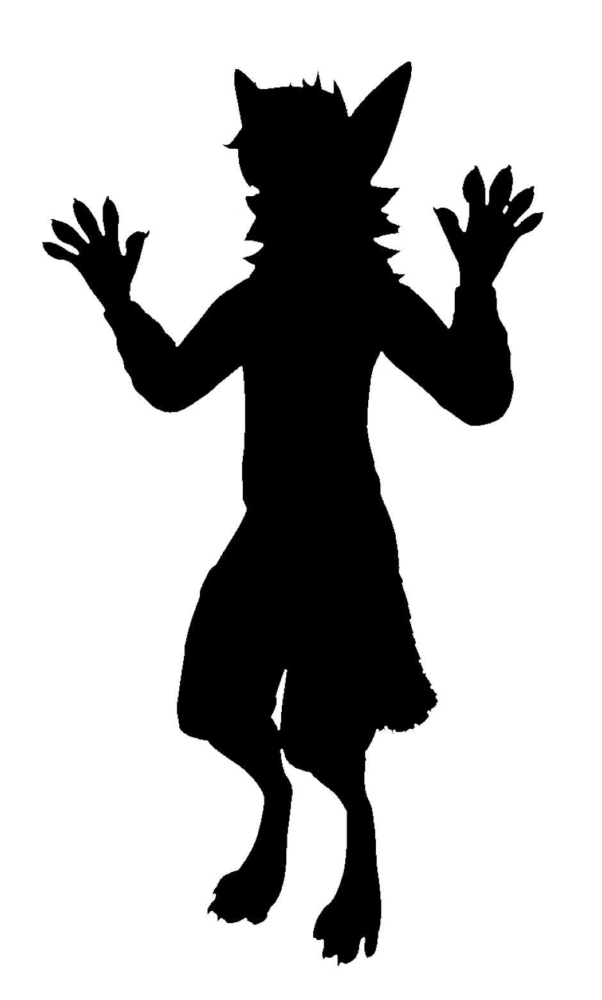

8094


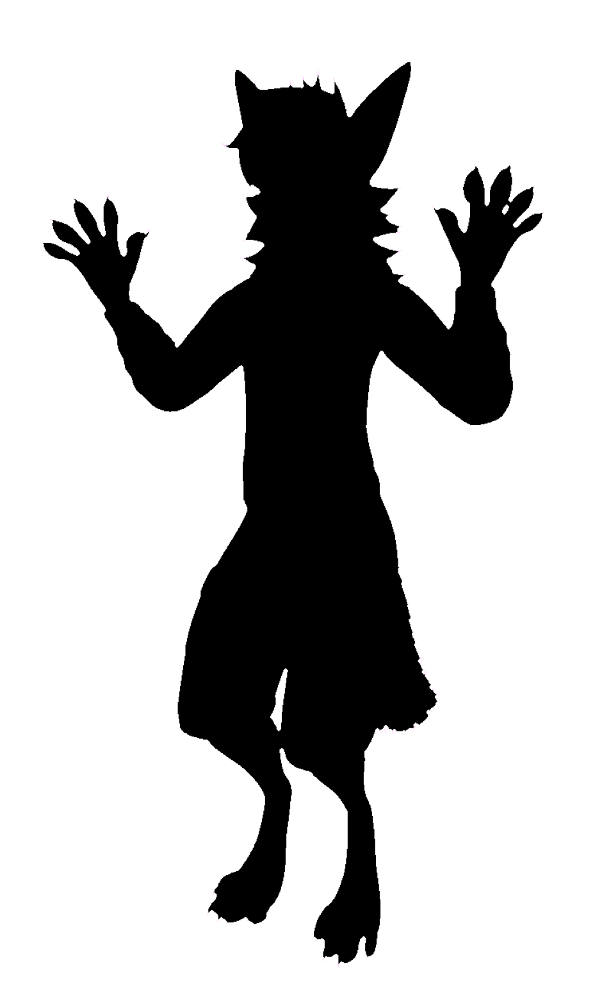

8022


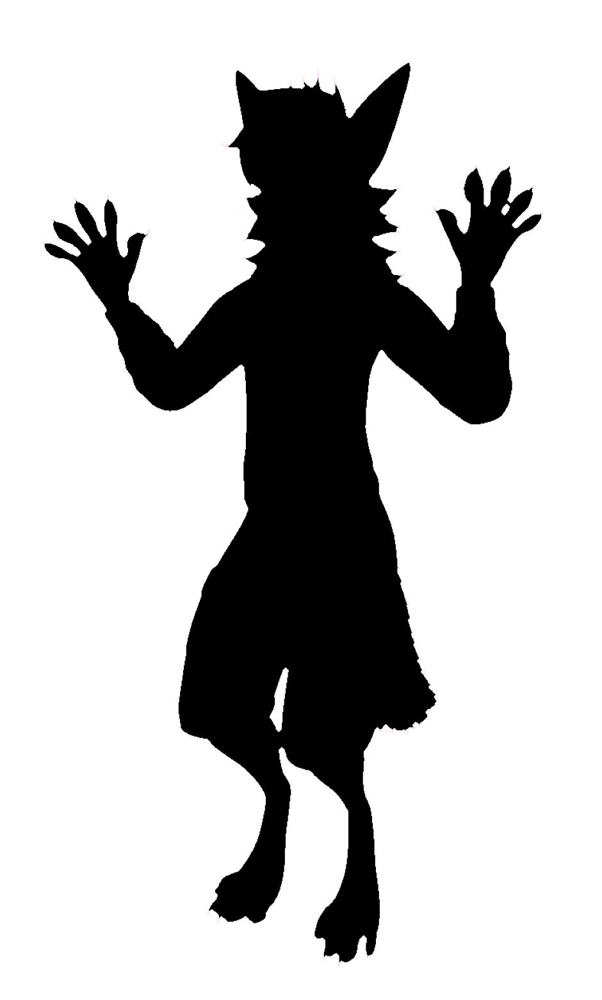

7958


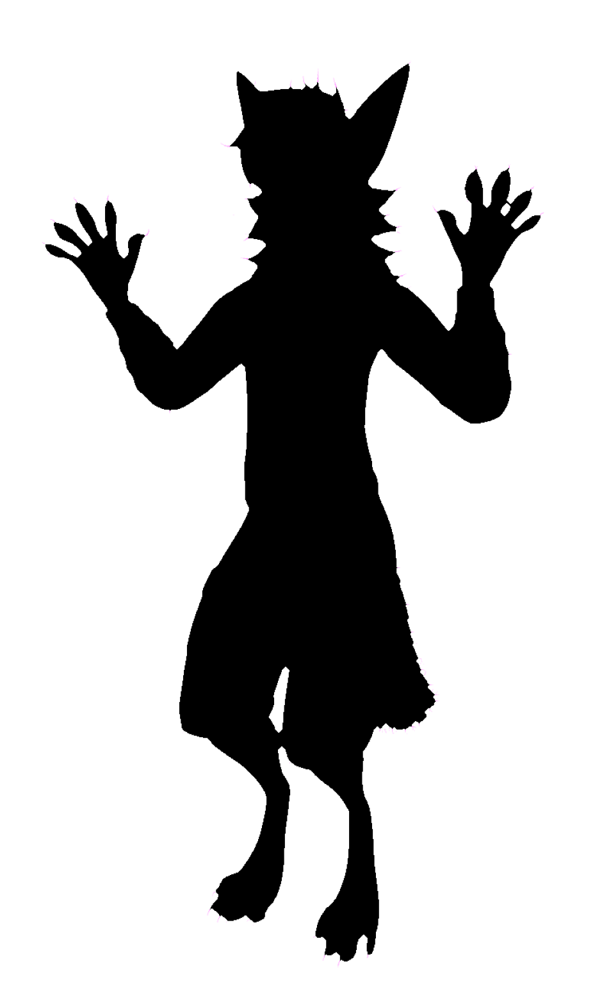

7902


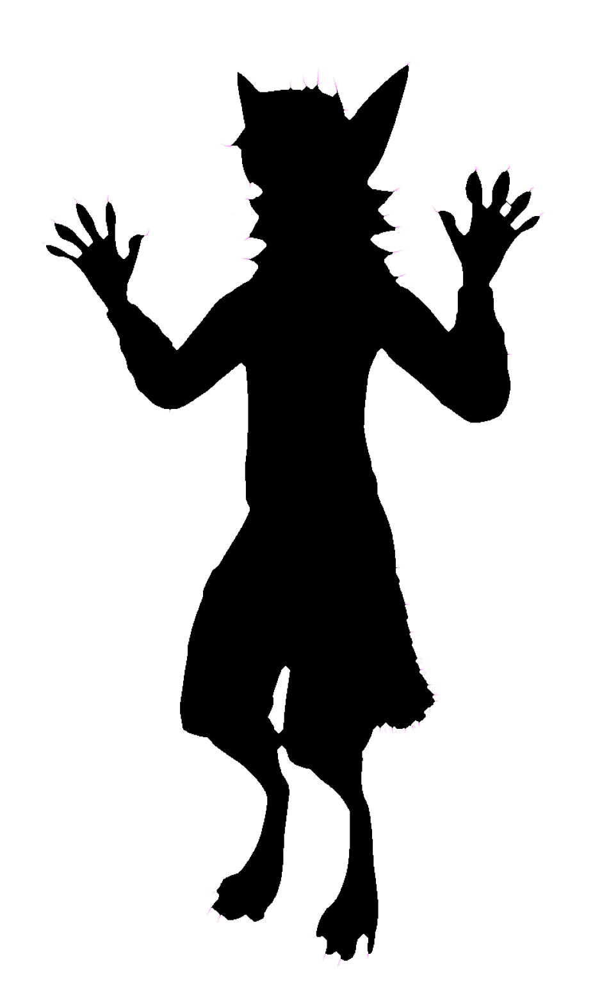

7864


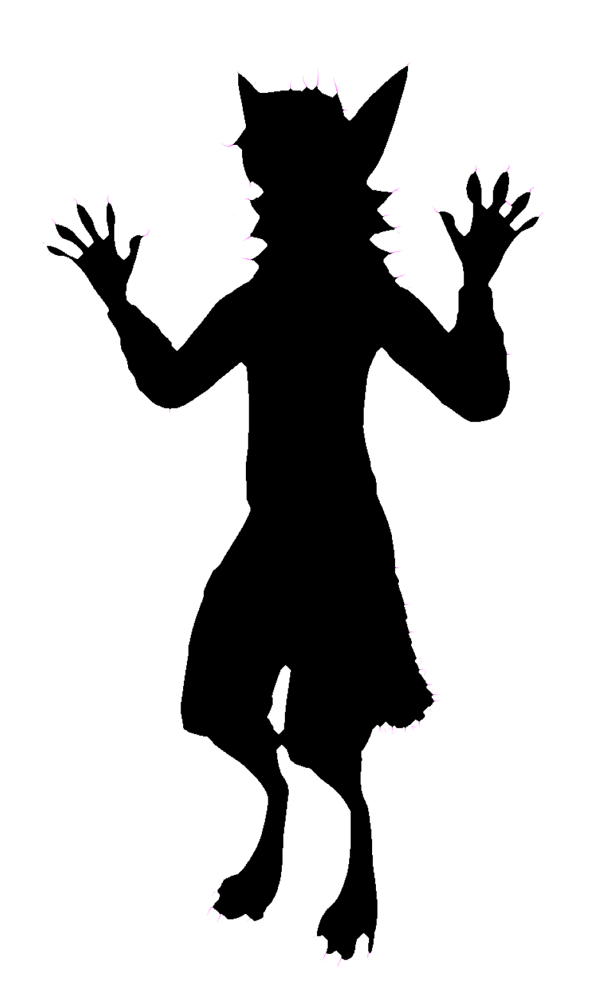

7816


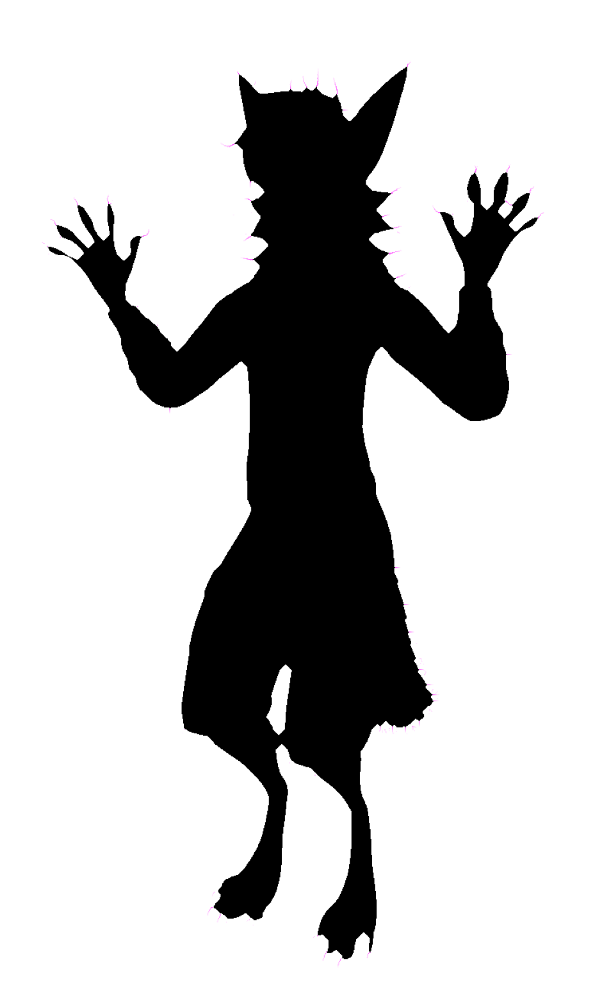

7784


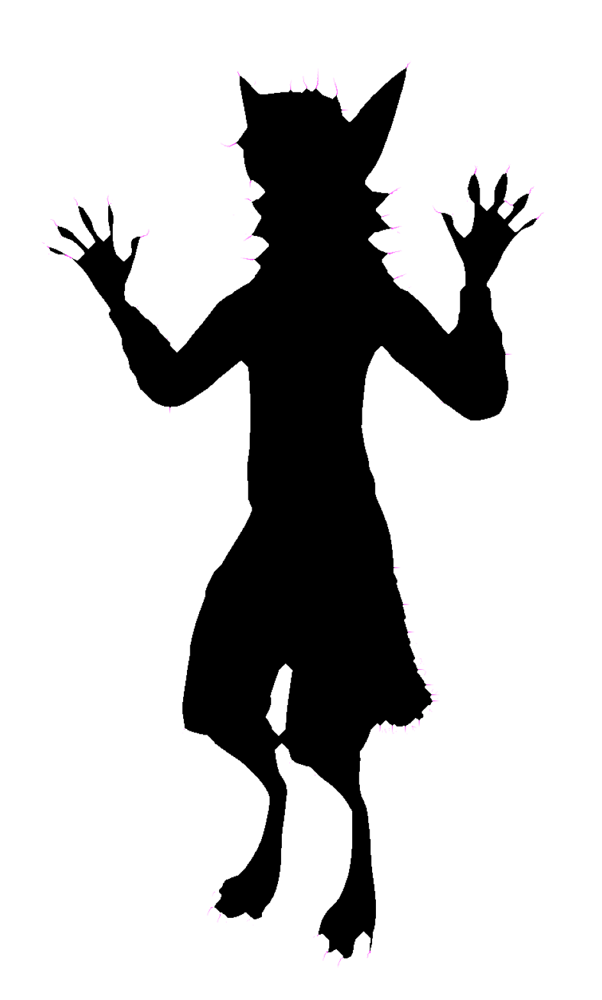

7728


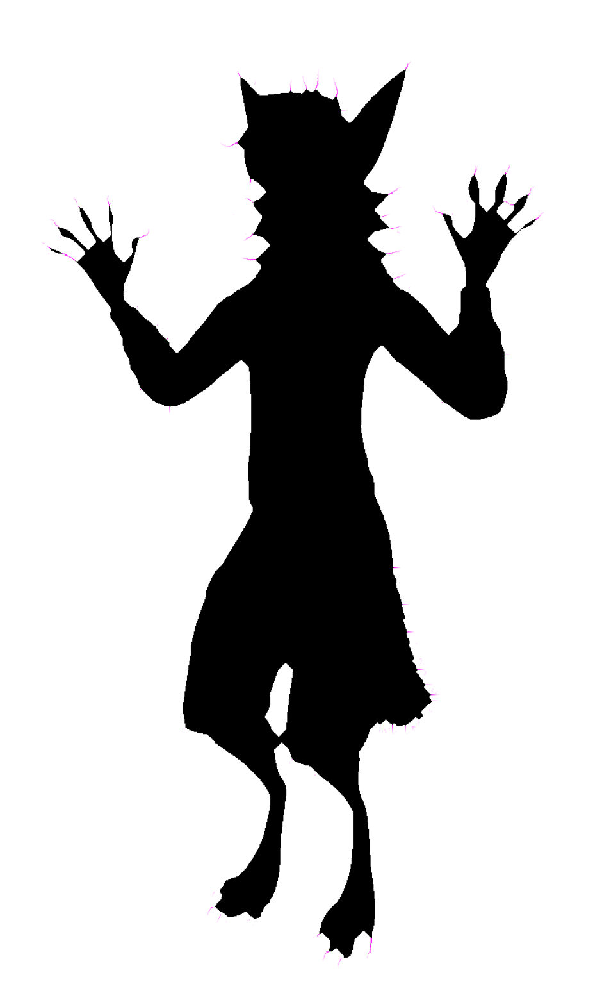

7656


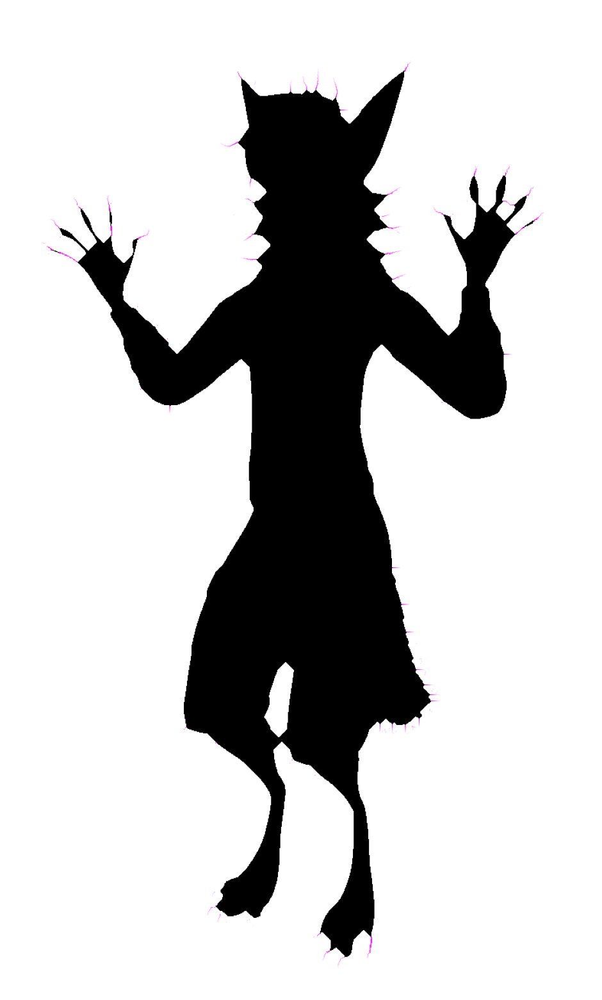

7524


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09999999999999987..1.0].


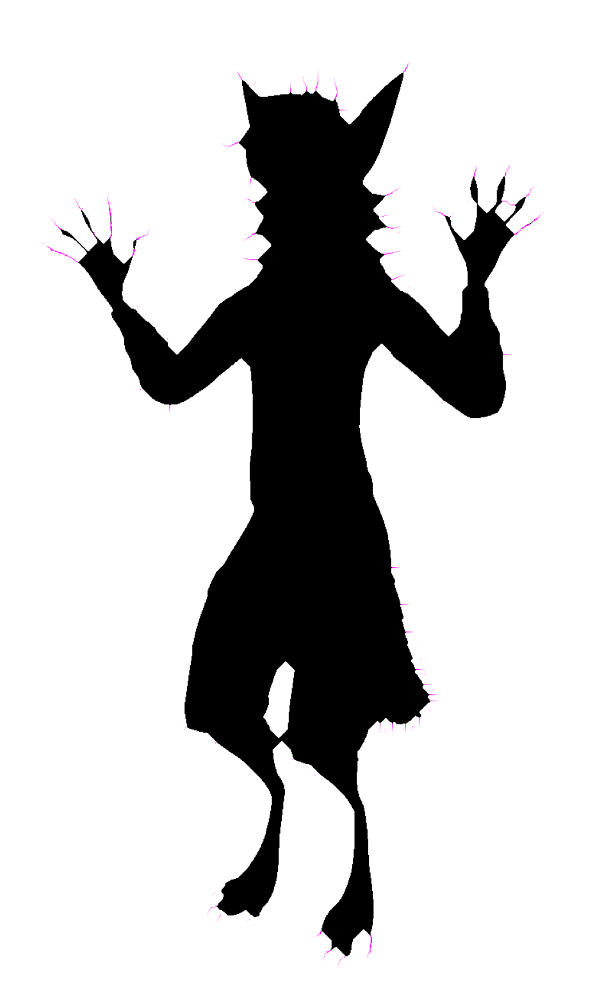

7392


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19999999999999996..1.0].


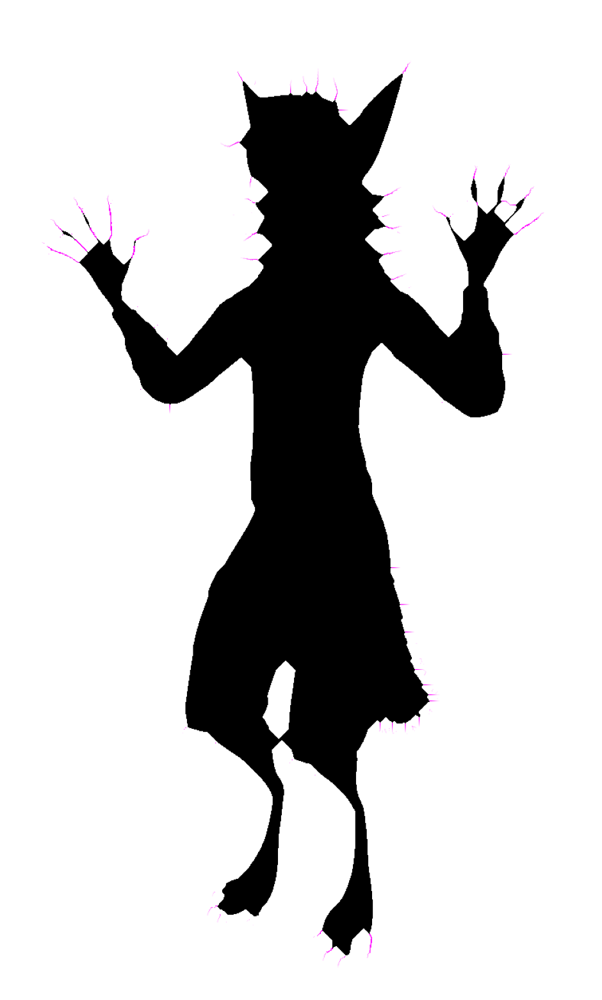

7186


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30000000000000004..1.0].


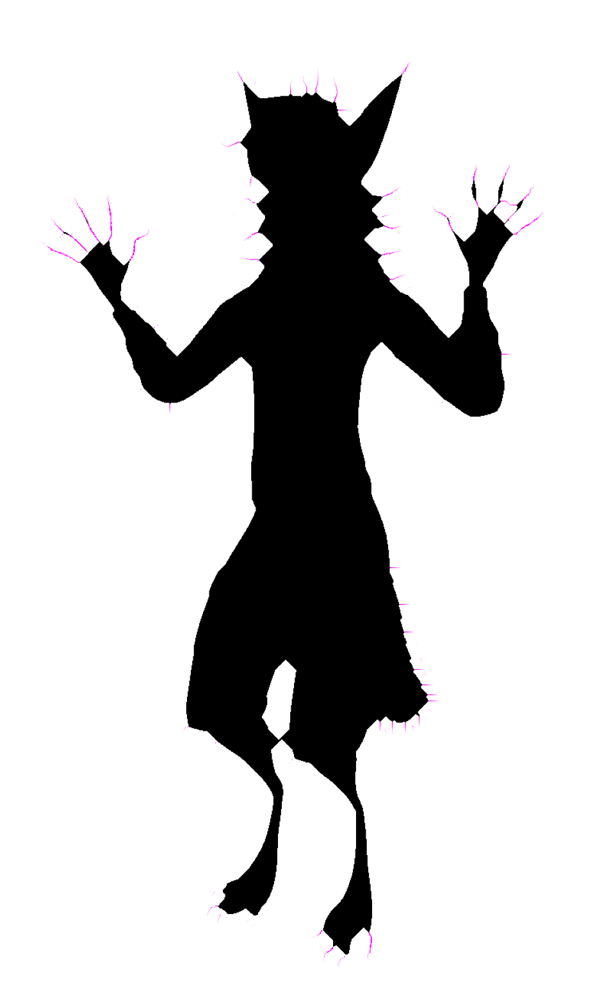

6978


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40000000000000013..1.0].


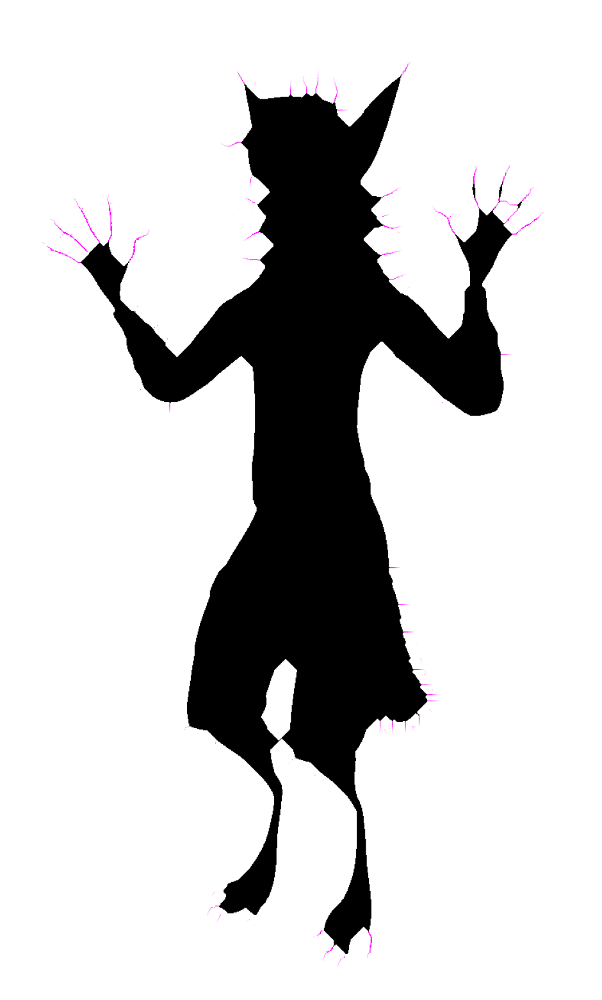

6768


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5000000000000002..1.0].


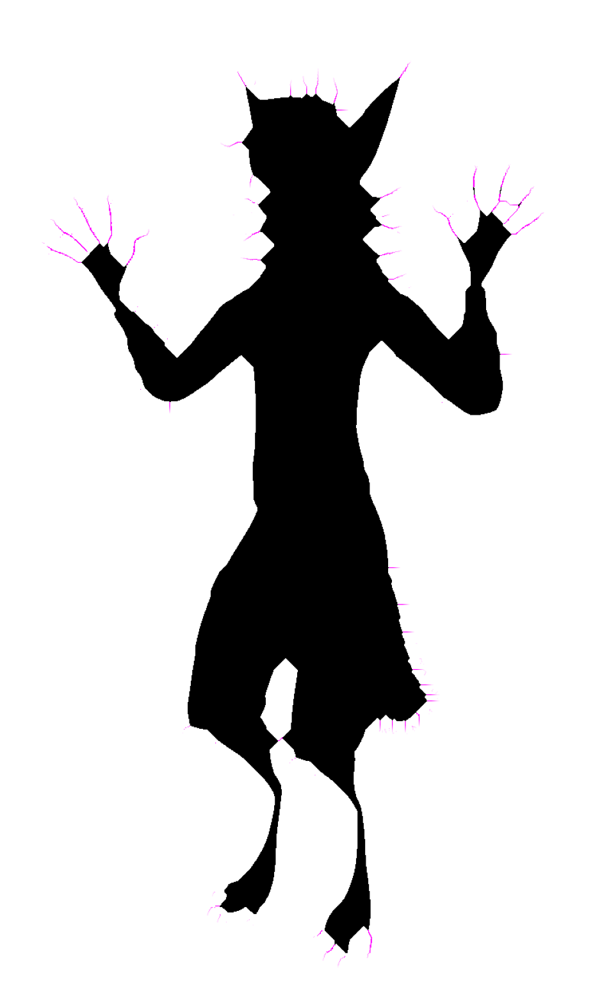

6624


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6000000000000003..1.0].


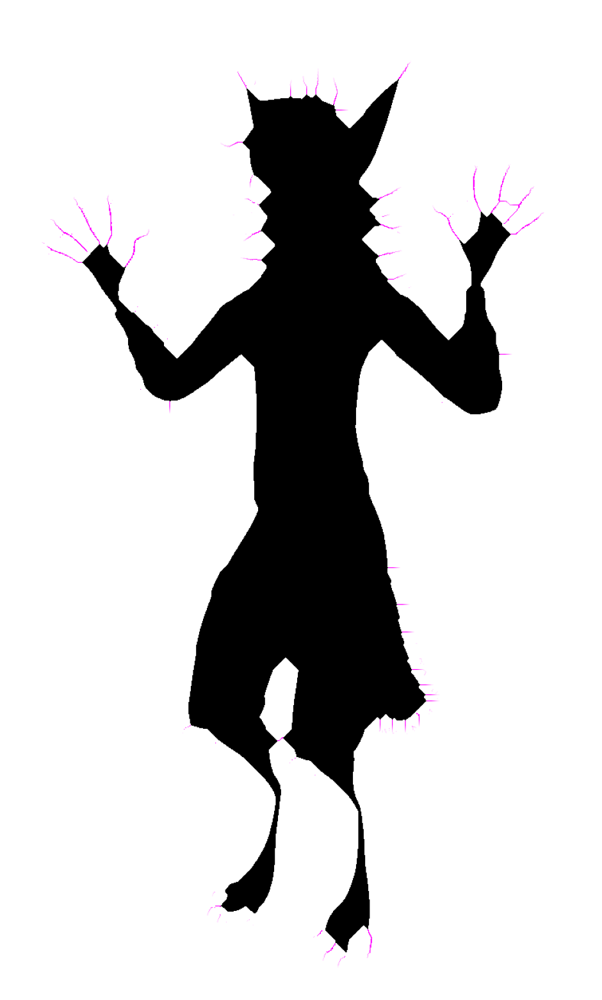

6514


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7000000000000004..1.0].


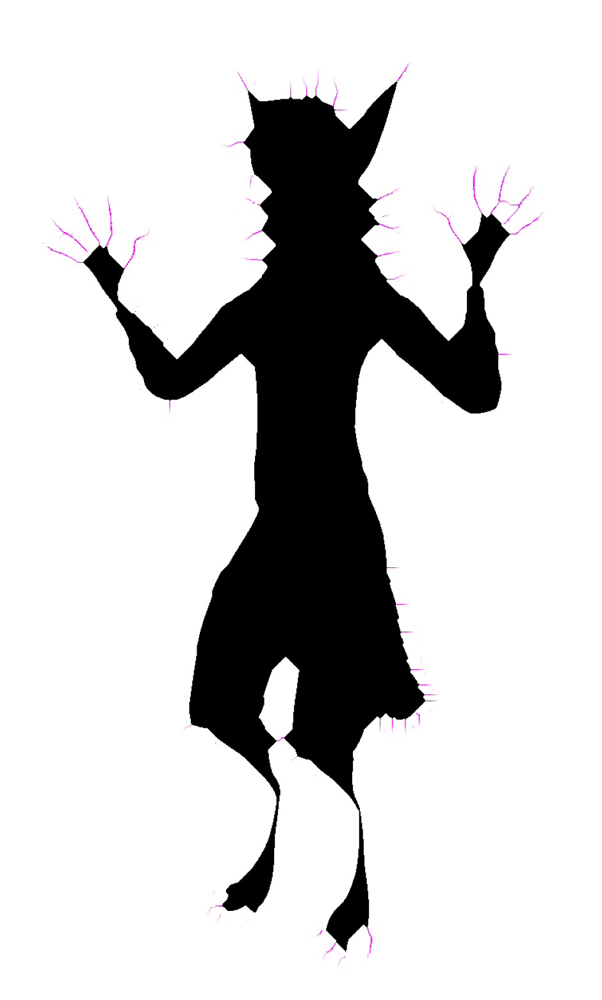

6476


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8000000000000005..1.0].


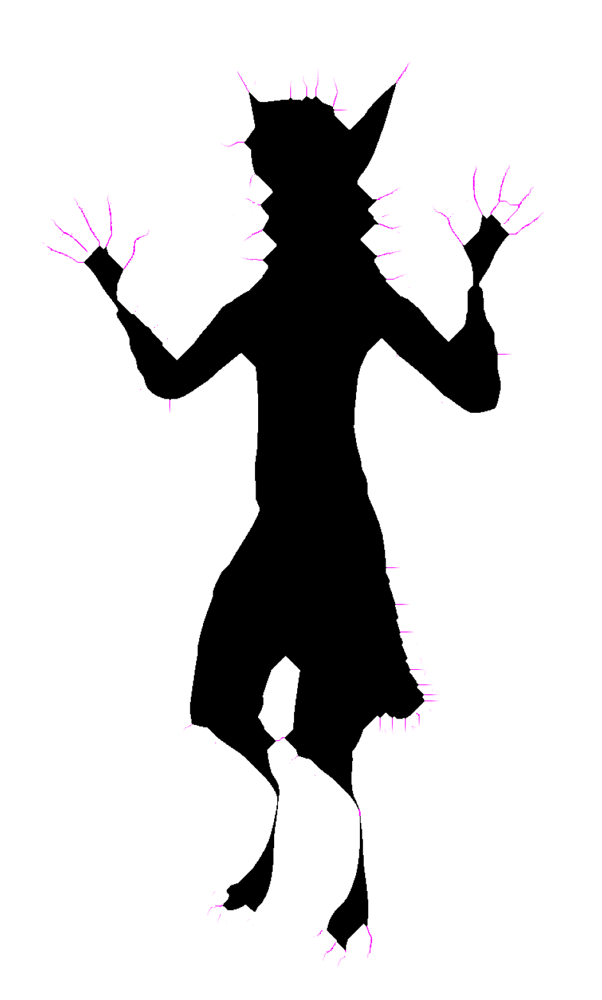

6426


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9000000000000006..1.0].


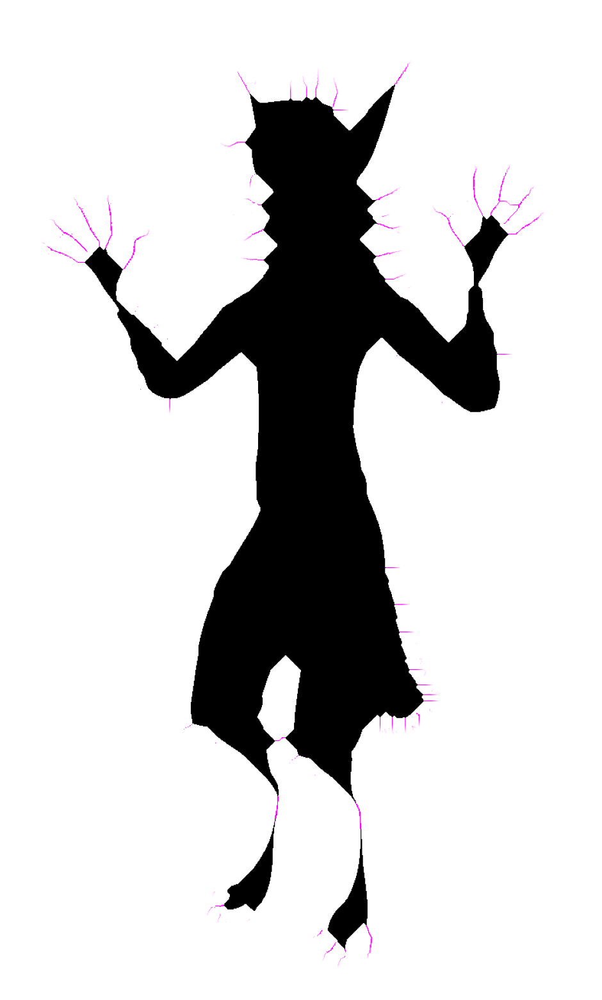

6280


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0000000000000004..1.0].


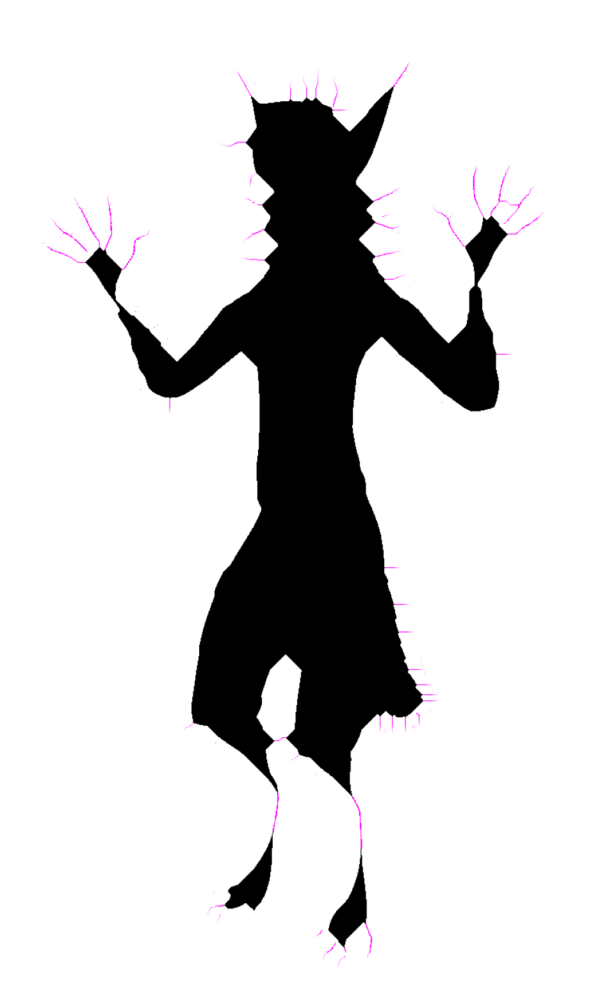

6118


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1000000000000005..1.0].


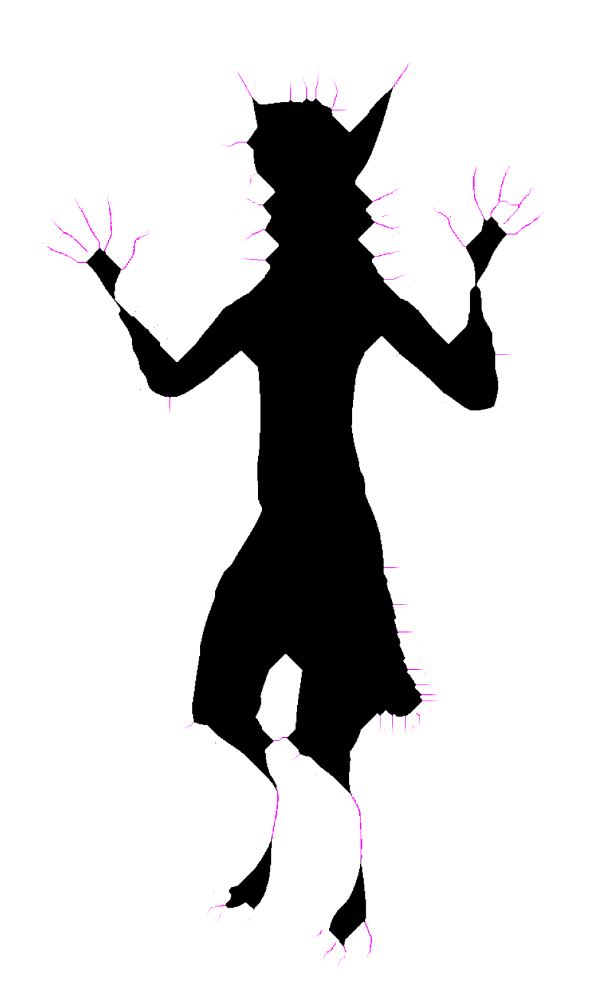

6028


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2000000000000006..1.0].


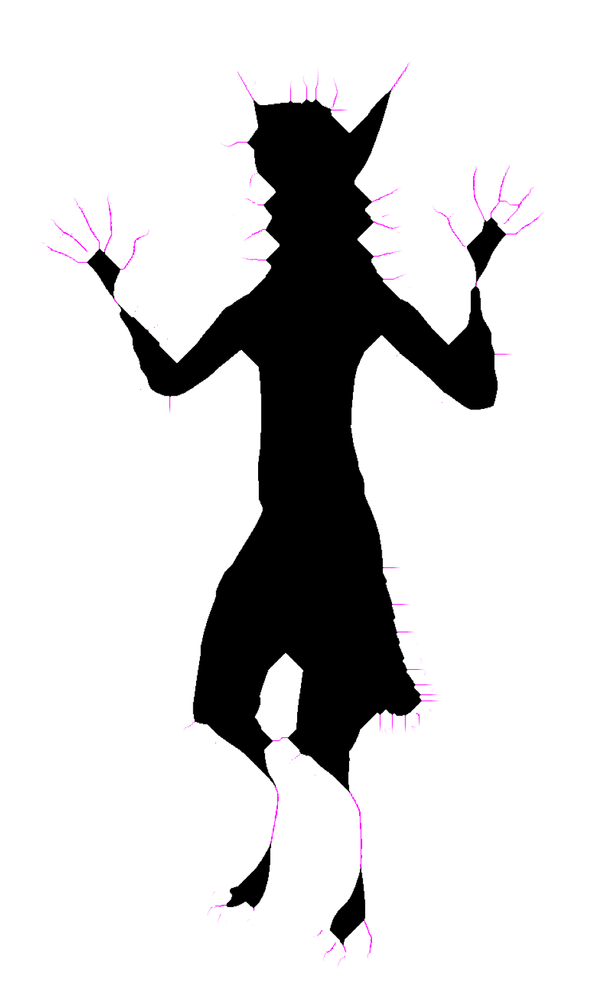

5916


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3000000000000007..1.0].


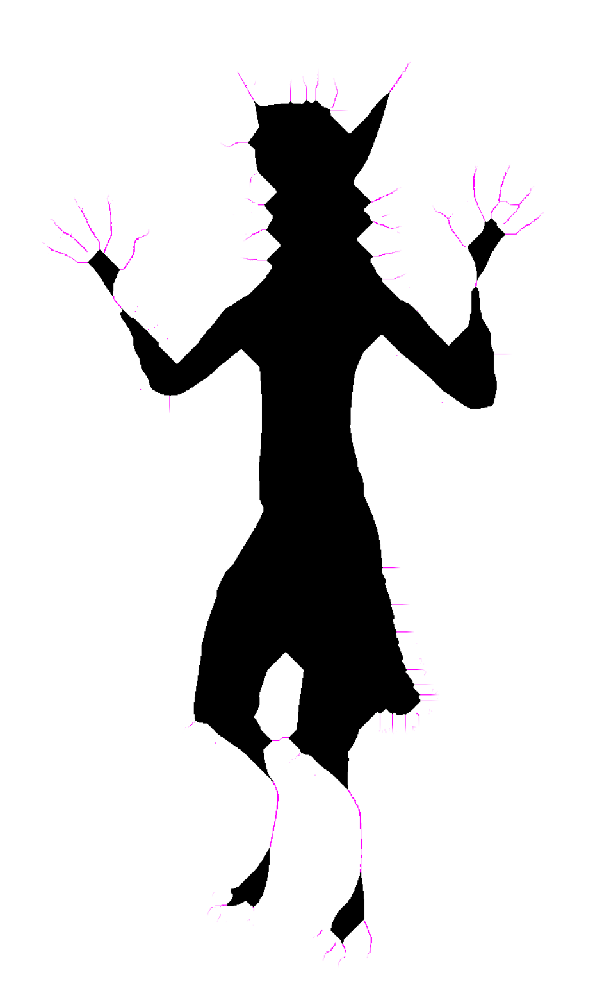

5796


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4000000000000008..1.0].


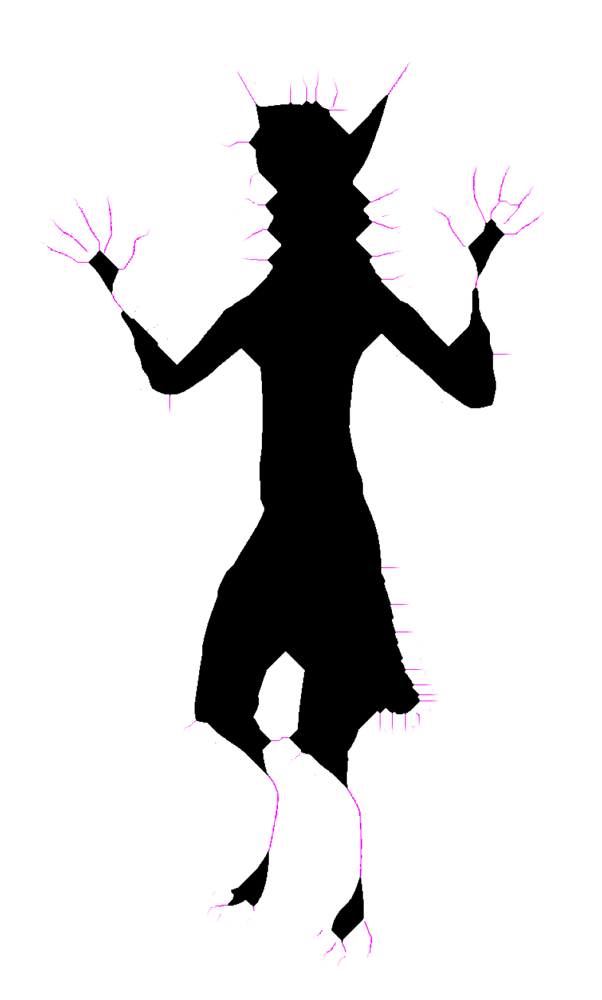

5684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5000000000000009..1.0].


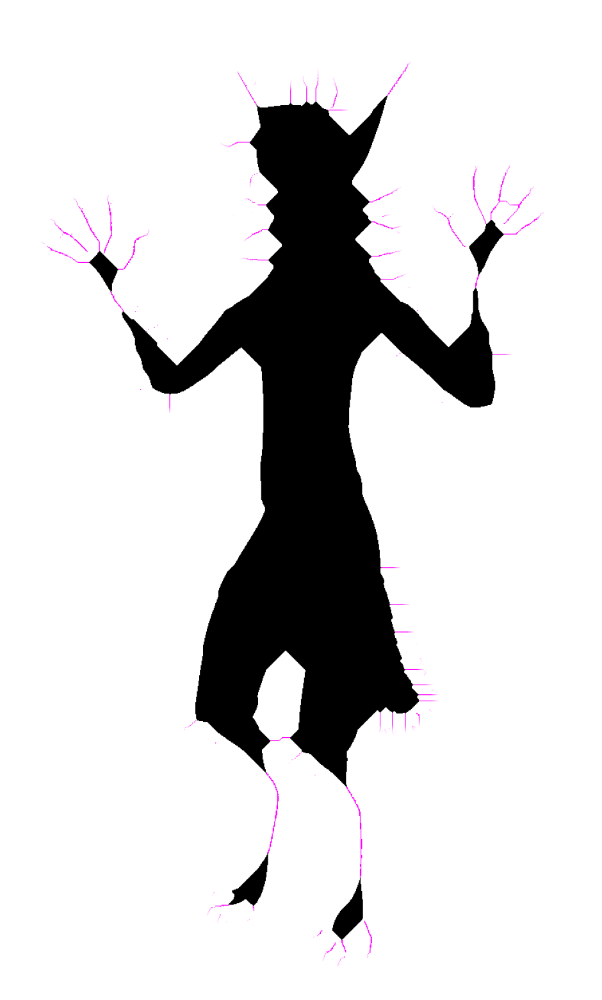

5592


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.600000000000001..1.0].


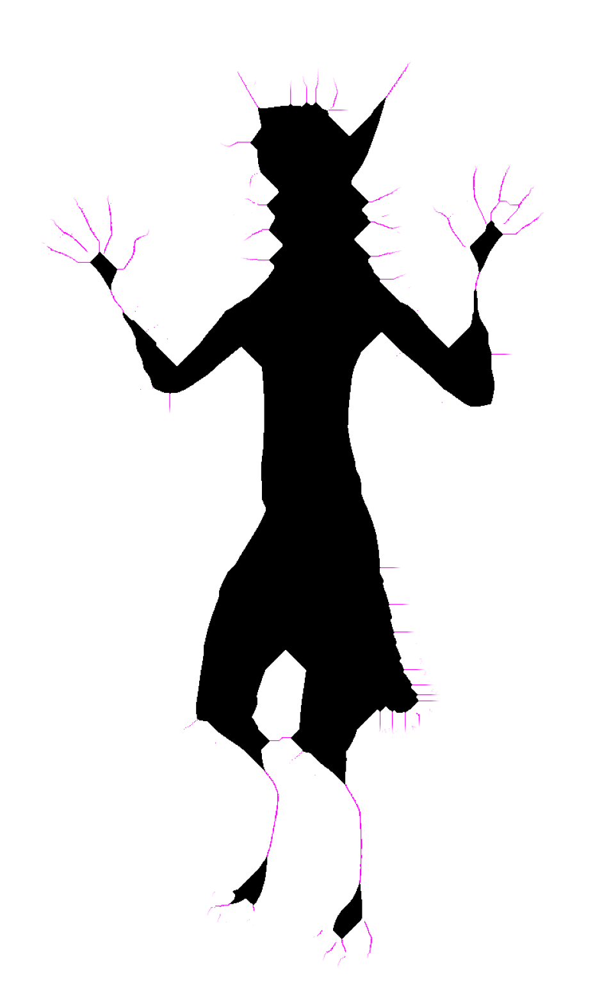

5516


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.700000000000001..1.0].


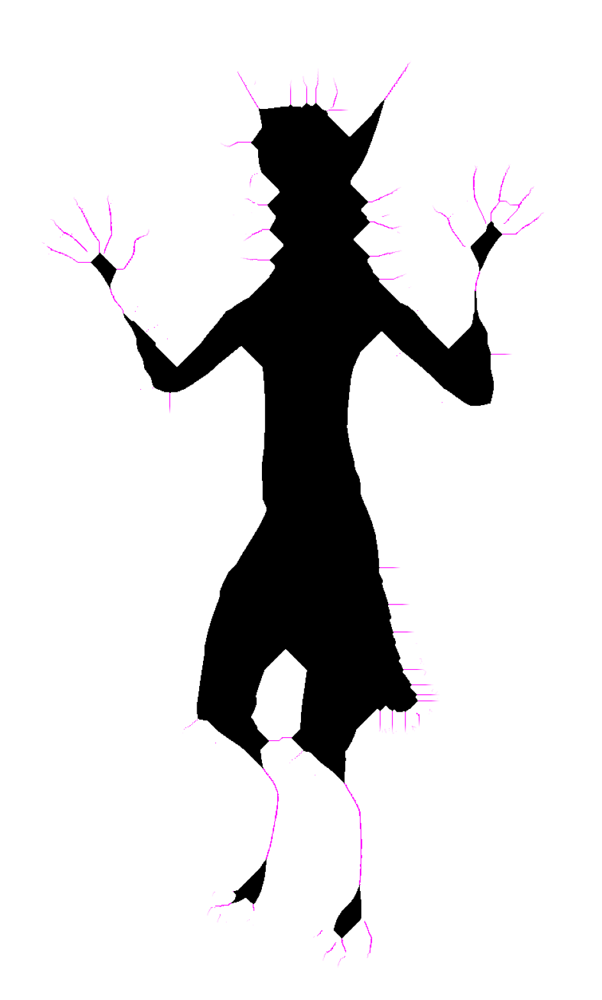

5440


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8000000000000012..1.0].


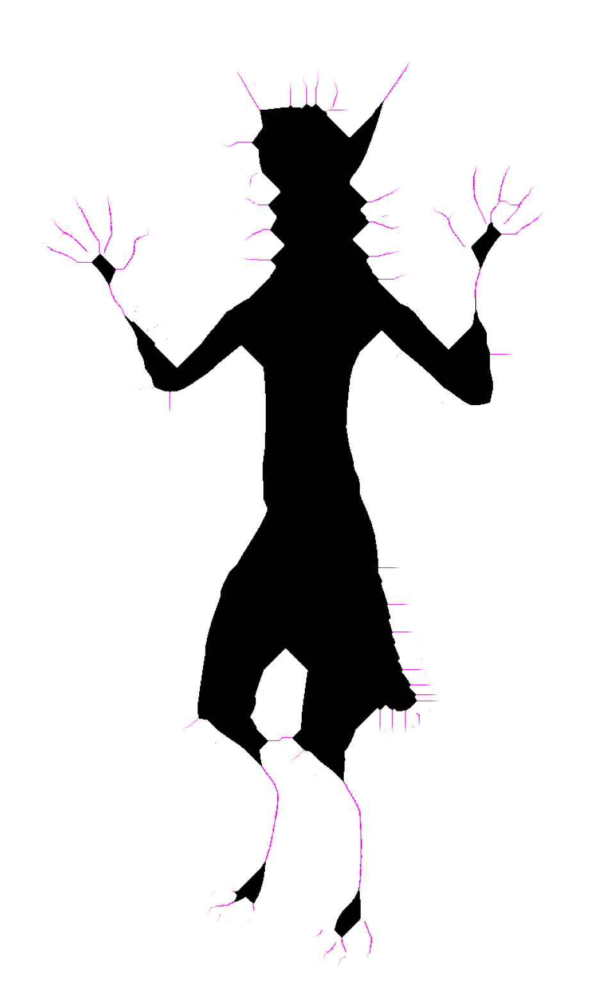

5342


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9000000000000012..1.0].


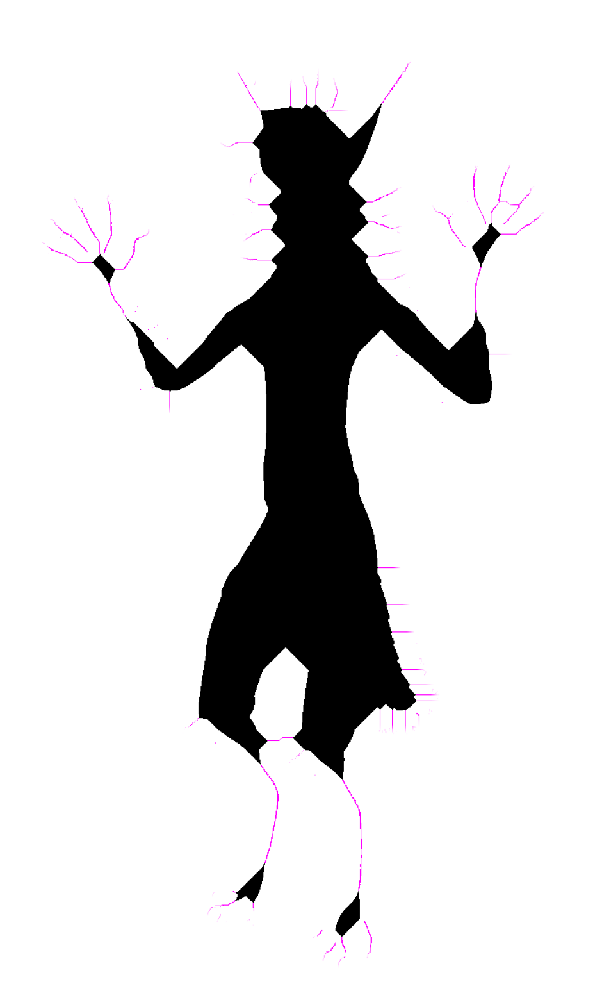

5226


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0000000000000013..1.0].


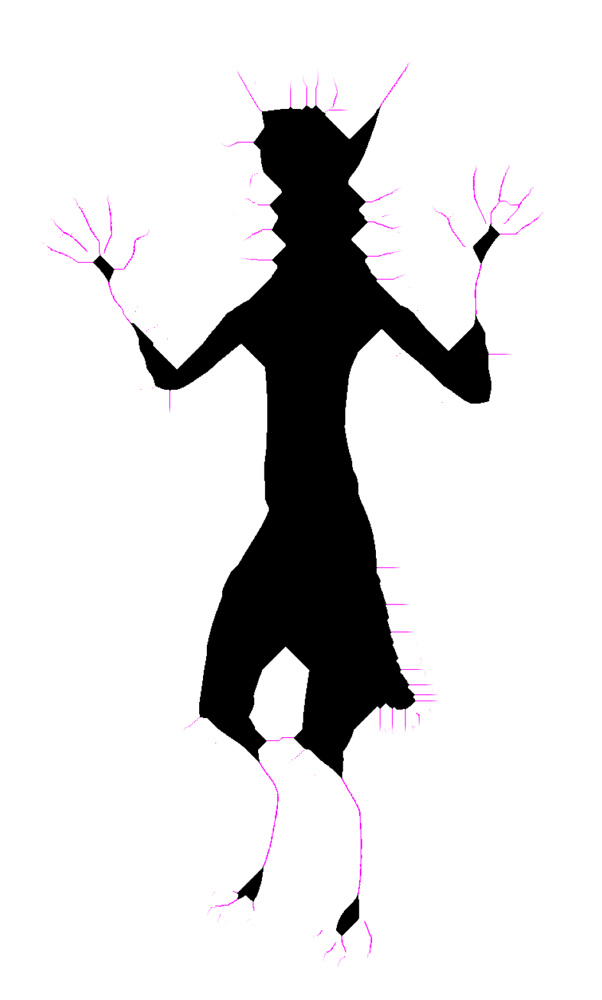

5124


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1000000000000014..1.0].


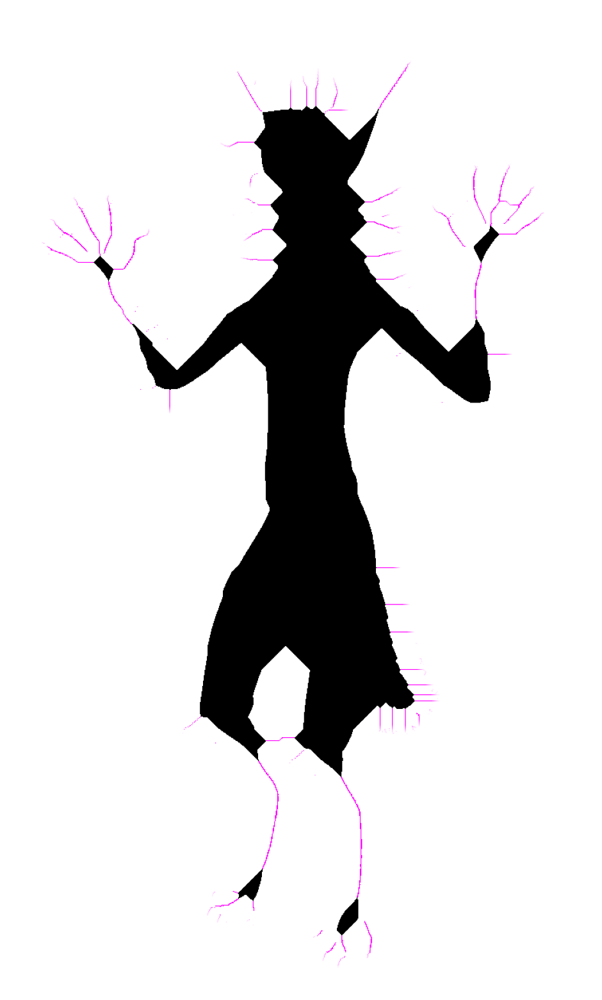

5036


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.2000000000000015..1.0].


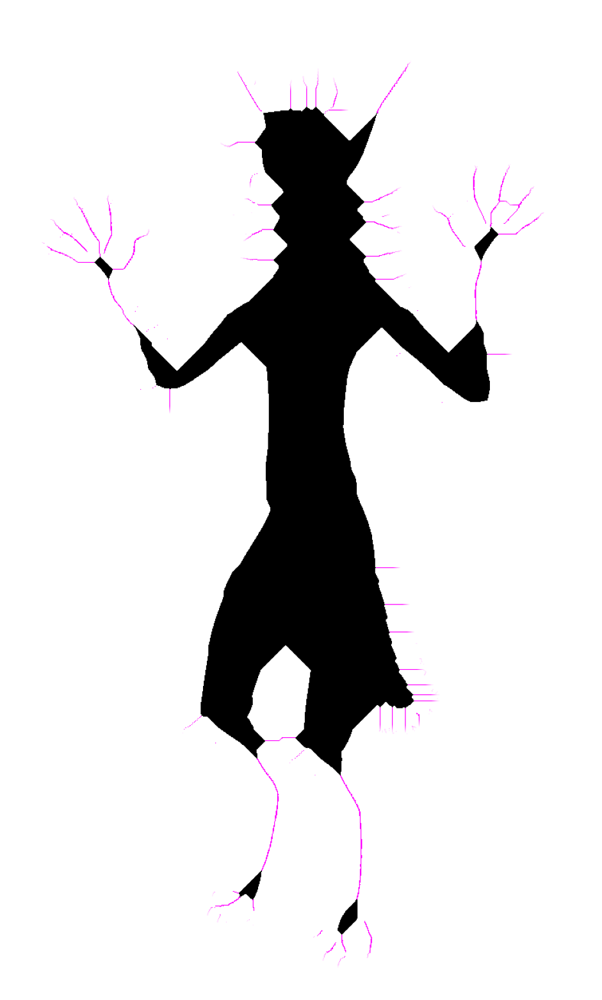

4958


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.3000000000000016..1.0].


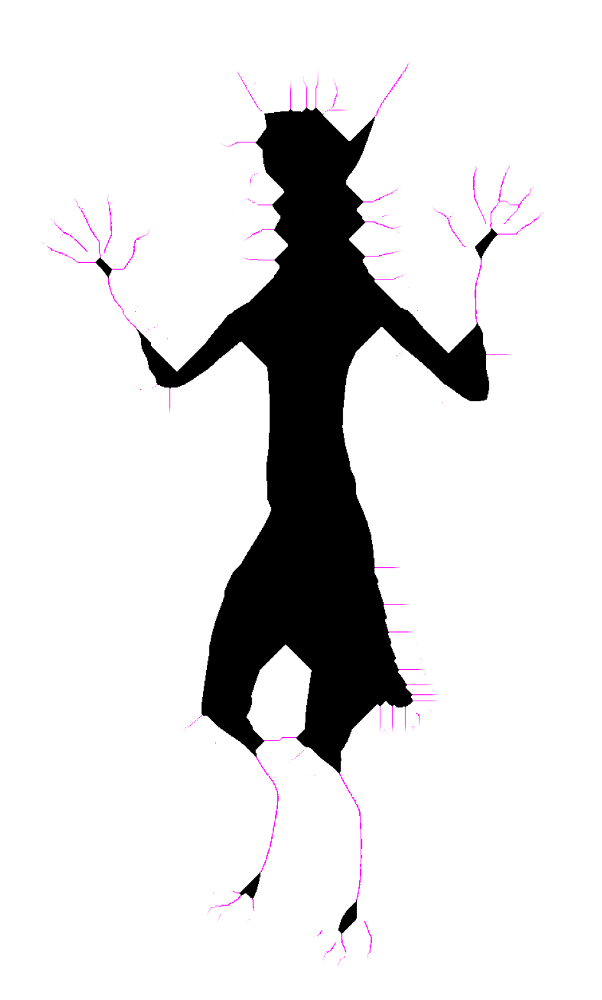

4870


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.4000000000000017..1.0].


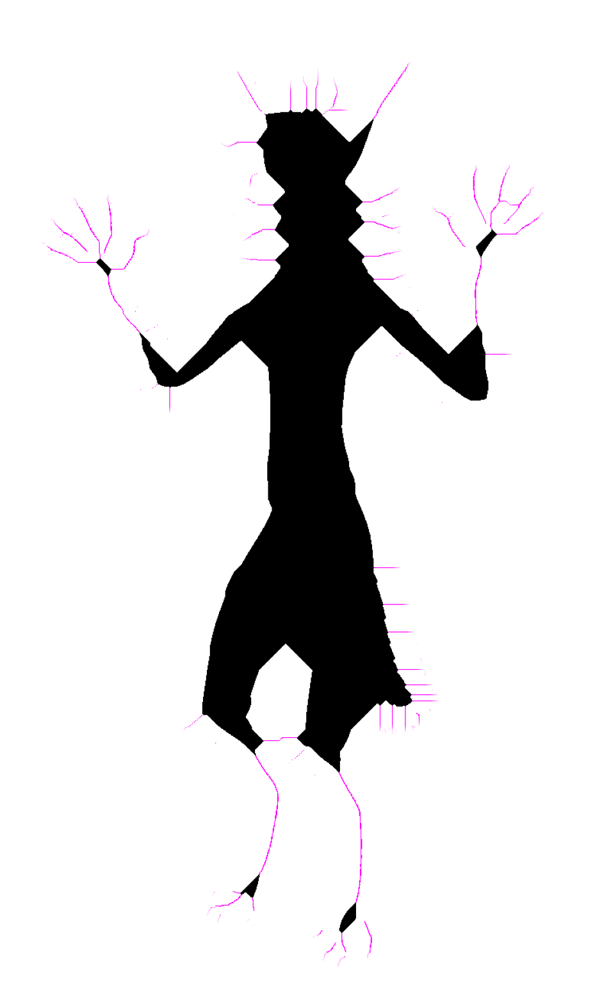

4796


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.5000000000000018..1.0].


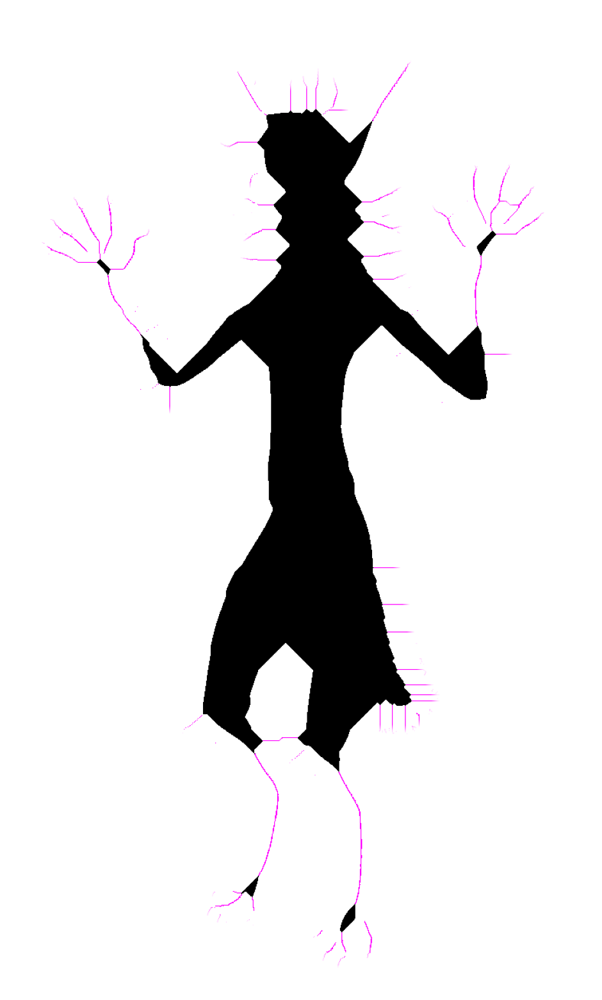

4732


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.600000000000002..1.0].


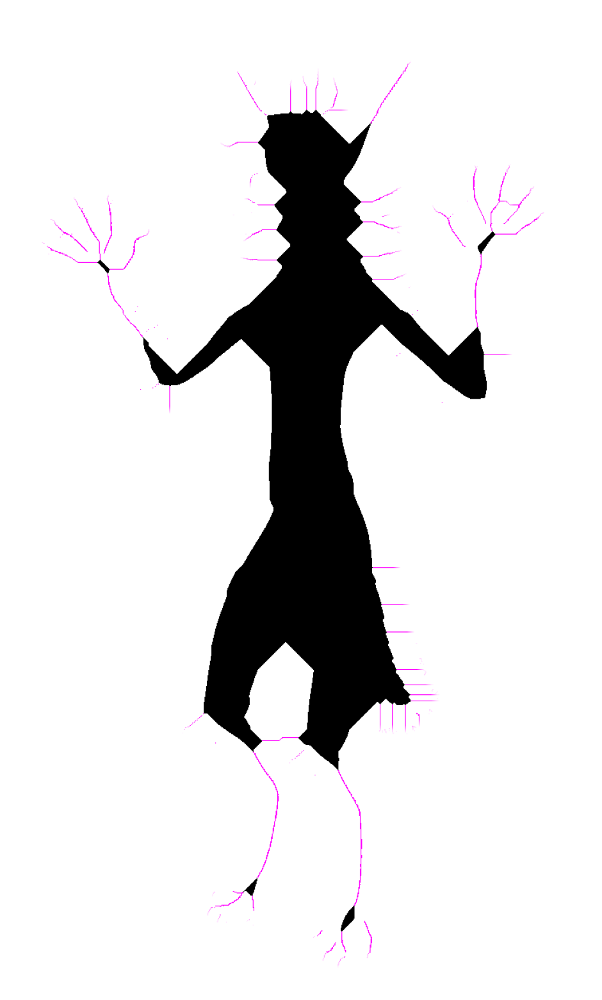

4648


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.700000000000002..1.0].


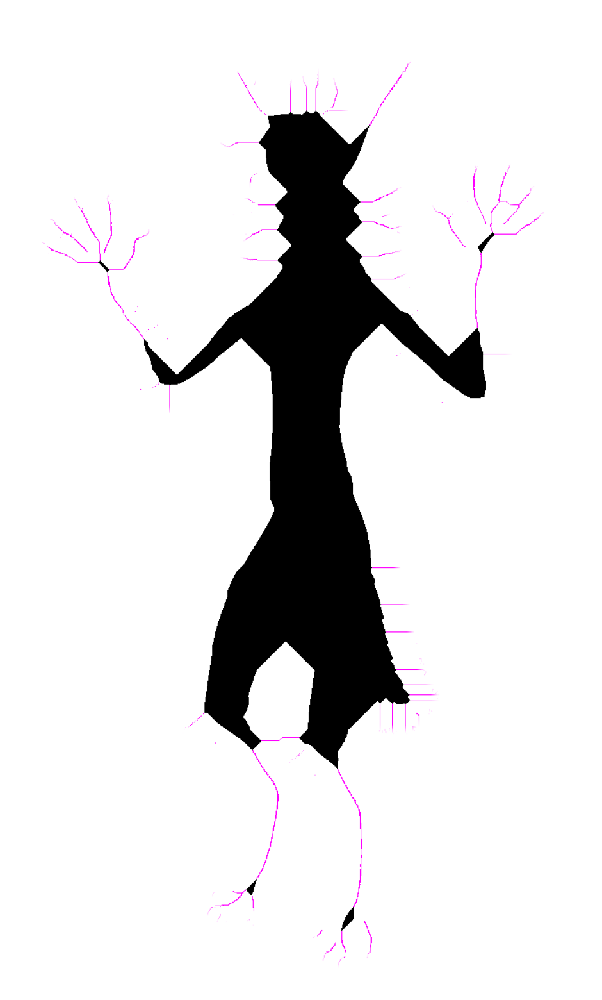

4576


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.800000000000002..1.0].


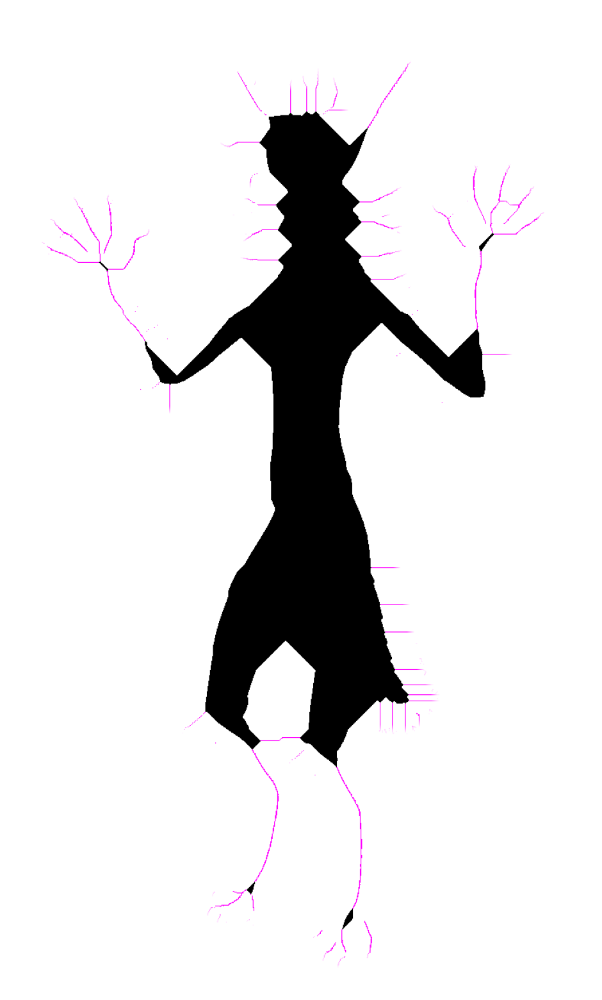

4508


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.900000000000002..1.0].


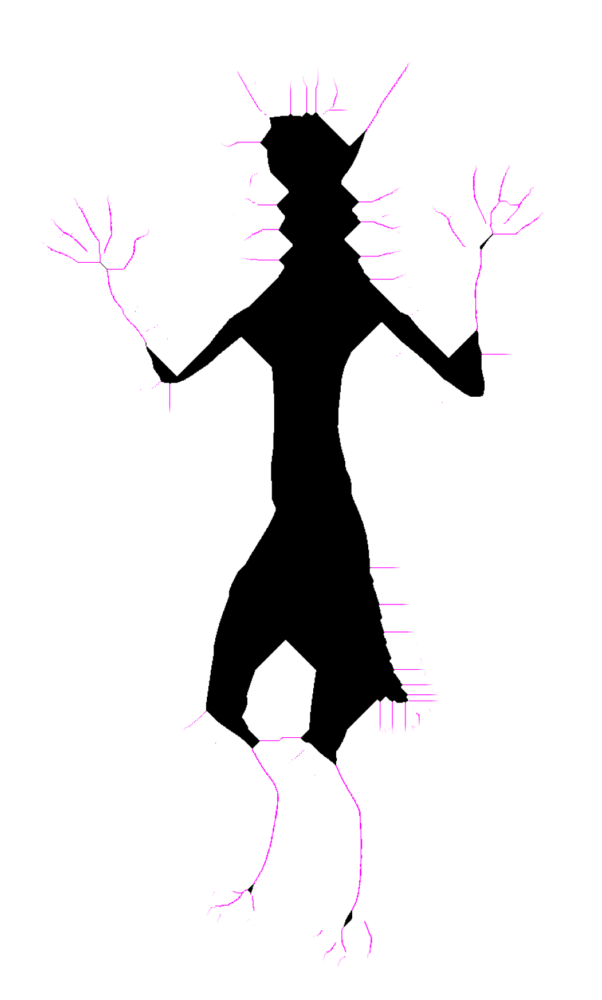

4444


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.0000000000000018..1.0].


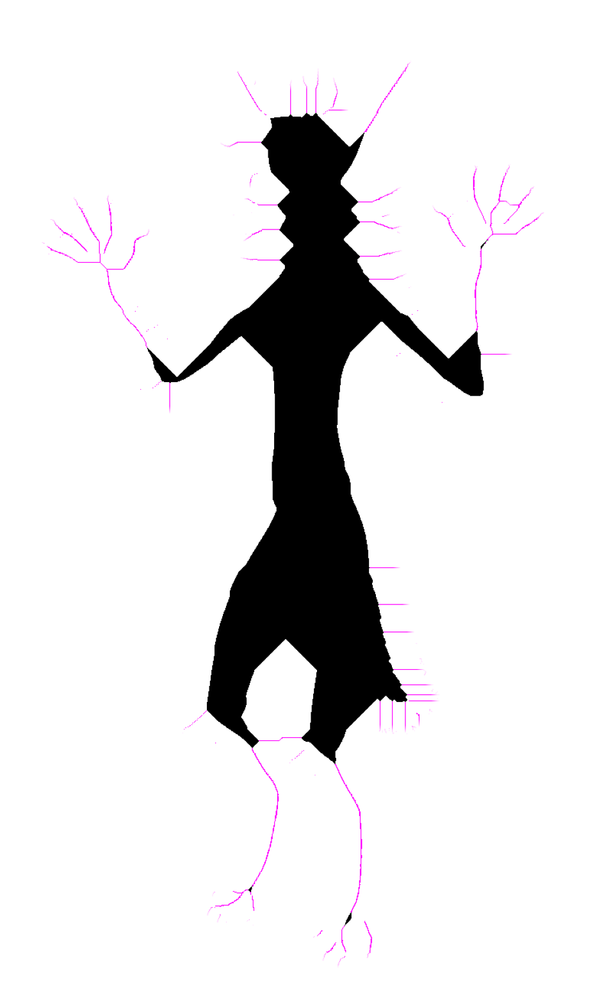

4306


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.1000000000000014..1.0].


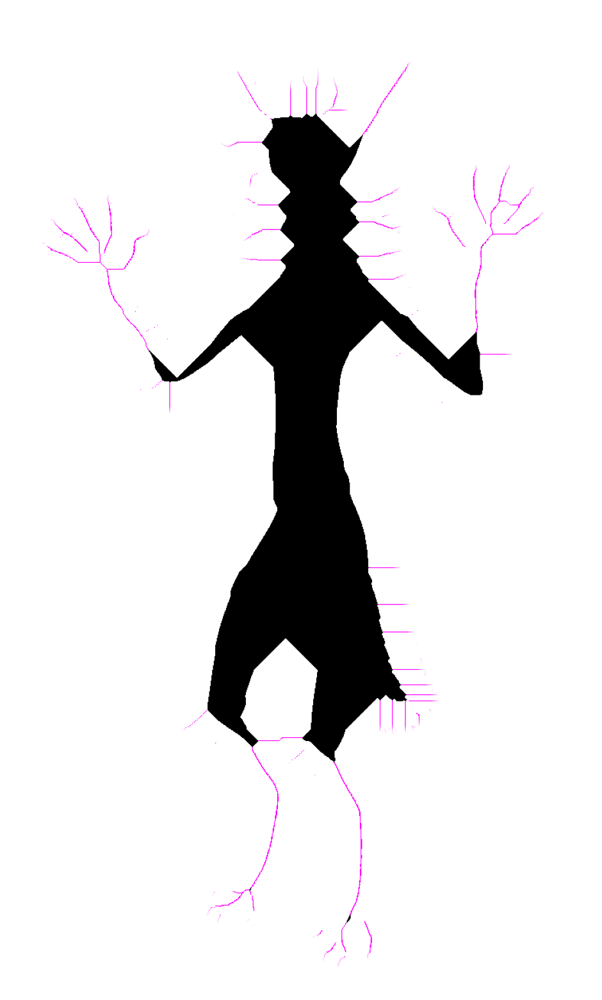

4216


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.200000000000001..1.0].


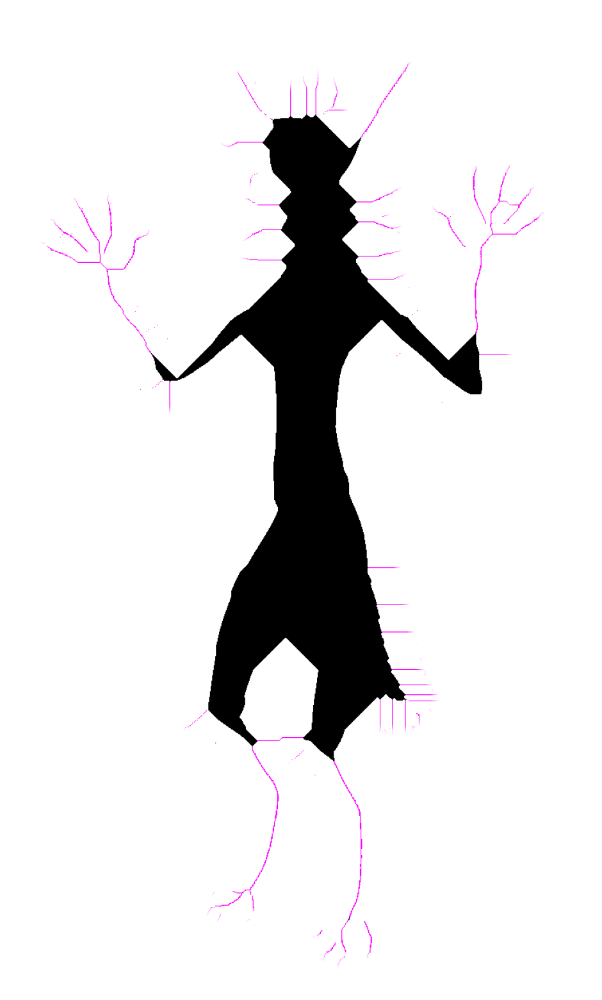

4148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.3000000000000007..1.0].


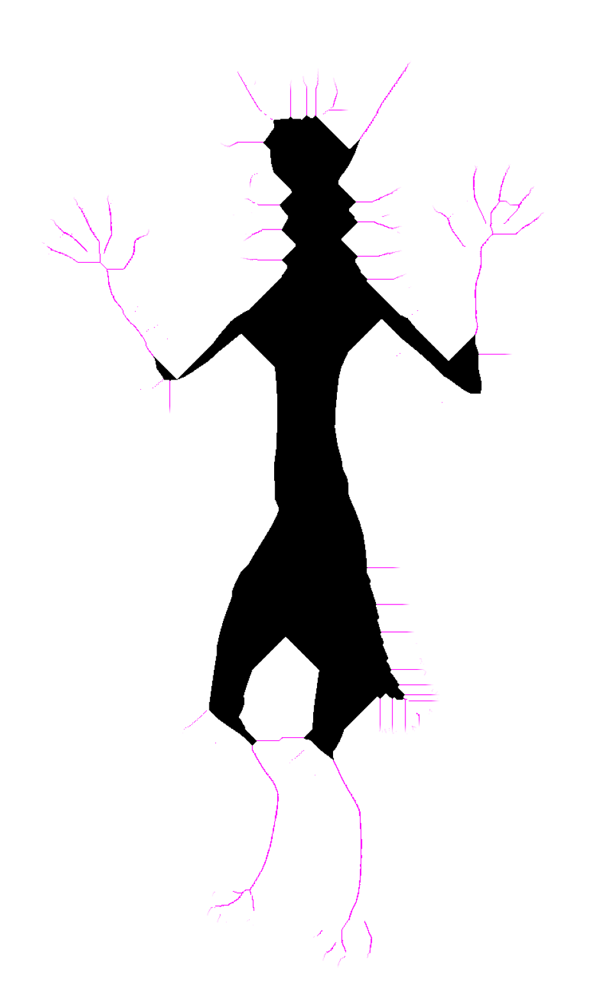

4100


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.4000000000000004..1.0].


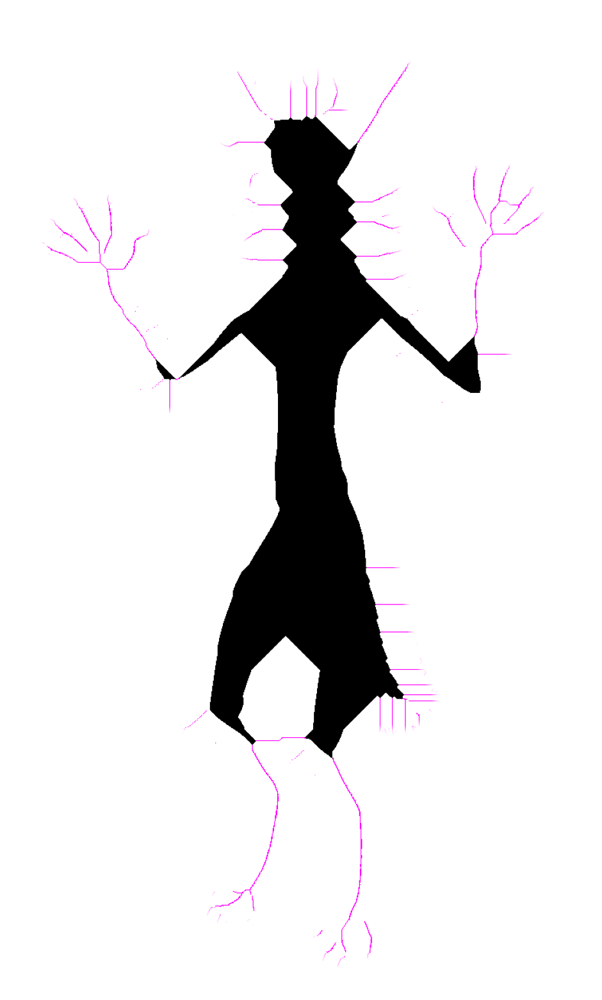

4056


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.5..1.0].


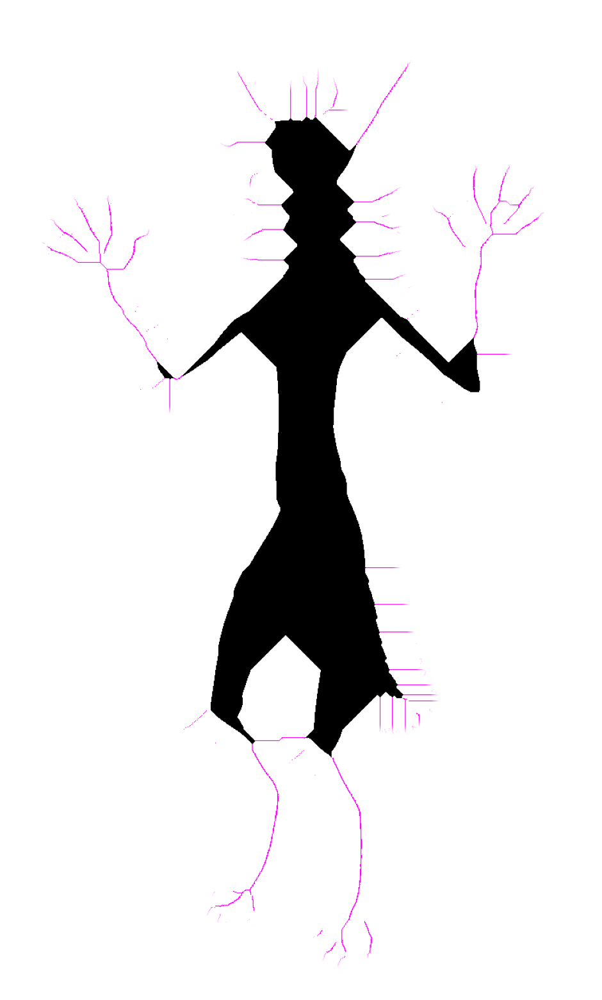

4010


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.5999999999999996..1.0].


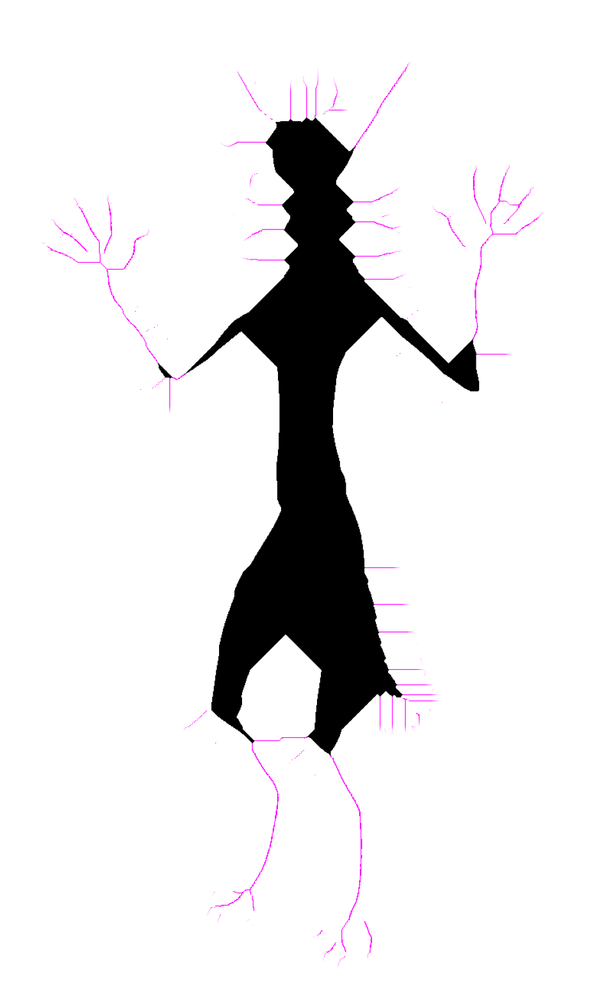

3972


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.6999999999999993..1.0].


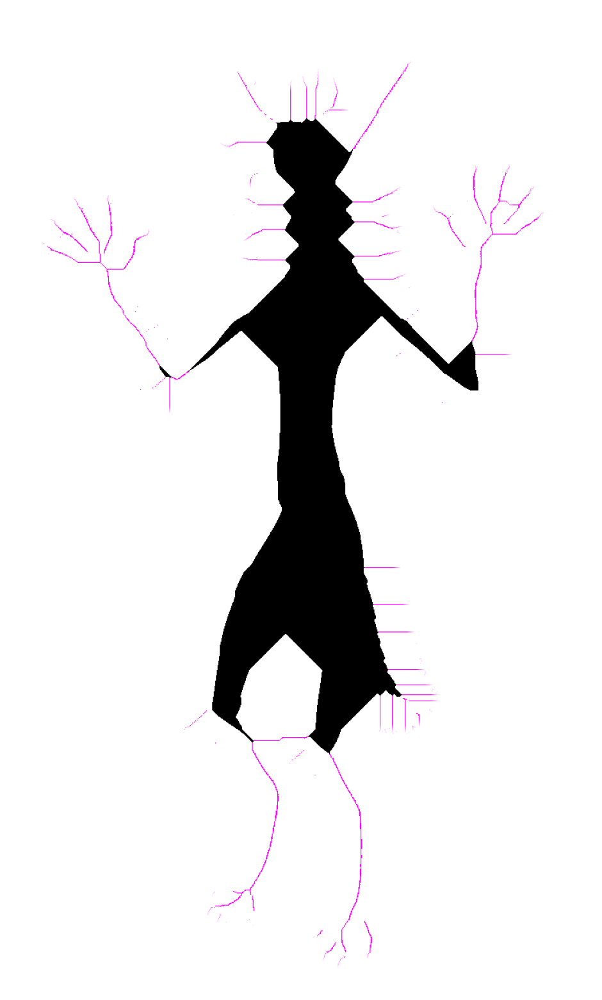

3918


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.799999999999999..1.0].


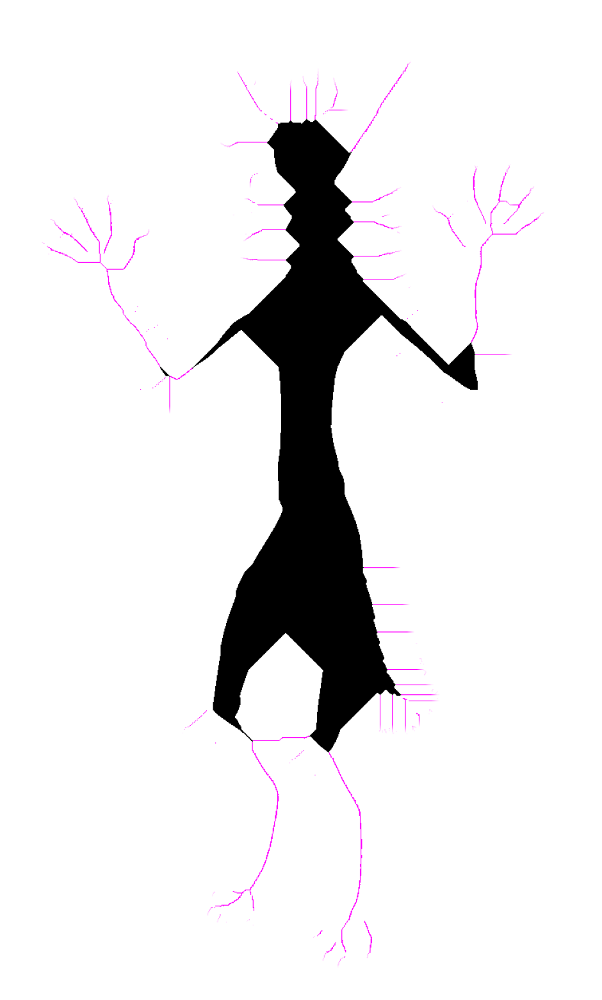

3874


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8999999999999986..1.0].


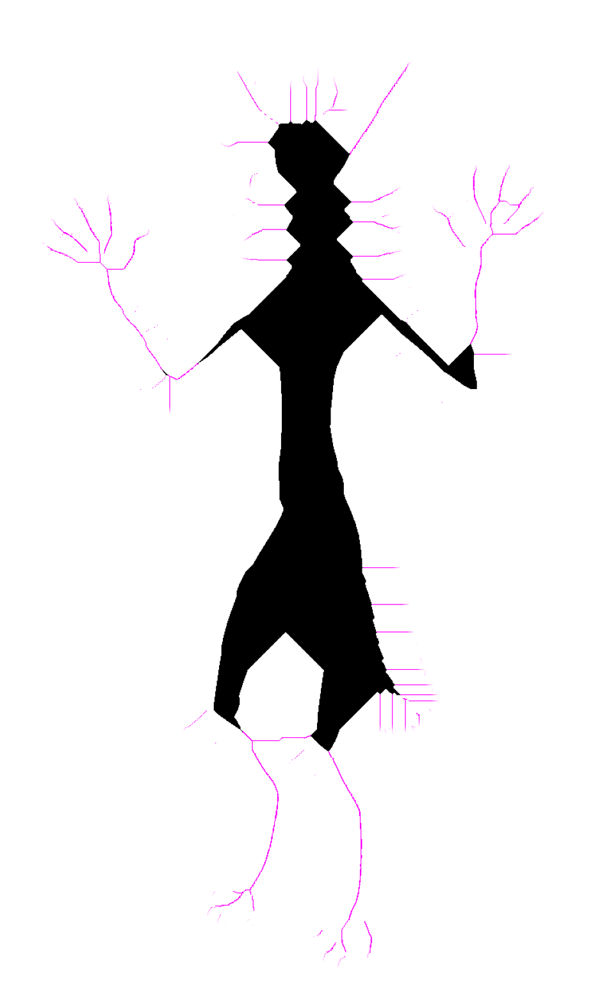

3766


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.9999999999999982..1.0].


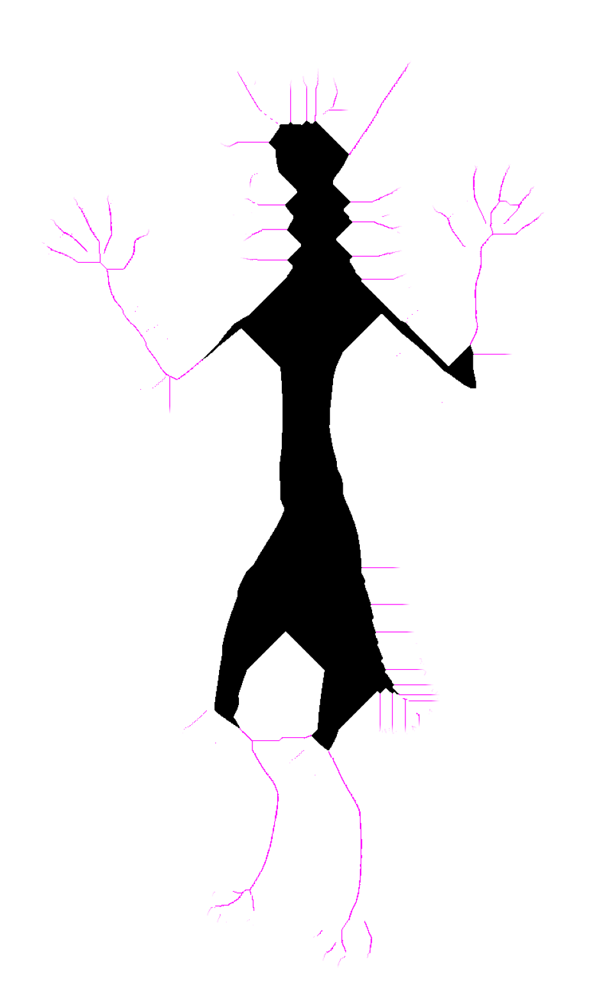

3692


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.099999999999998..1.0].


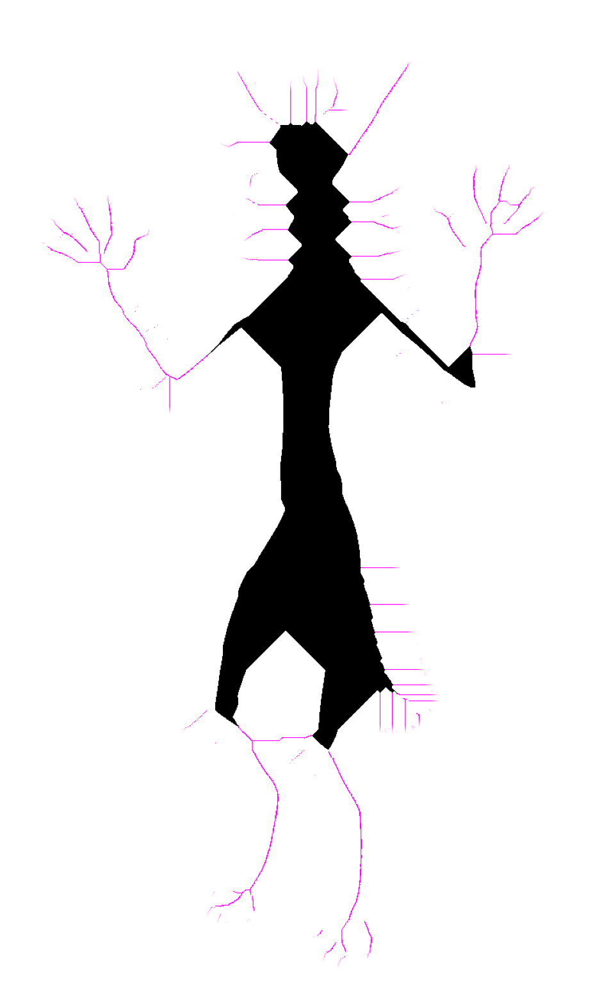

3662


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.1999999999999975..1.0].


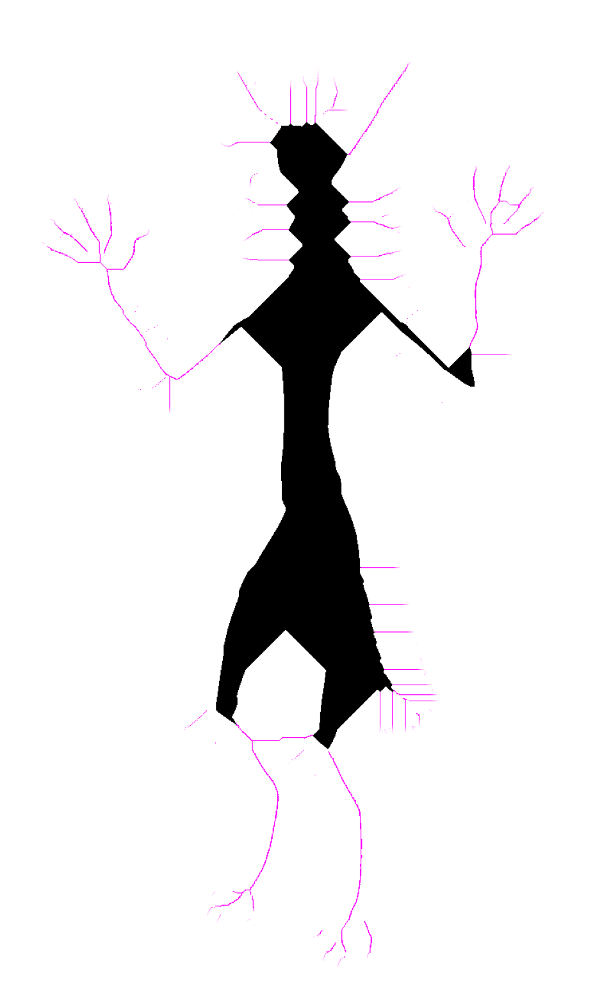

3570


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.299999999999997..1.0].


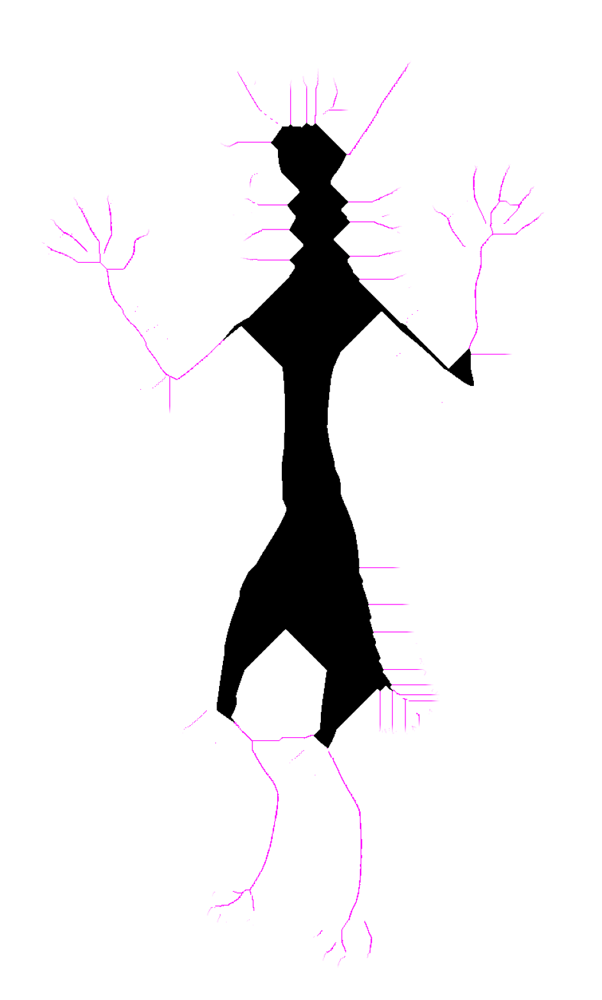

3536


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.399999999999997..1.0].


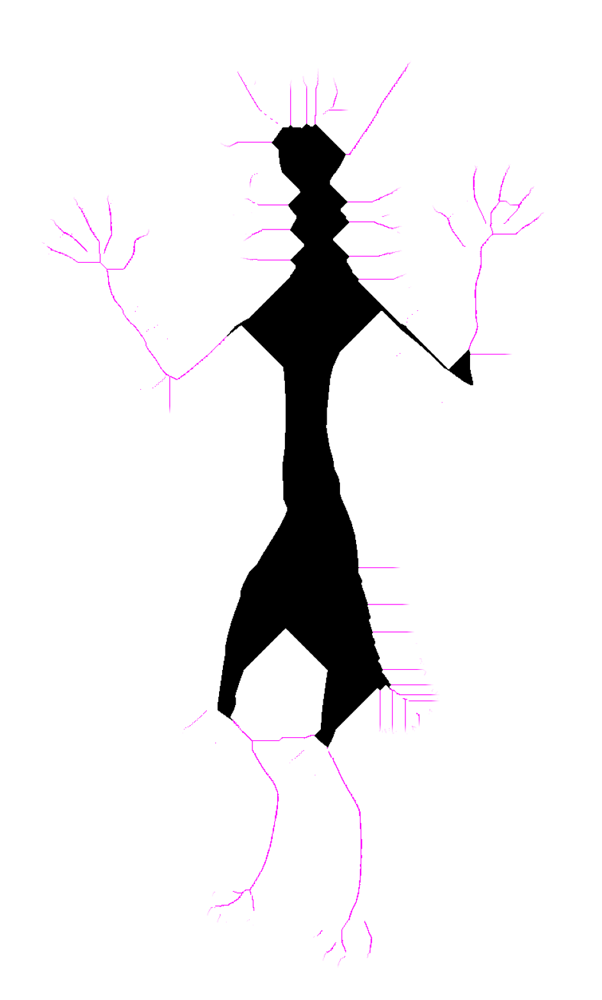

3500


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.4999999999999964..1.0].


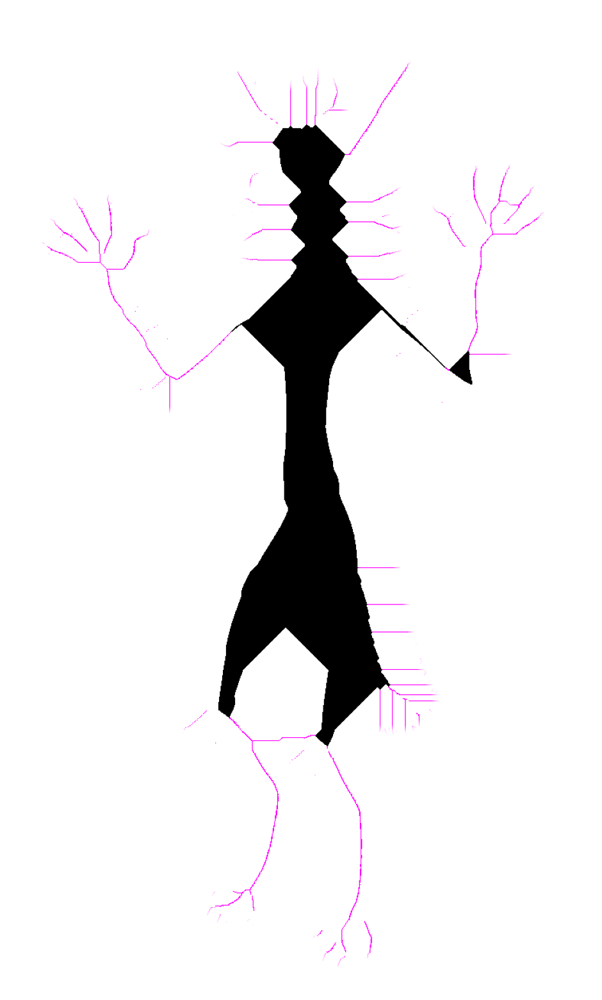

3446


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.599999999999996..1.0].


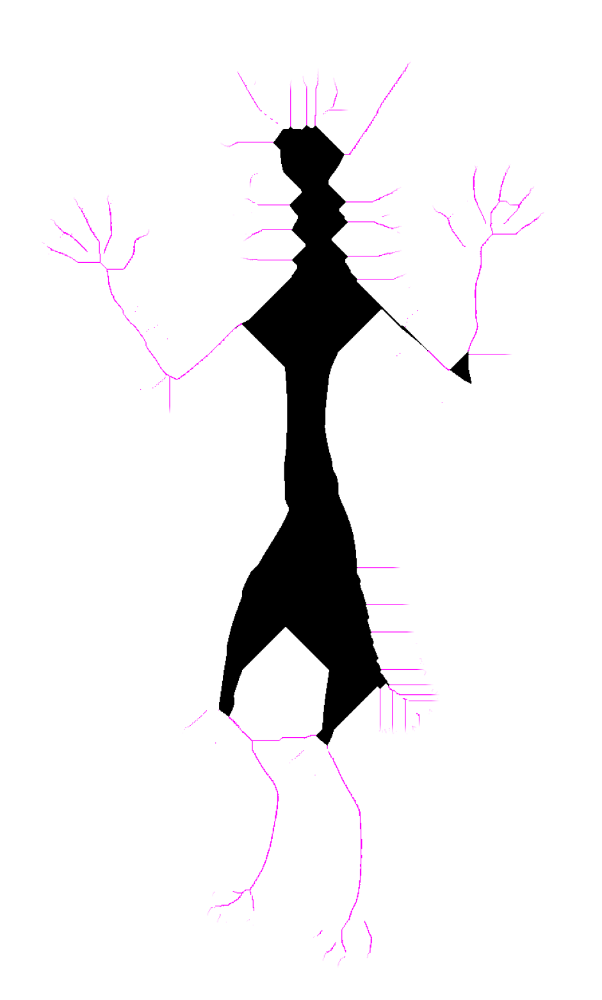

3298


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.699999999999996..1.0].


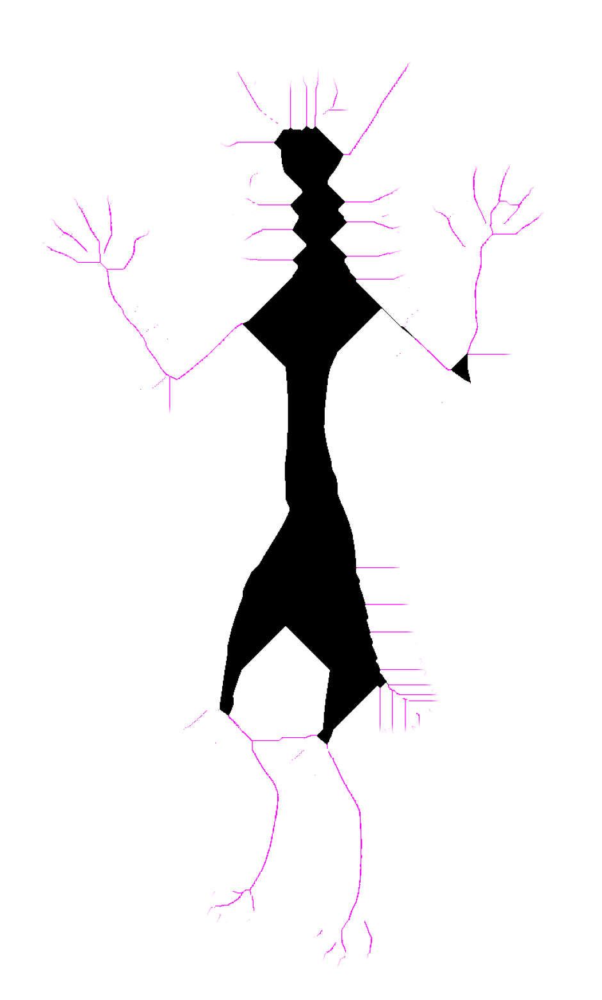

3212


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.799999999999995..1.0].


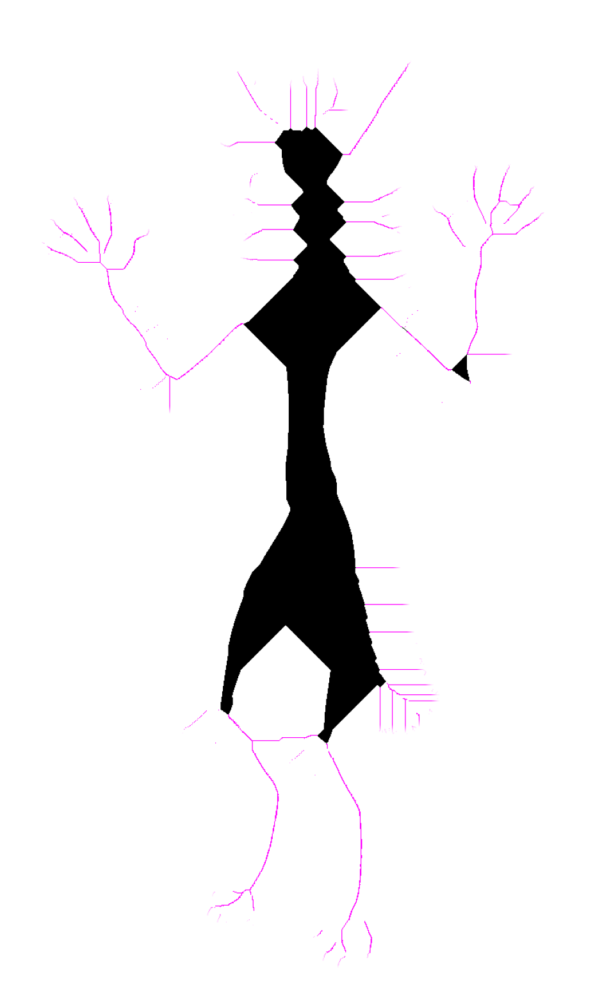

3038


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.899999999999995..1.0].


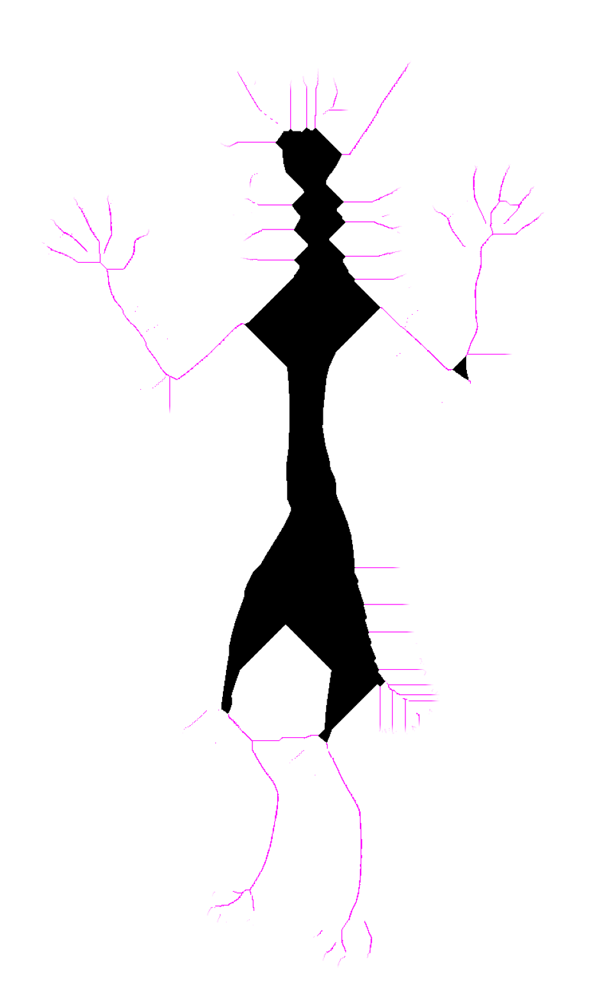

2986


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.999999999999995..1.0].


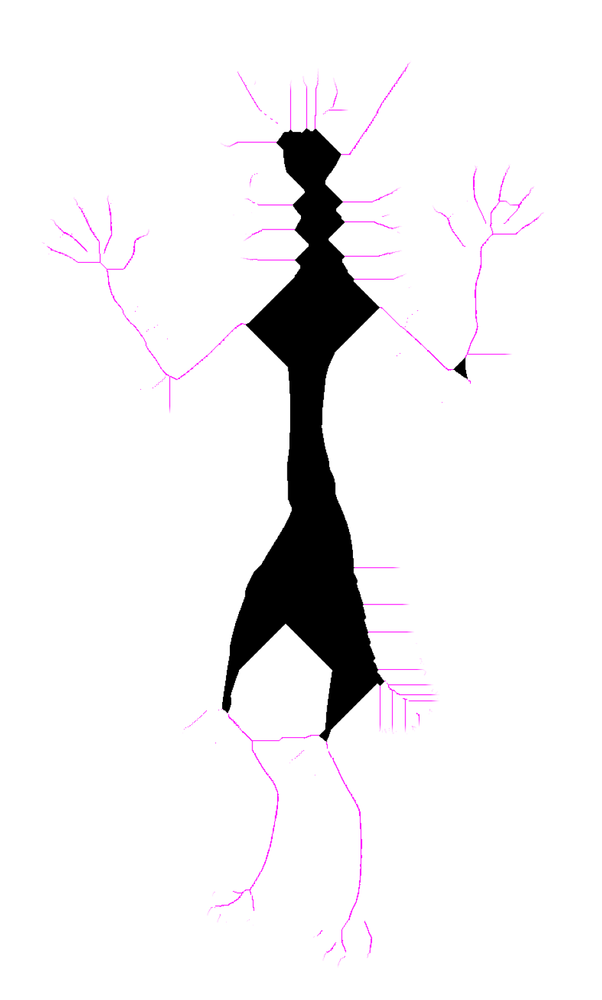

2966


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.099999999999994..1.0].


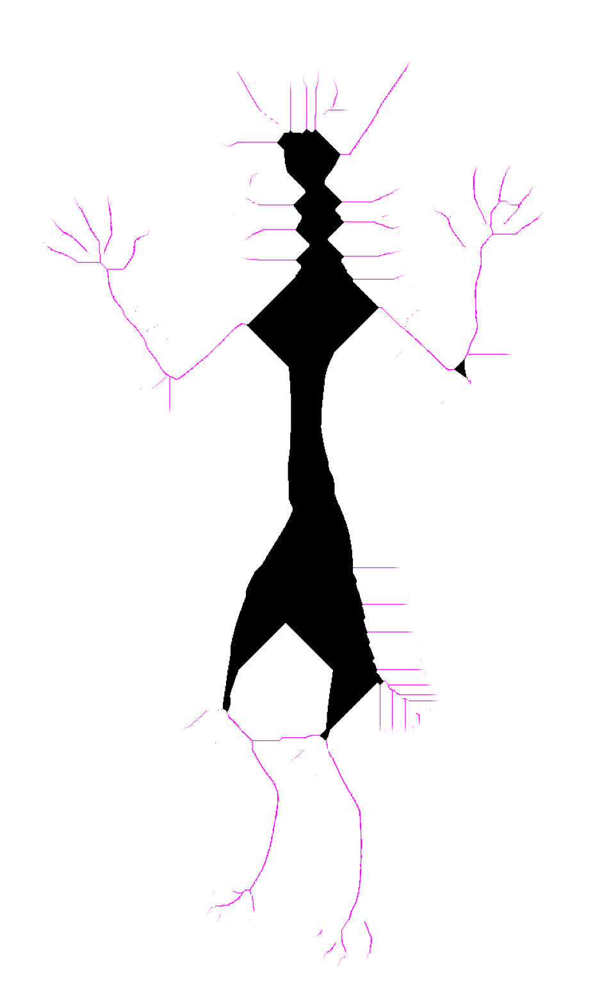

2942


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.199999999999994..1.0].


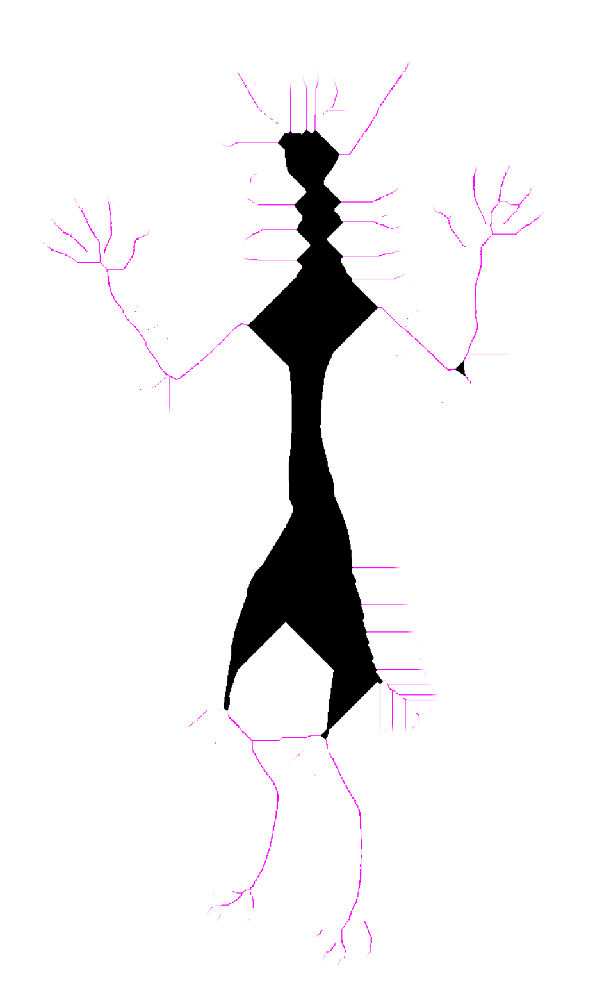

2920


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.299999999999994..1.0].


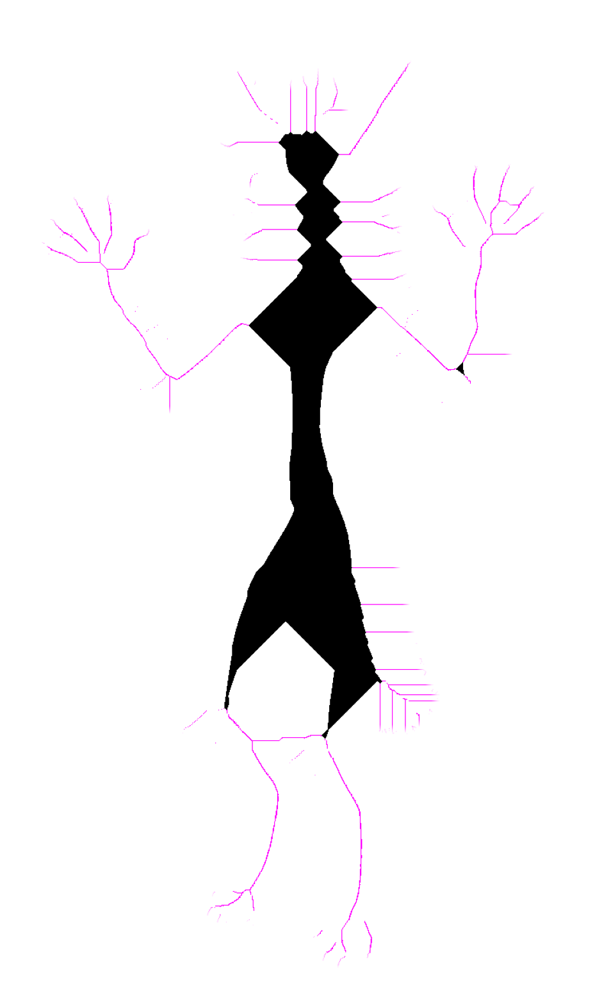

2898


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.399999999999993..1.0].


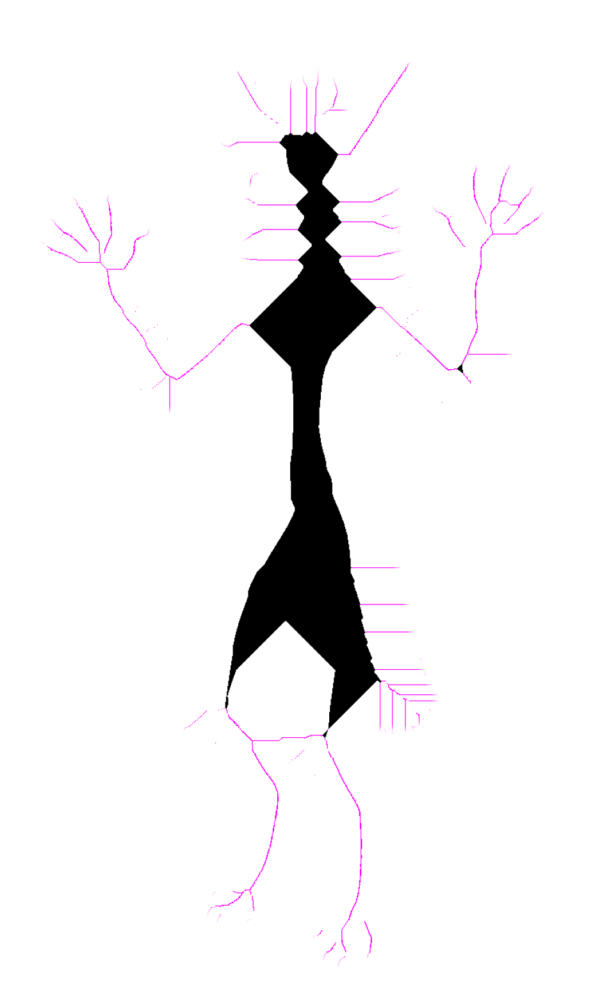

2868


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.499999999999993..1.0].


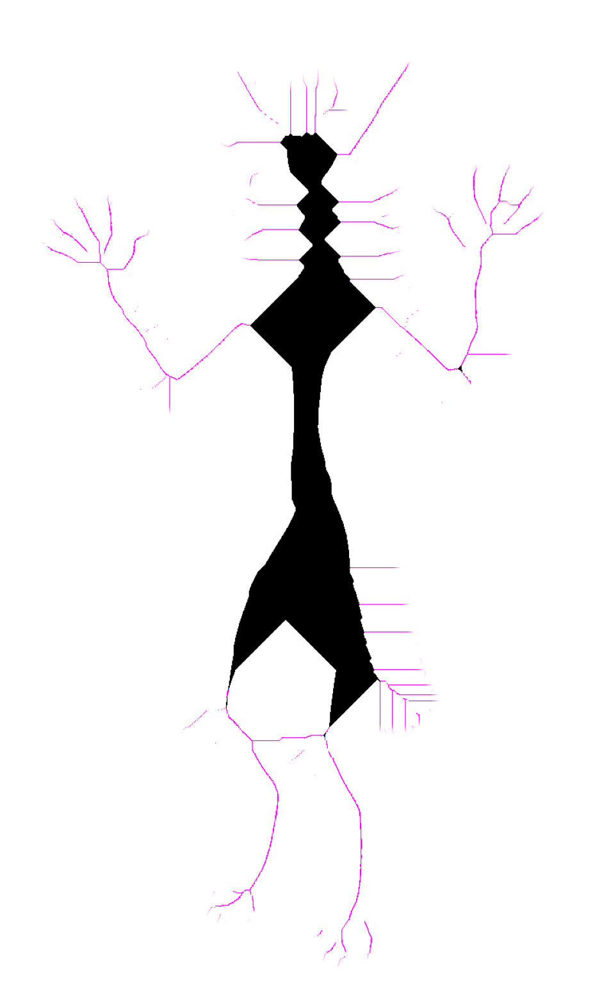

2810


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.5999999999999925..1.0].


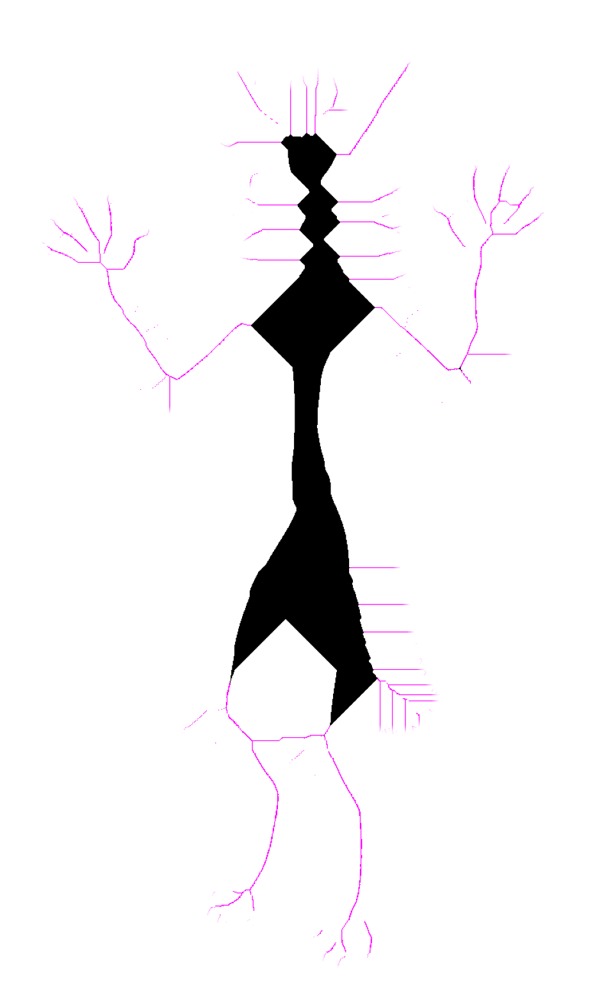

2710


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.699999999999992..1.0].


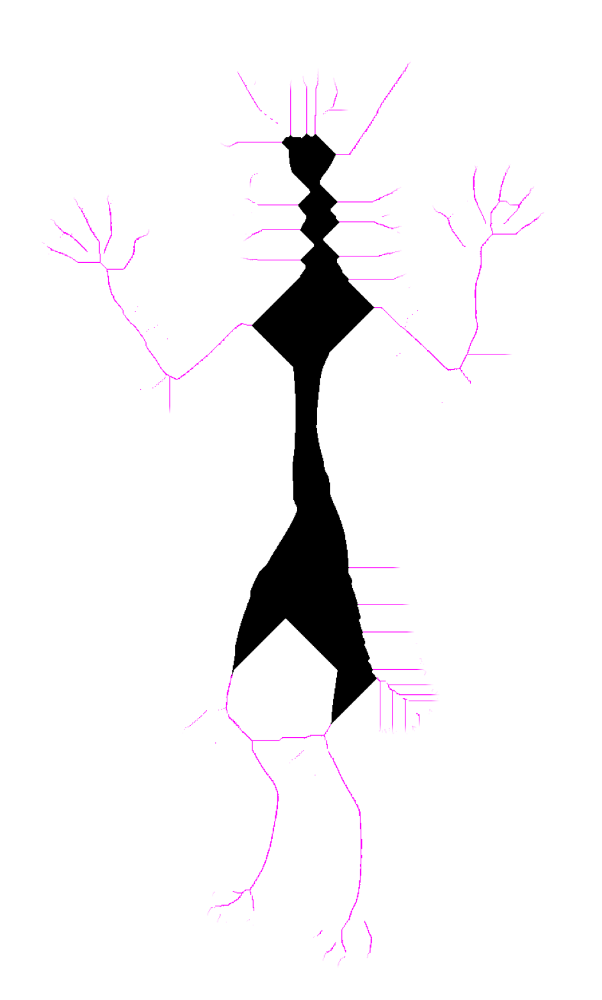

2658


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.799999999999992..1.0].


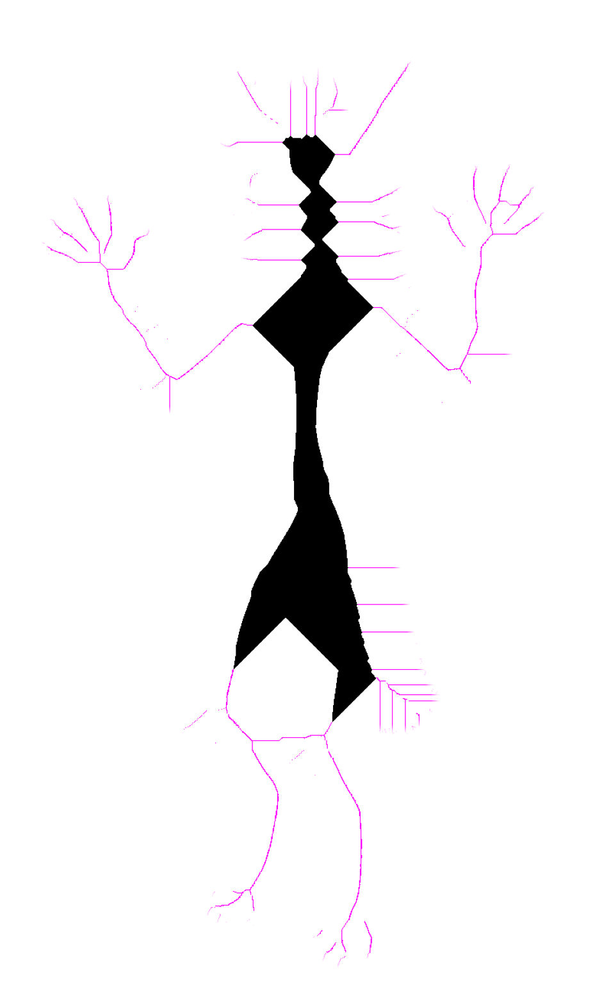

2626


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.8999999999999915..1.0].


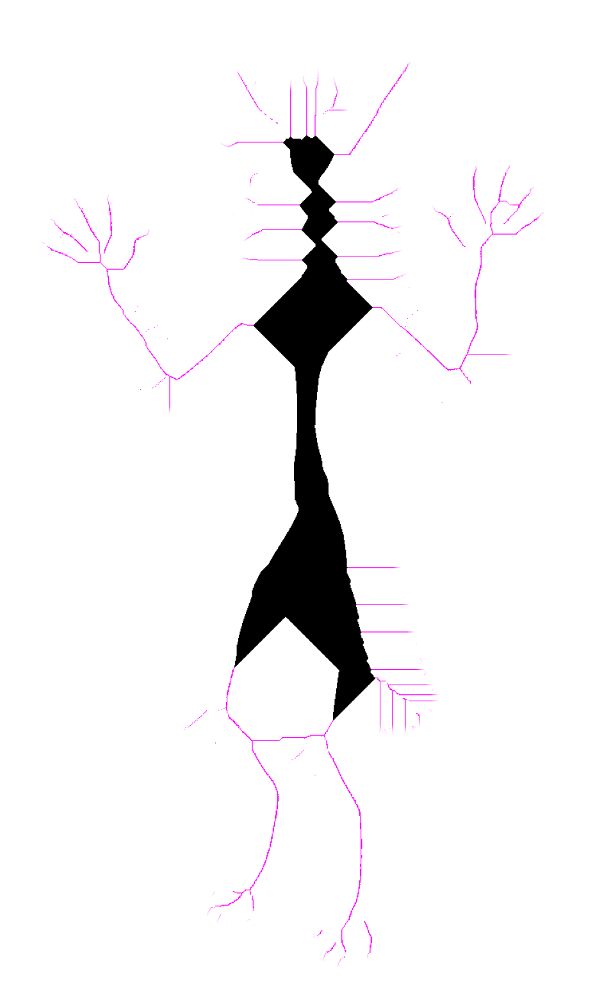

2614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.999999999999991..1.0].


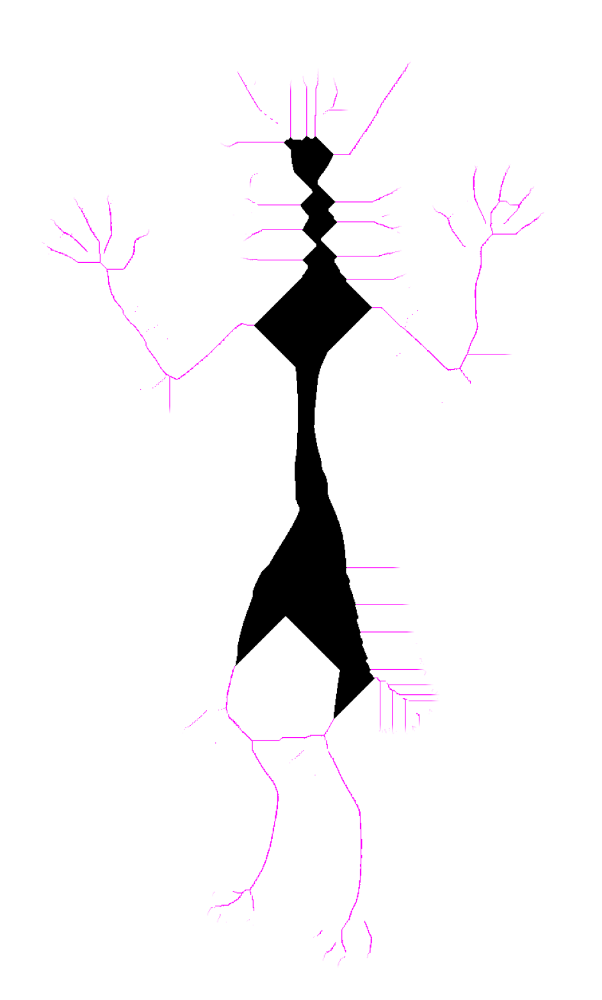

2602


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.099999999999991..1.0].


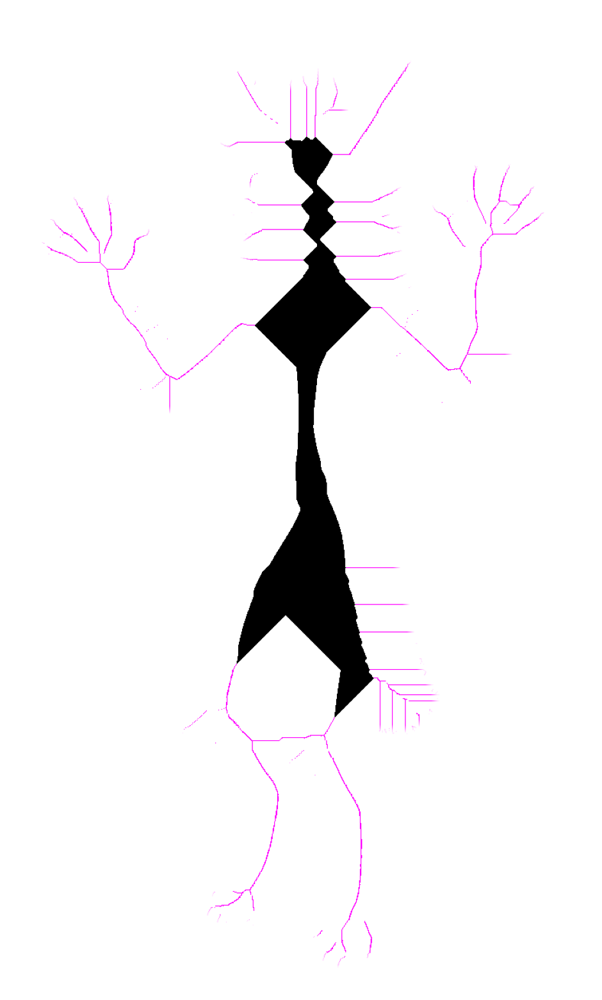

2586


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.19999999999999..1.0].


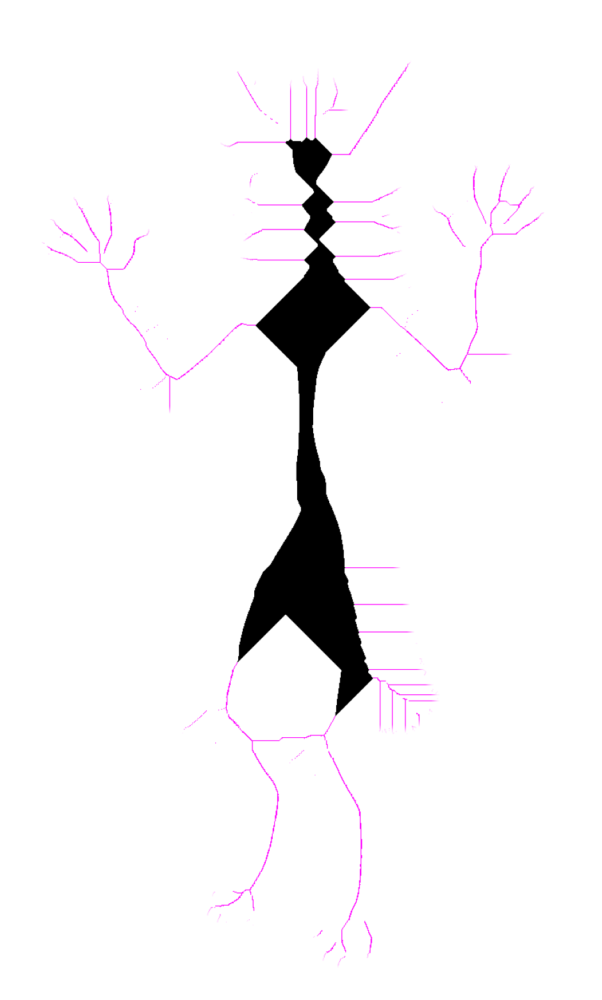

2574


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.29999999999999..1.0].


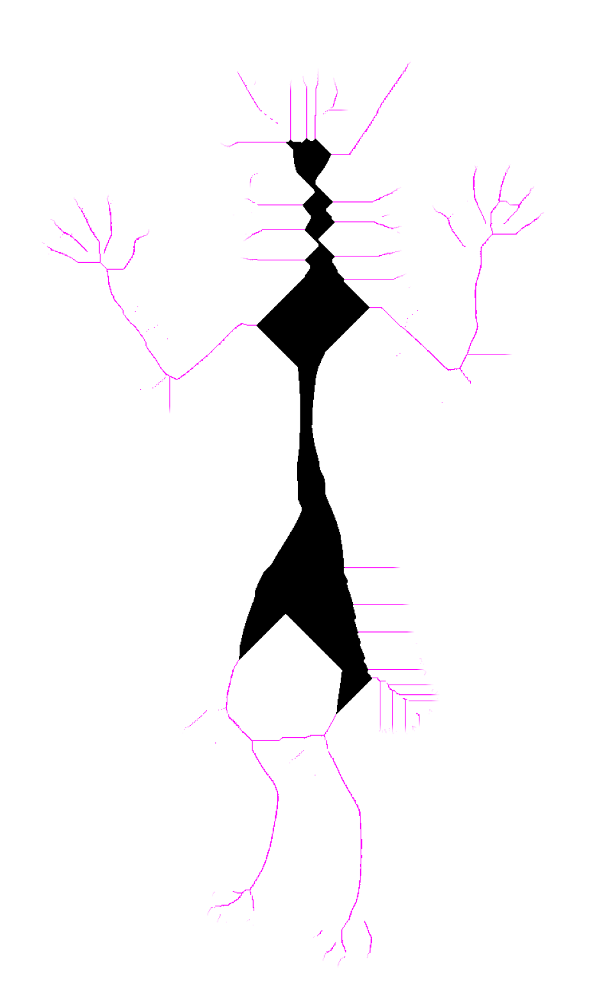

2558


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.39999999999999..1.0].


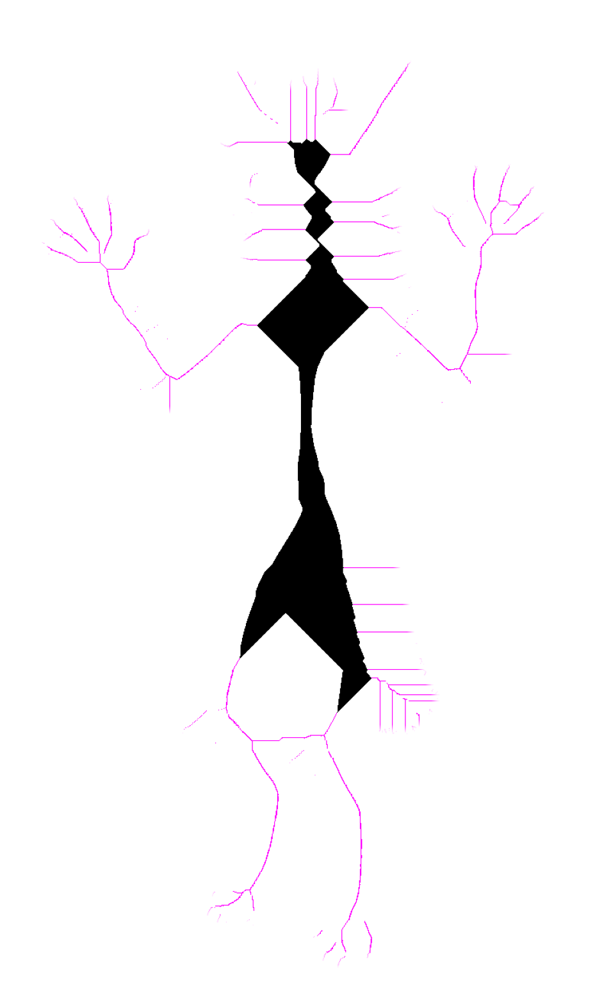

2546


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.499999999999989..1.0].


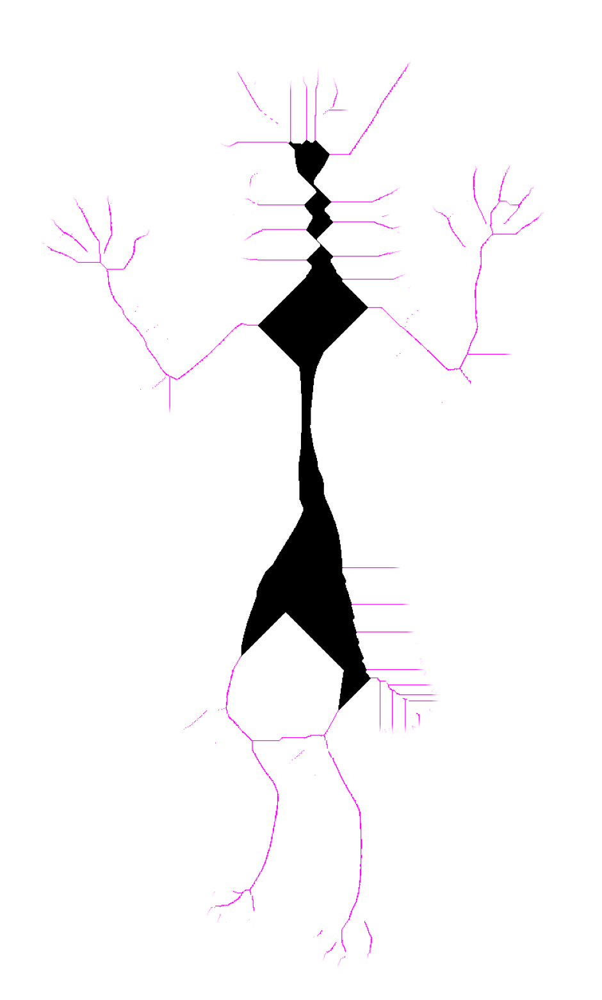

2528


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.599999999999989..1.0].


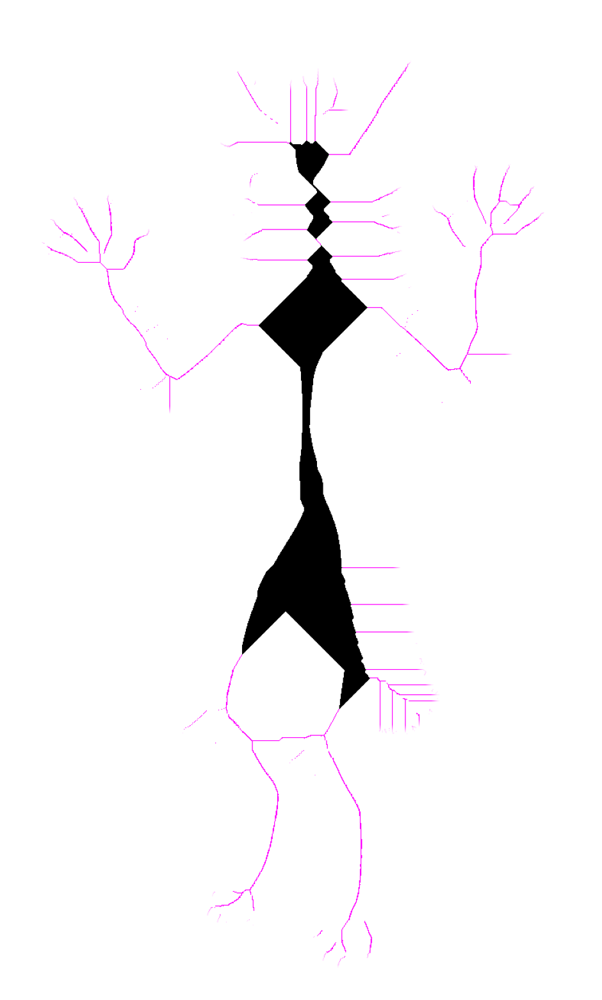

2484


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.699999999999989..1.0].


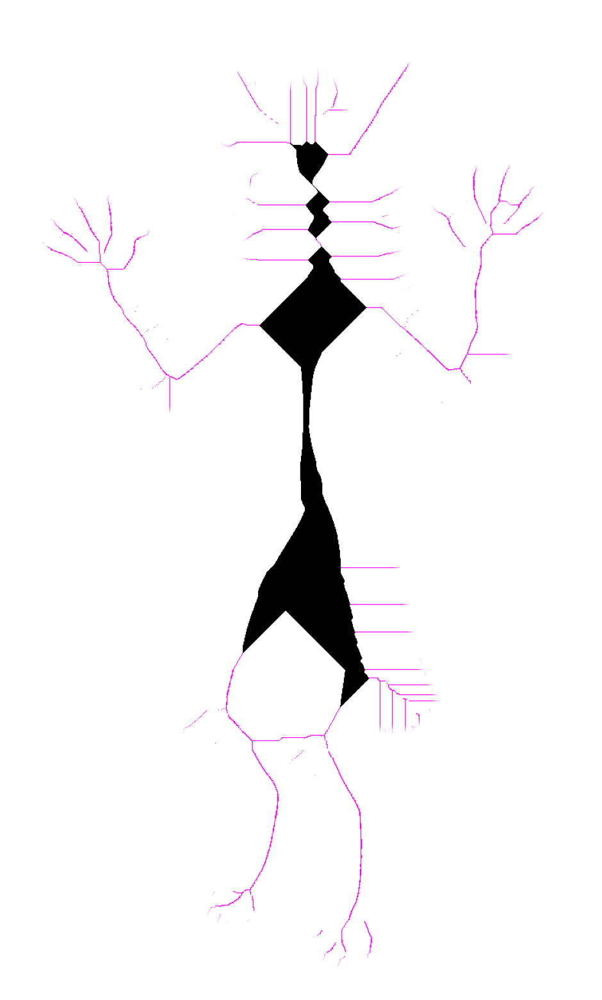

2462


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.799999999999988..1.0].


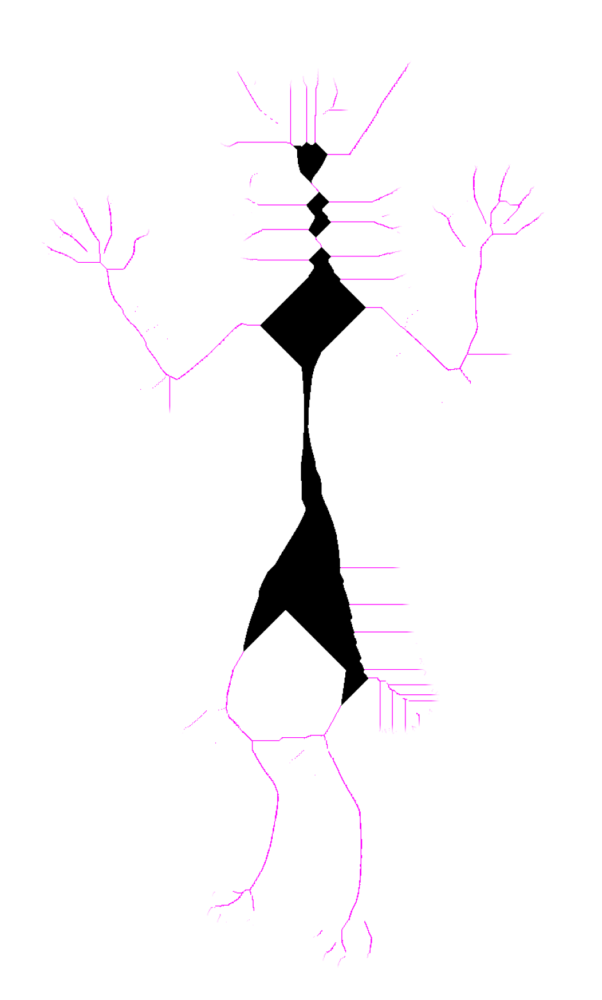

2390


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.899999999999988..1.0].


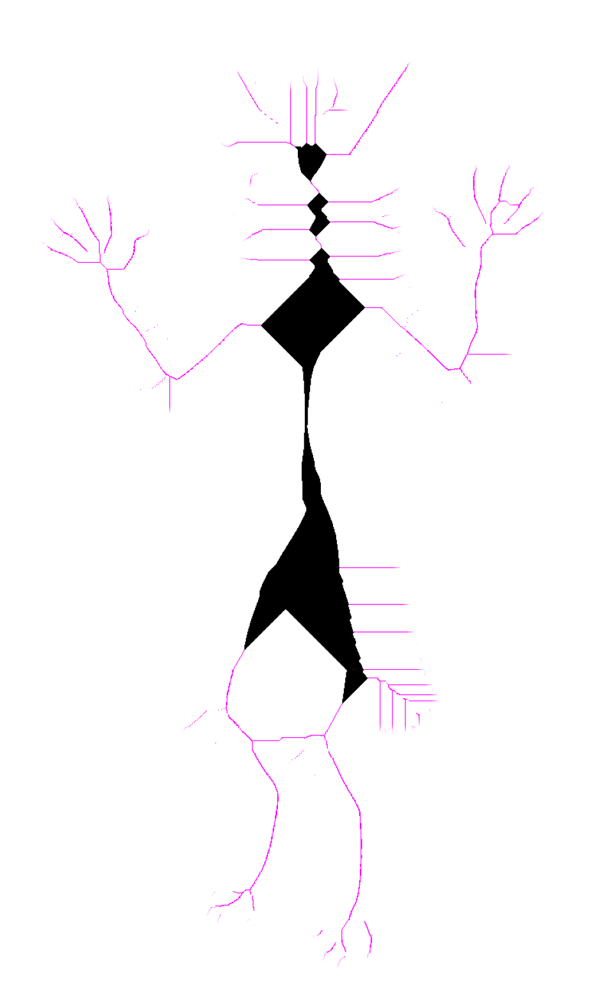

2352


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.999999999999988..1.0].


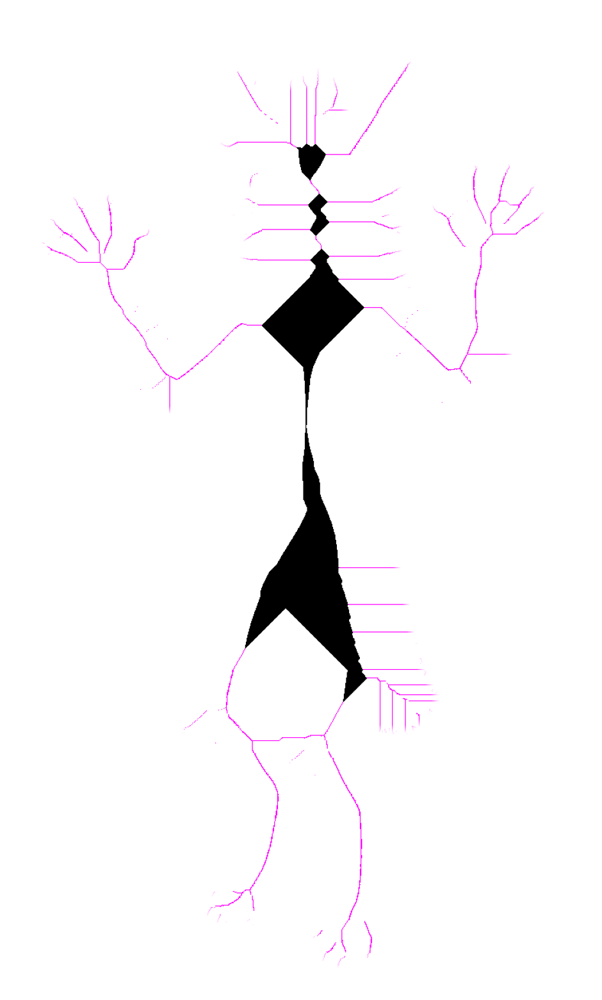

2320


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.099999999999987..1.0].


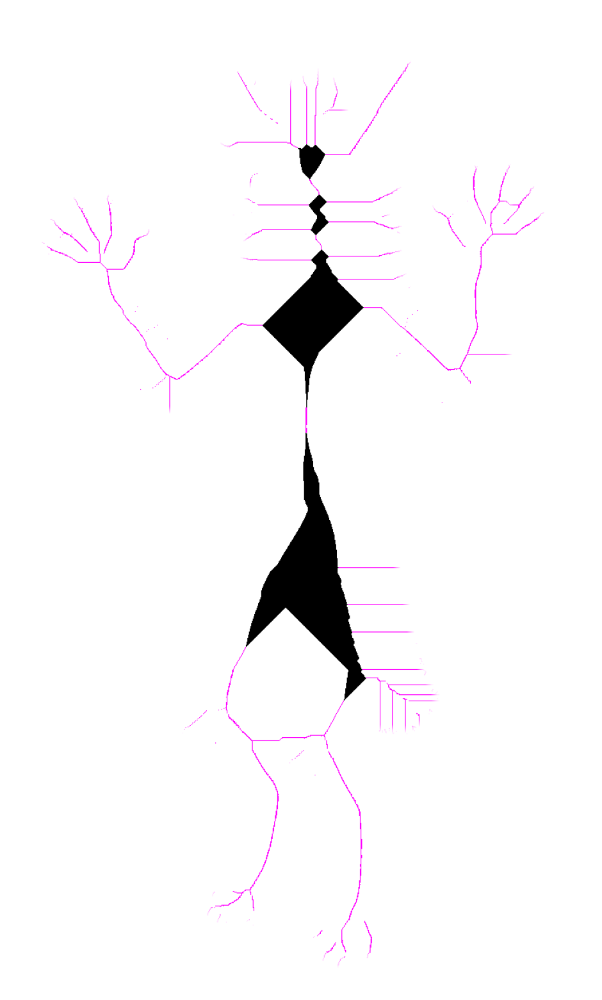

2222


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.199999999999987..1.0].


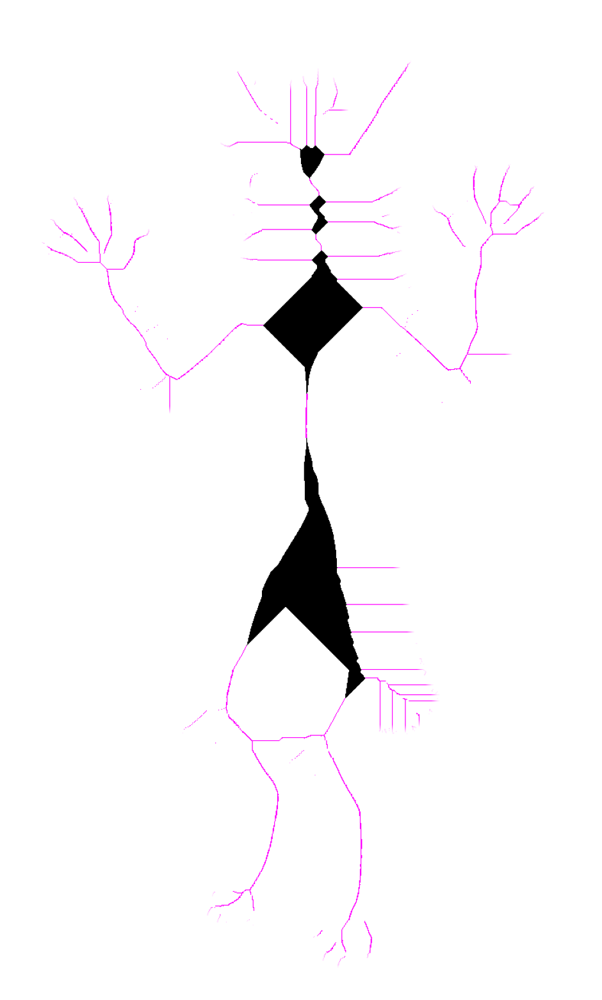

2134


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.2999999999999865..1.0].


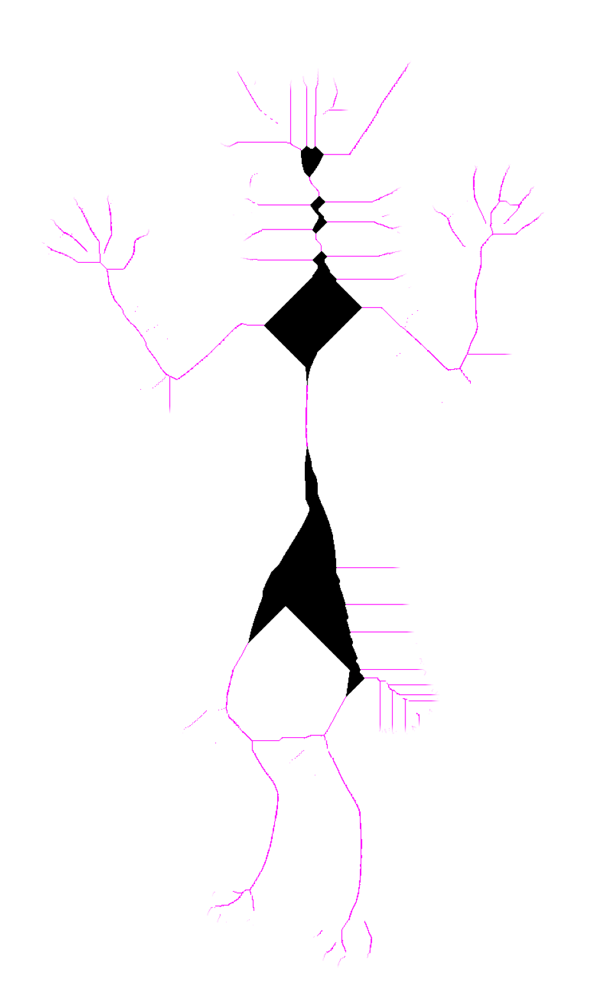

2048


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.399999999999986..1.0].


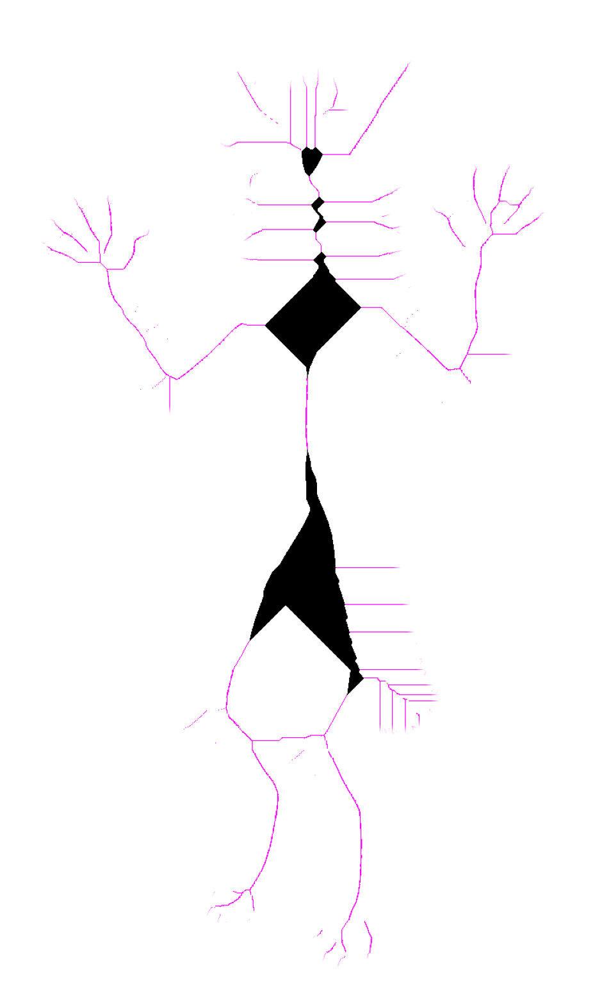

1986


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.499999999999986..1.0].


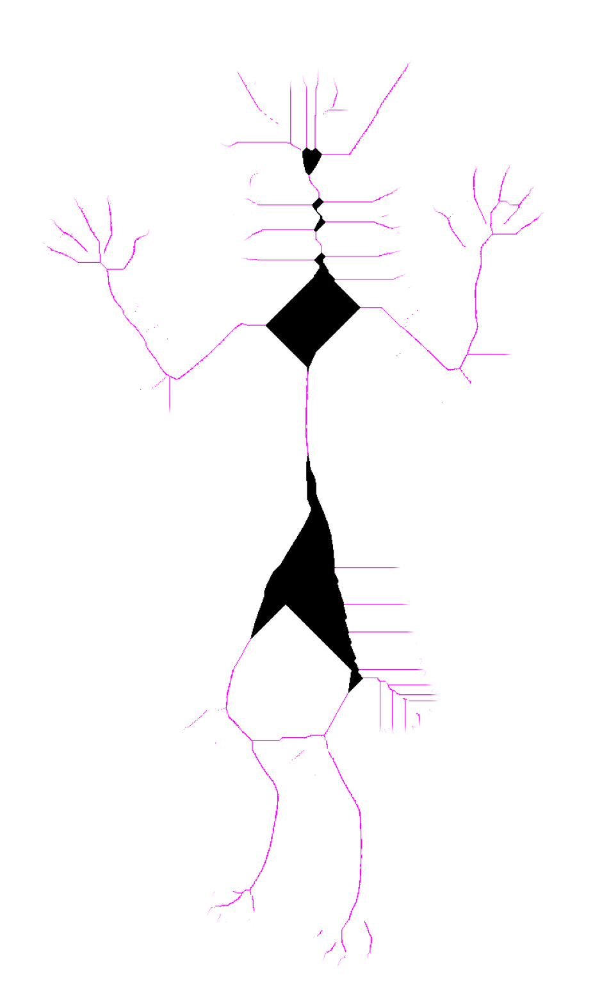

1918


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.599999999999985..1.0].


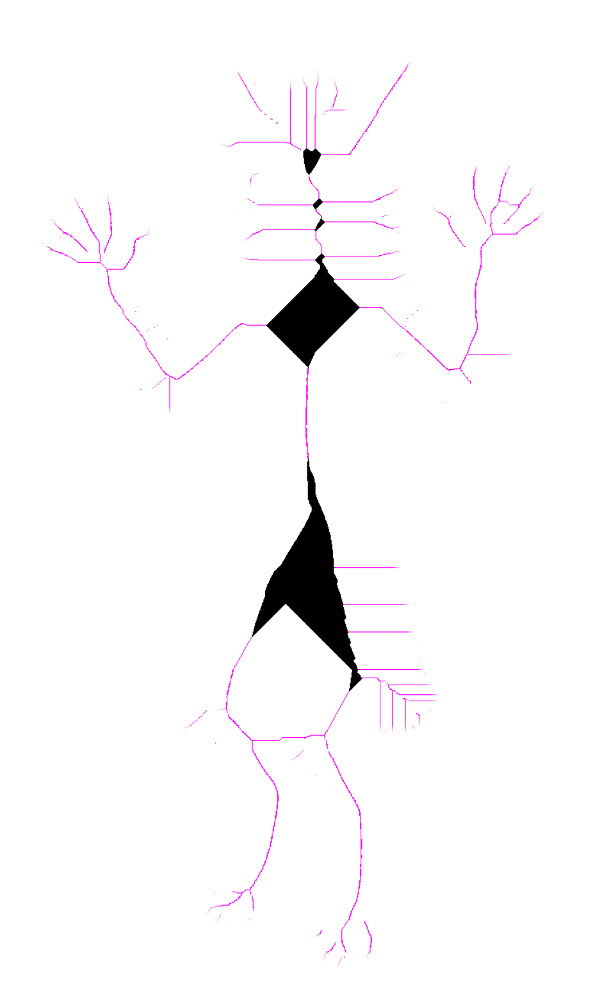

1838


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.699999999999985..1.0].


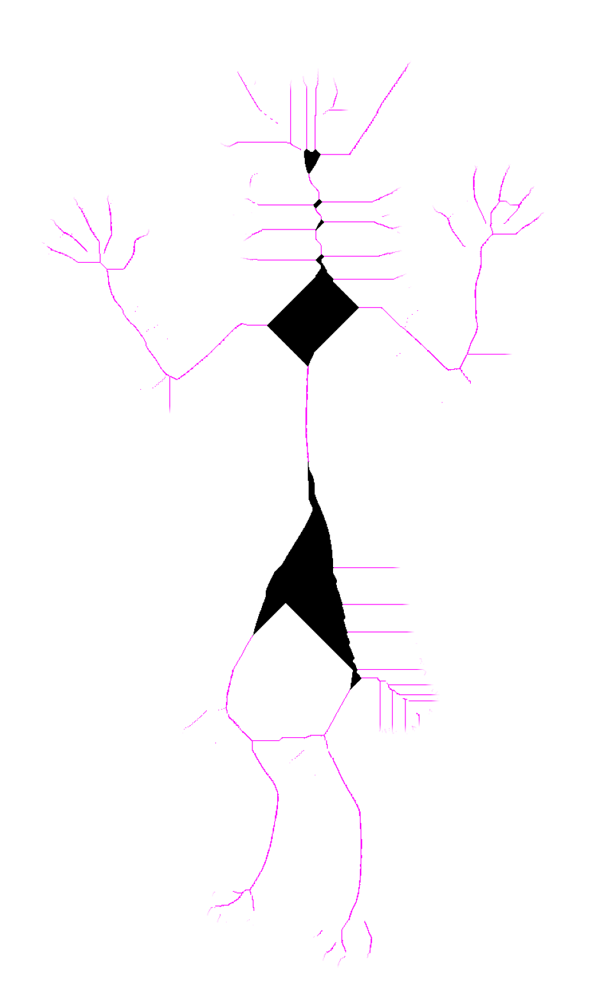

1774


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.799999999999985..1.0].


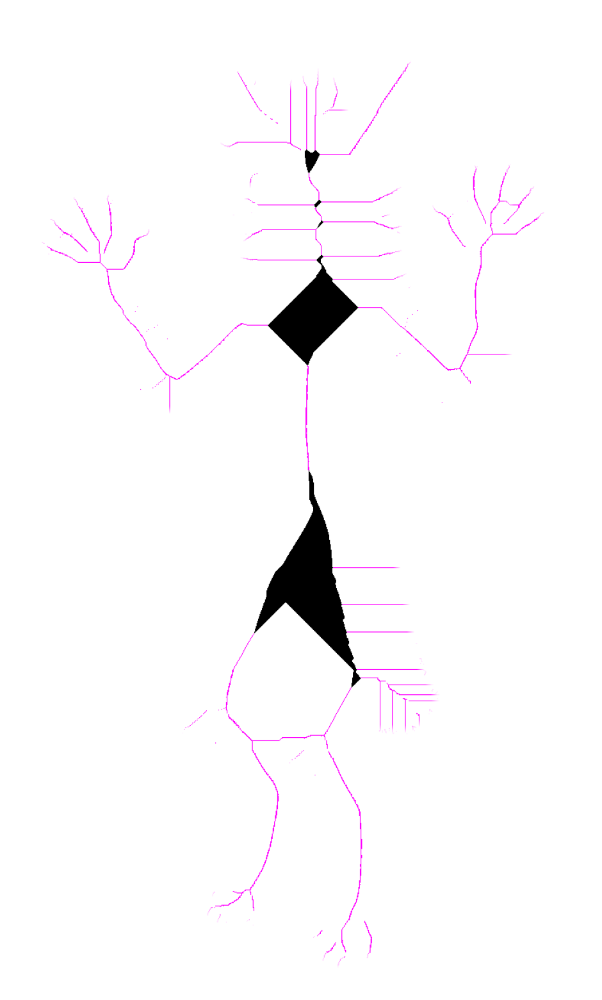

1694


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.899999999999984..1.0].


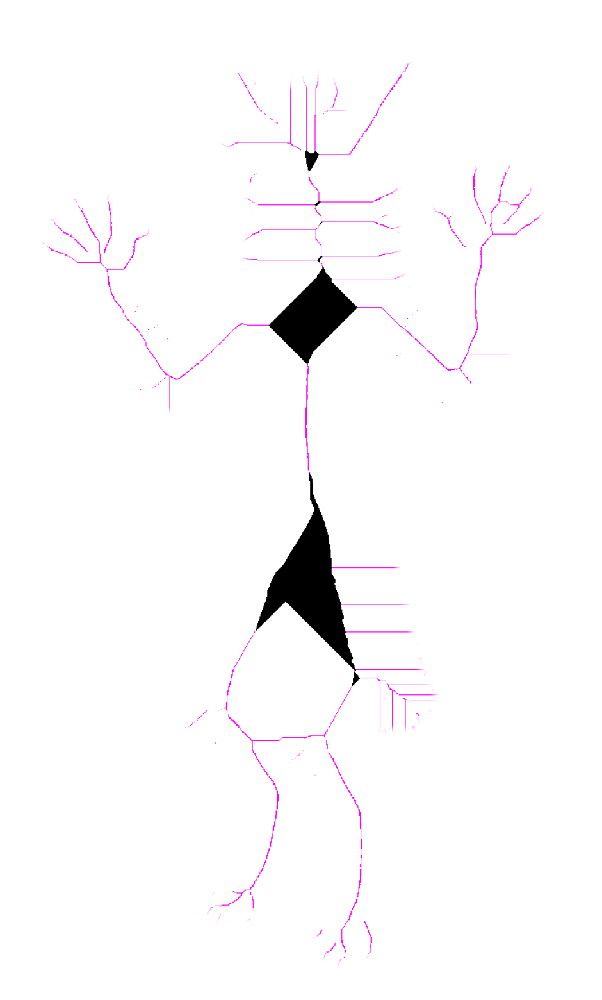

1624


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.999999999999984..1.0].


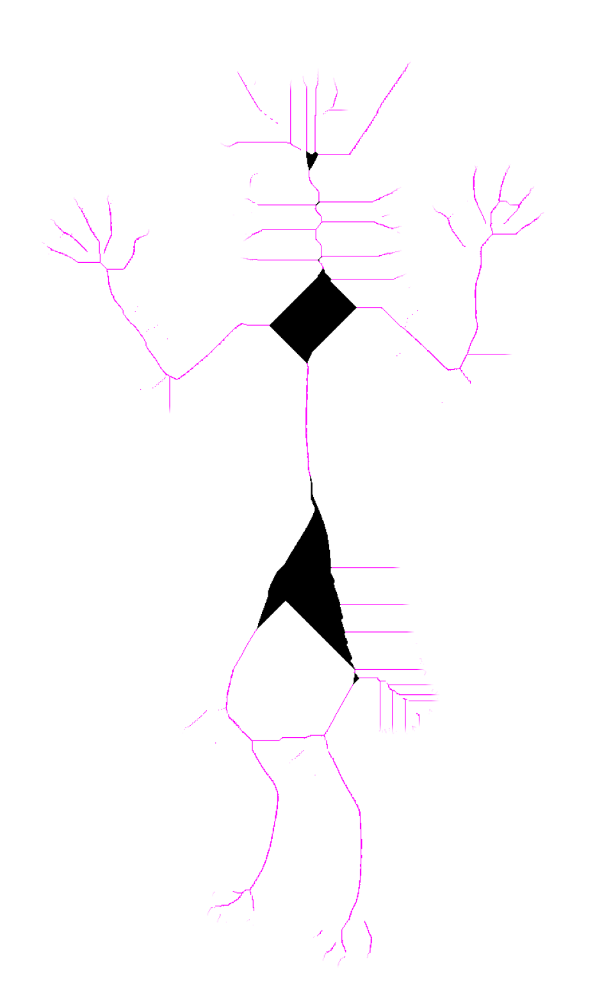

1522


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.099999999999984..1.0].


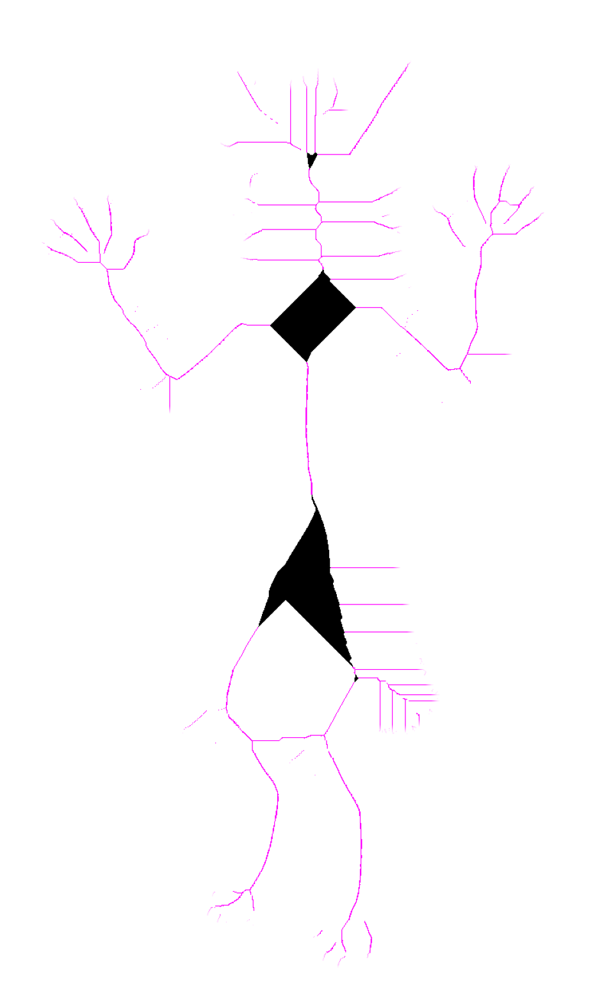

1370


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.199999999999983..1.0].


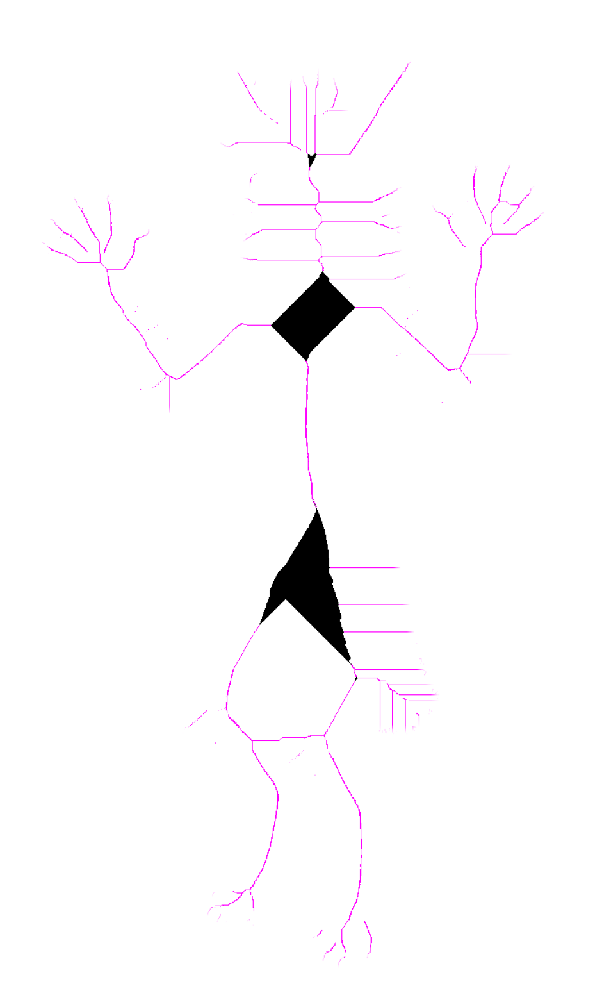

1290


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.299999999999983..1.0].


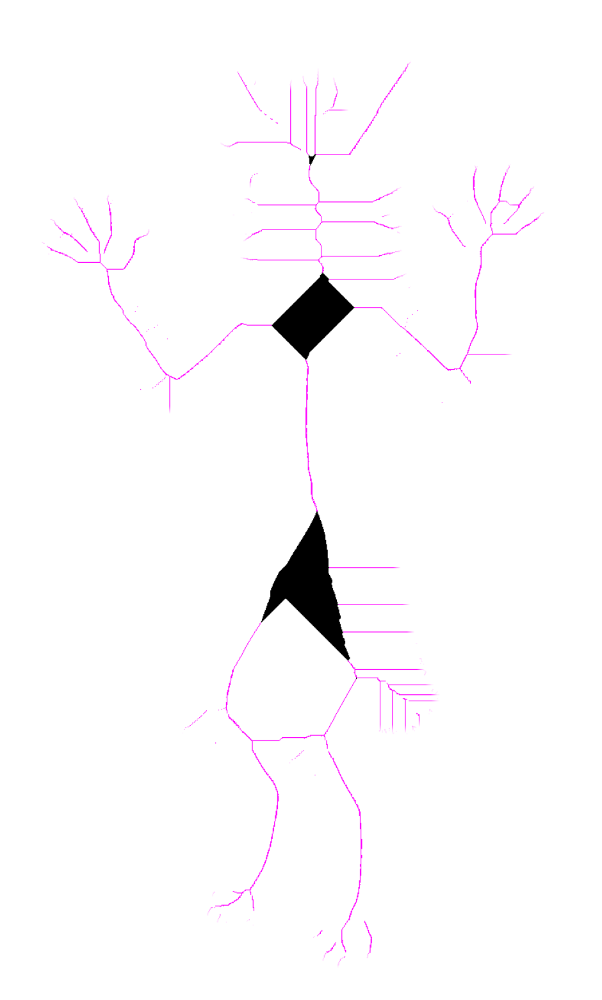

1204


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.399999999999983..1.0].


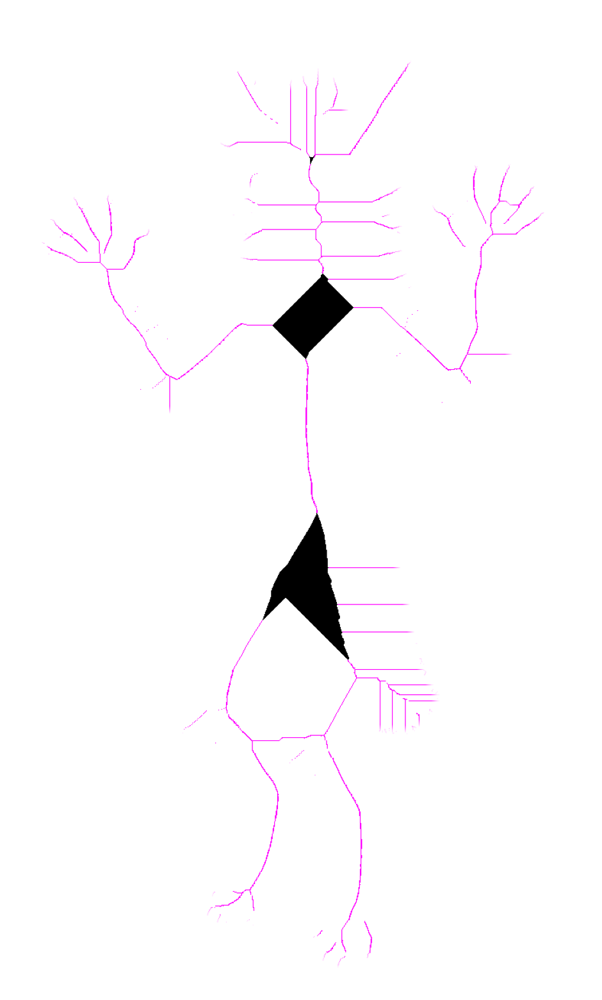

1158


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.499999999999982..1.0].


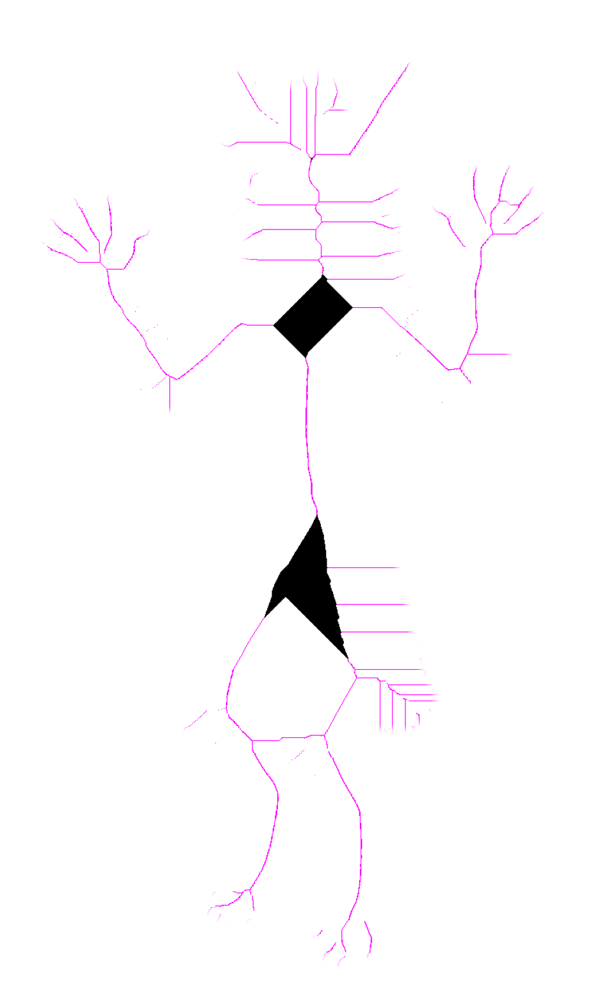

1104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.599999999999982..1.0].


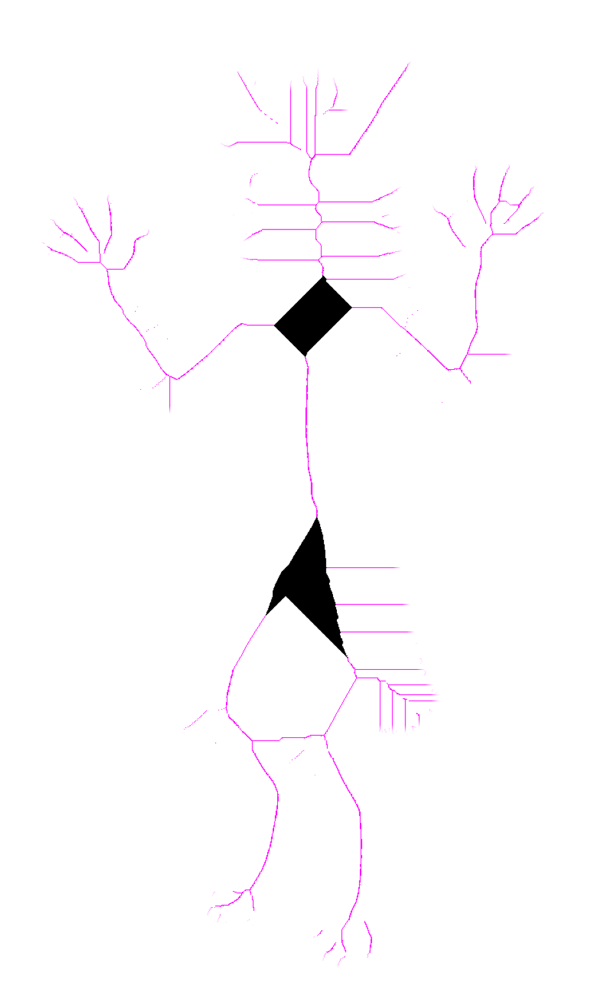

1066


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.699999999999982..1.0].


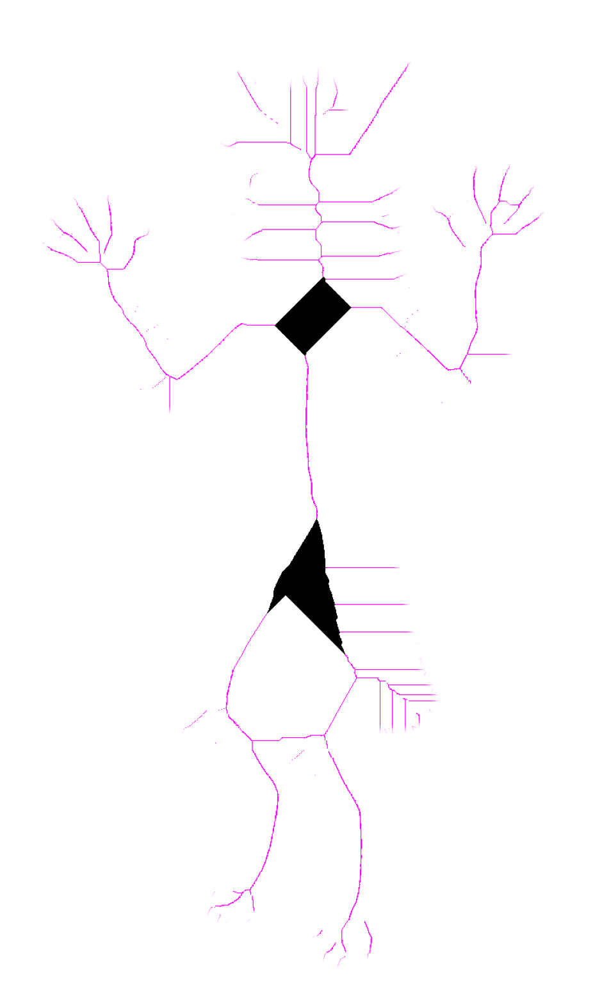

1030


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.799999999999981..1.0].


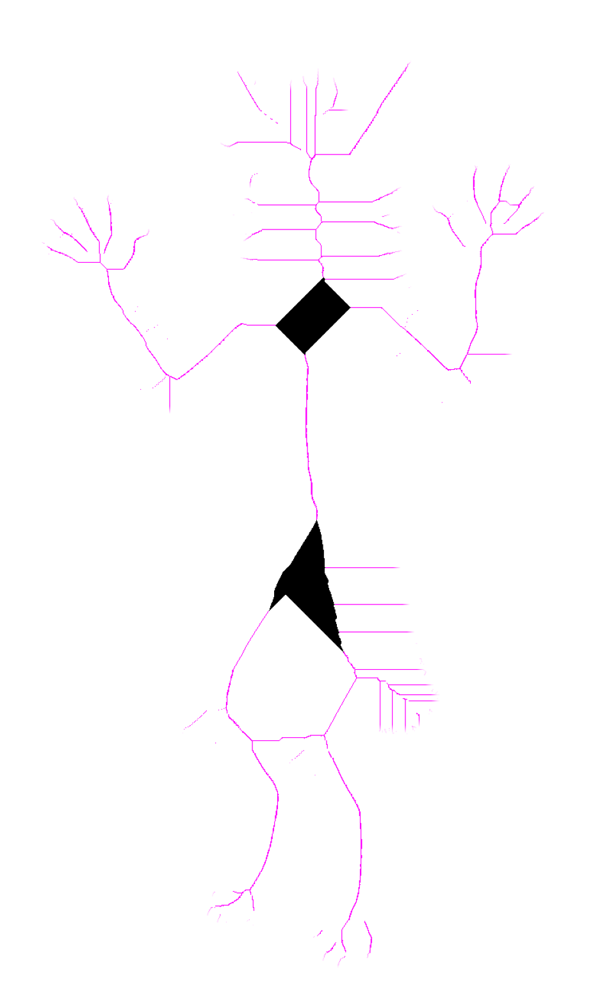

998


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.89999999999998..1.0].


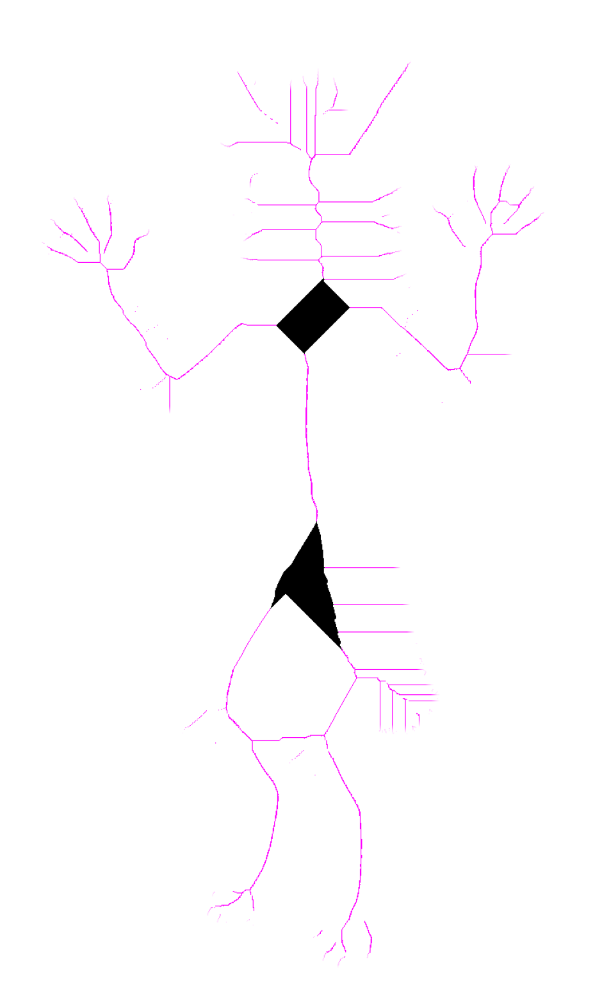

968


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.99999999999998..1.0].


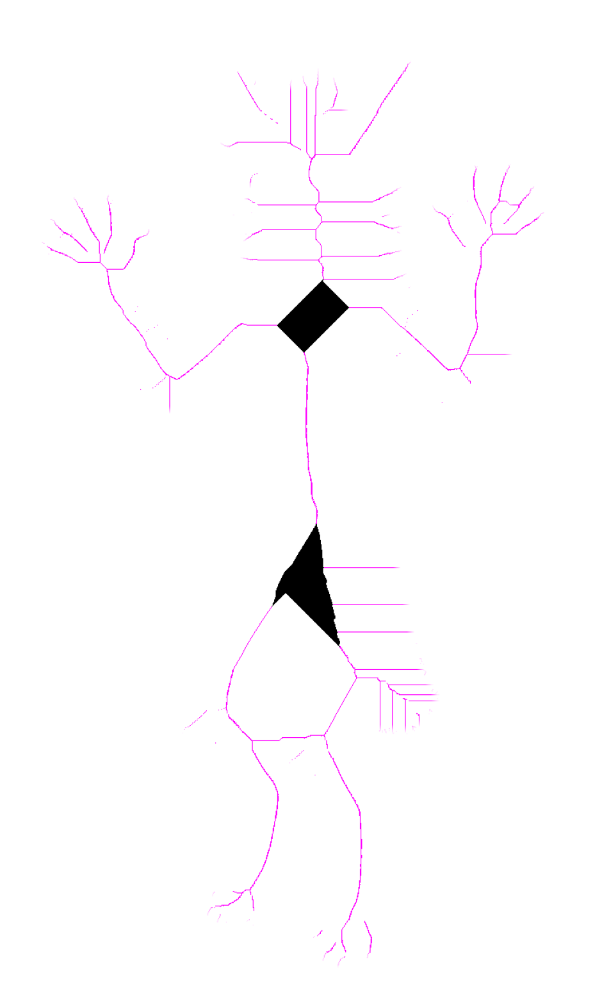

930


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.09999999999998..1.0].


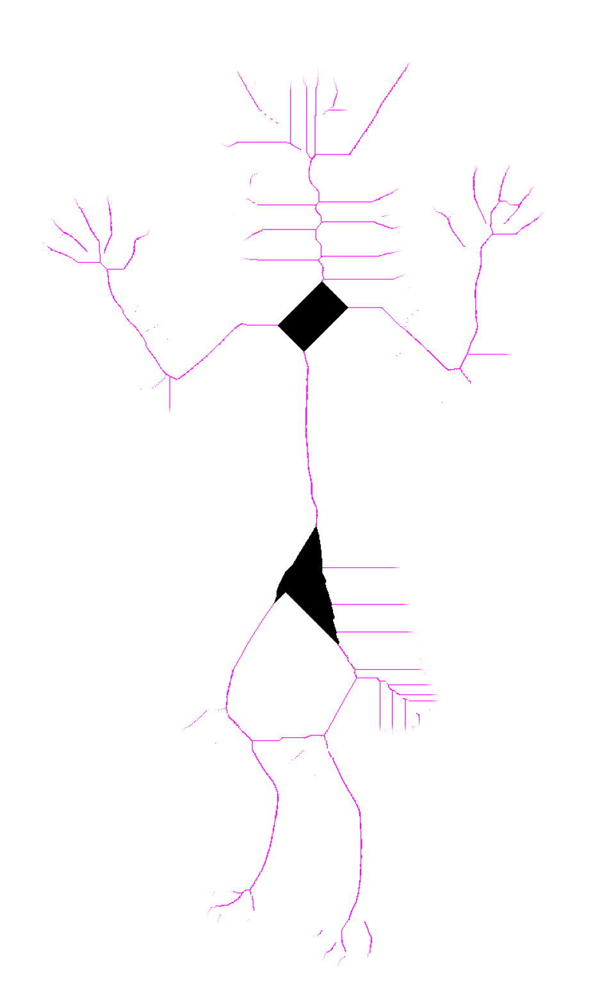

892


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.19999999999998..1.0].


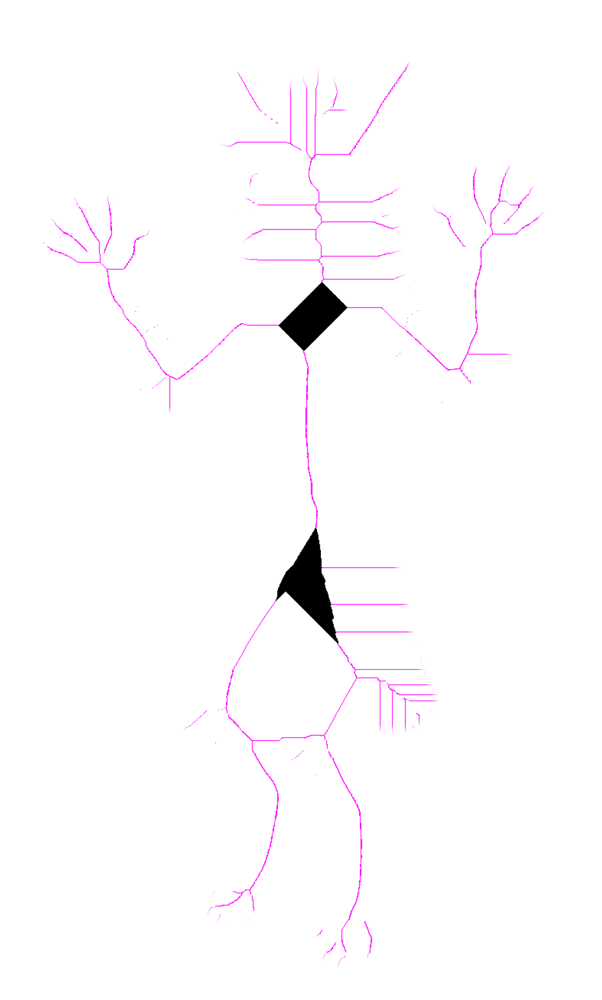

864


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.29999999999998..1.0].


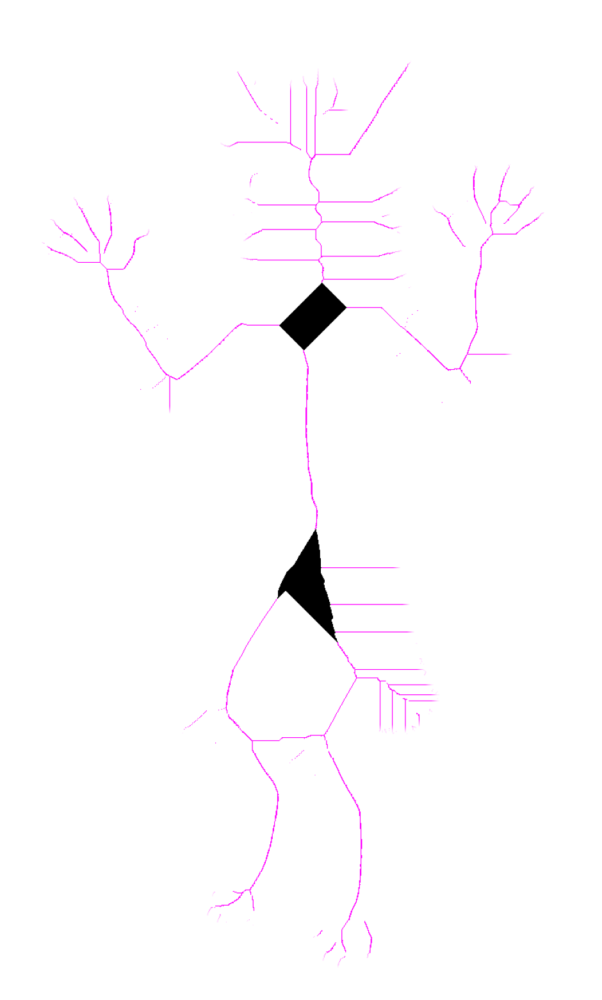

838


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.399999999999979..1.0].


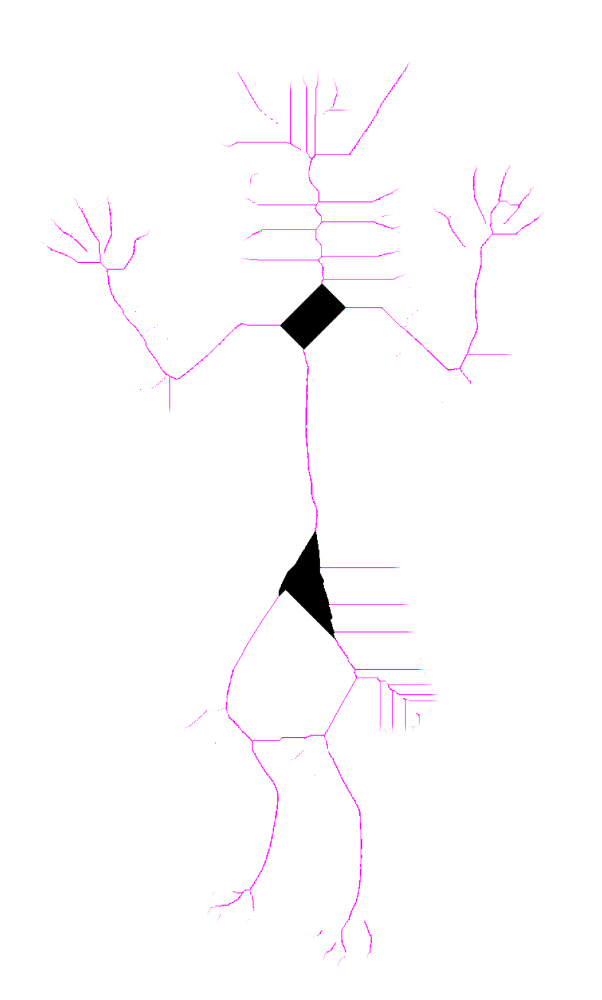

806


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.499999999999979..1.0].


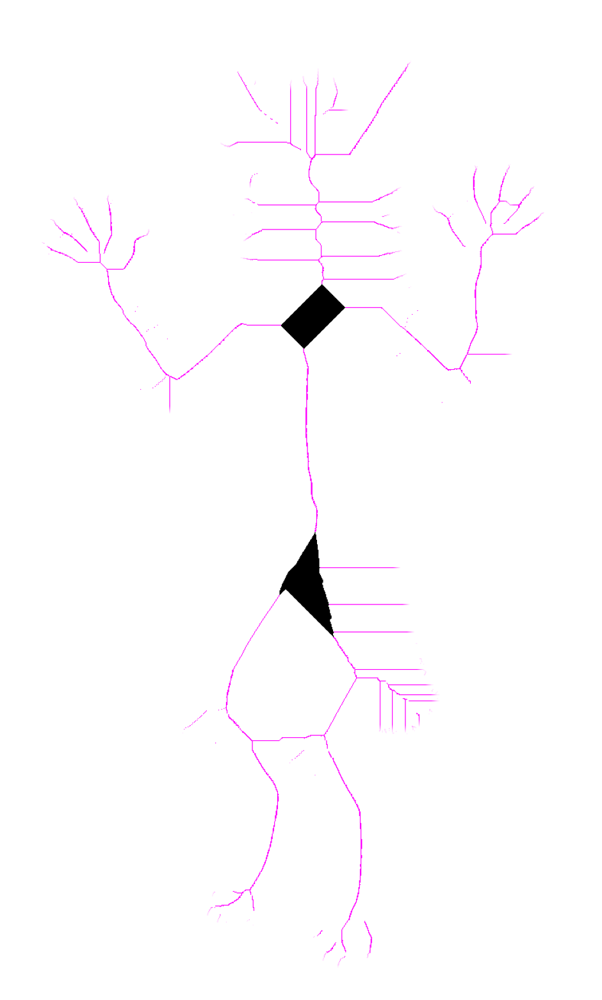

778


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.599999999999978..1.0].


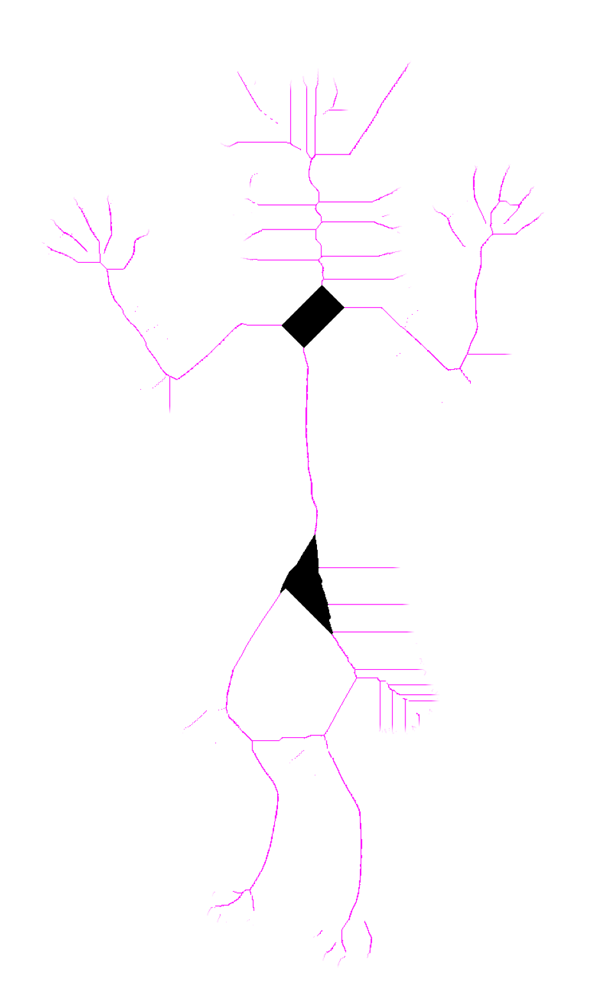

750


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.699999999999978..1.0].


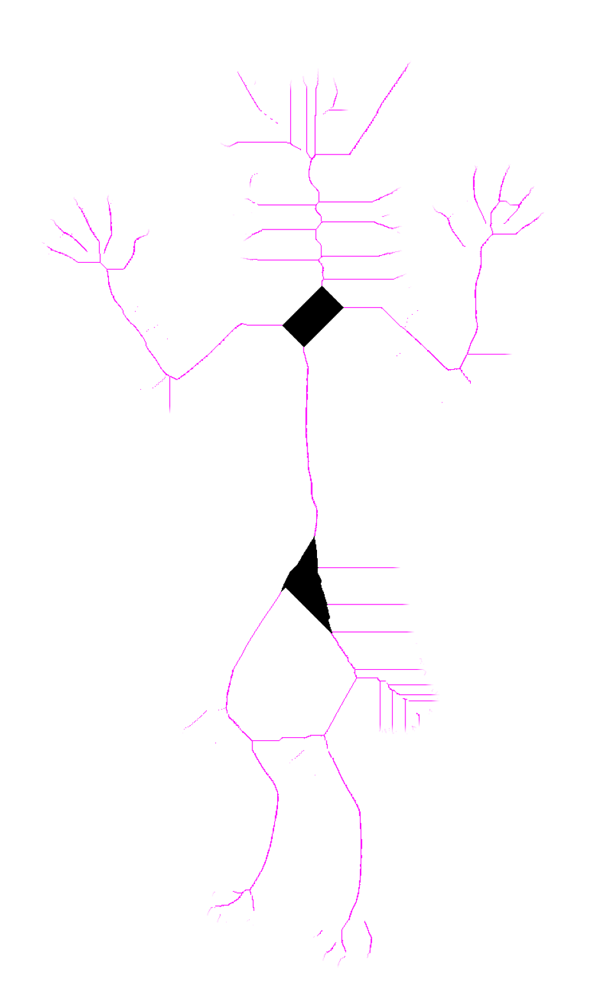

728


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.799999999999978..1.0].


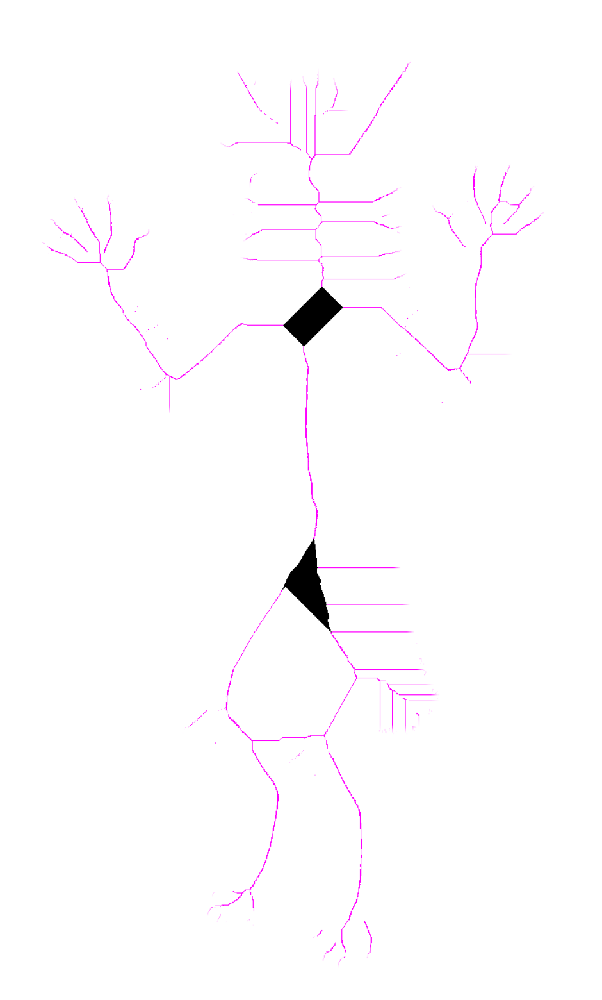

700


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.899999999999977..1.0].


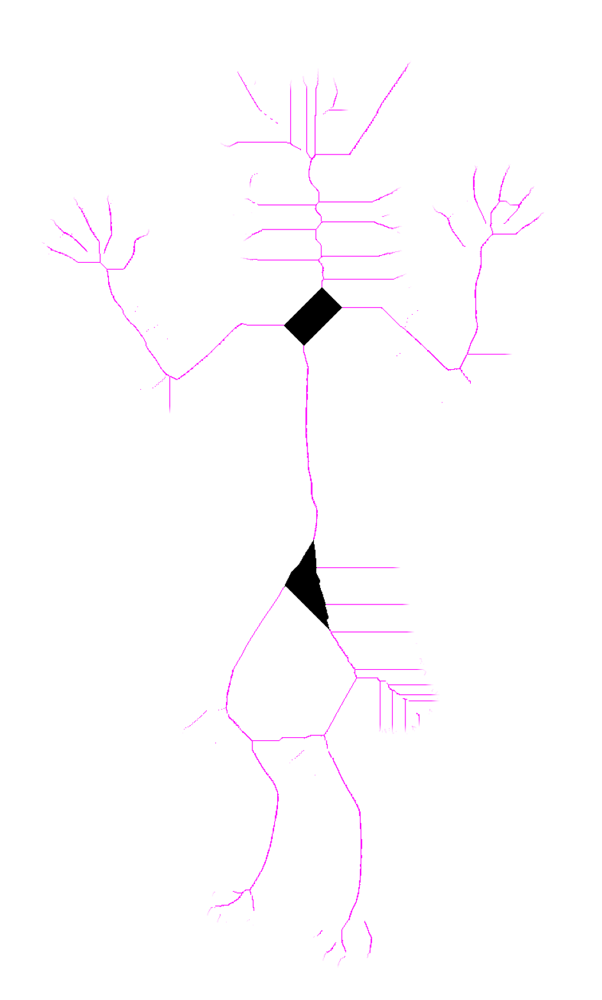

672


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.999999999999977..1.0].


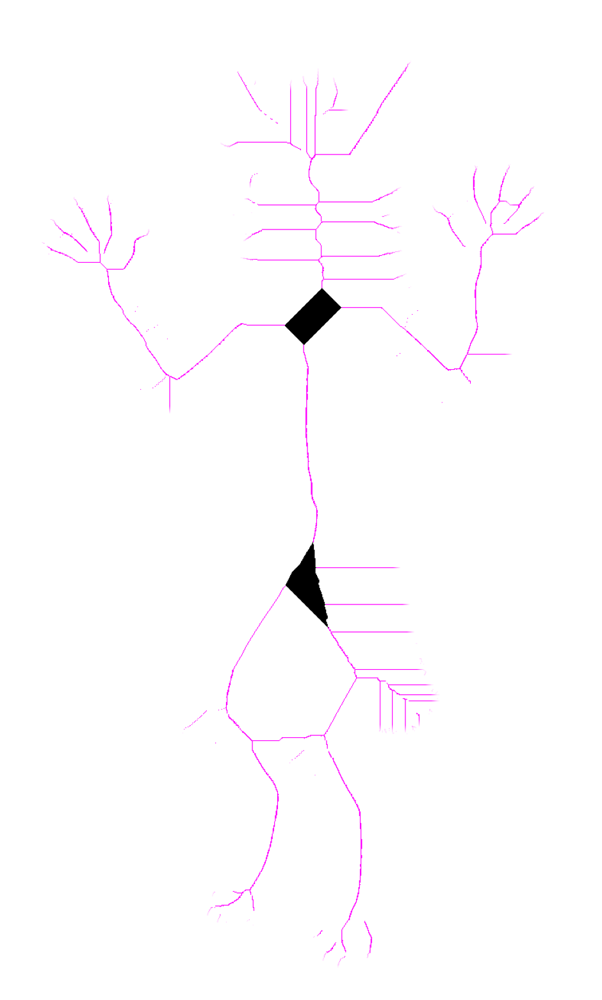

642


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.099999999999977..1.0].


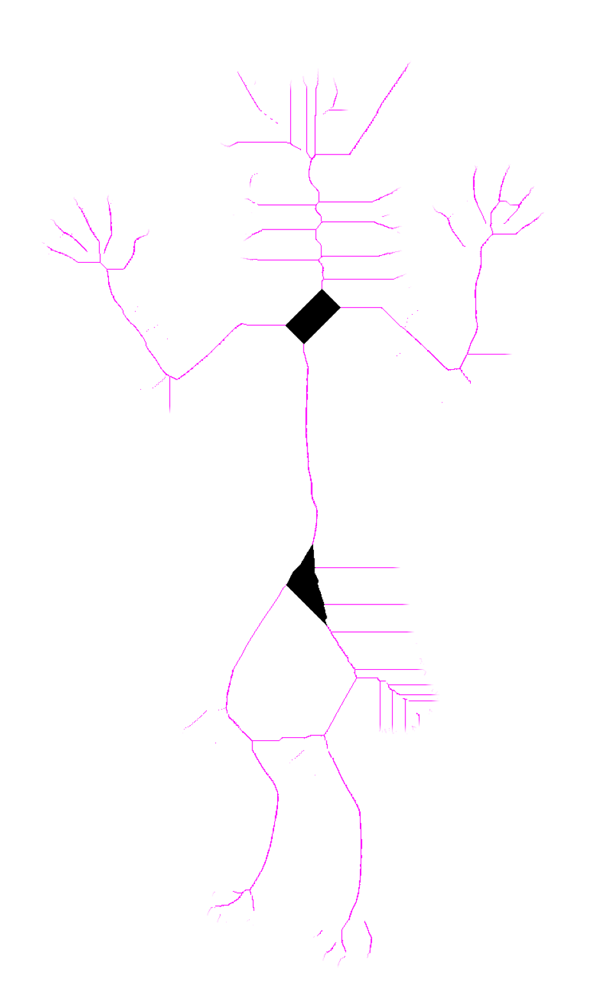

616


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.199999999999976..1.0].


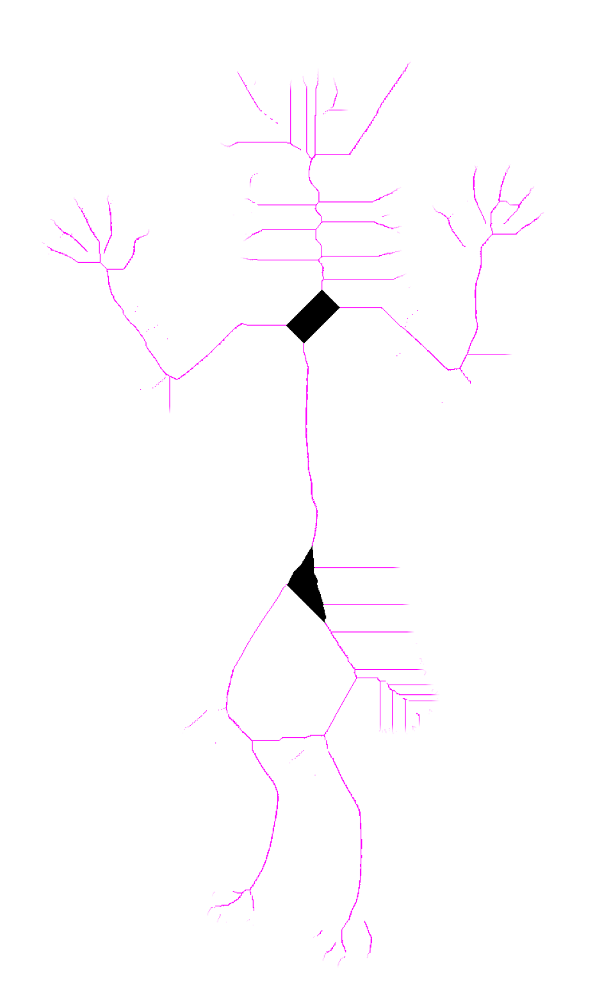

592


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.299999999999976..1.0].


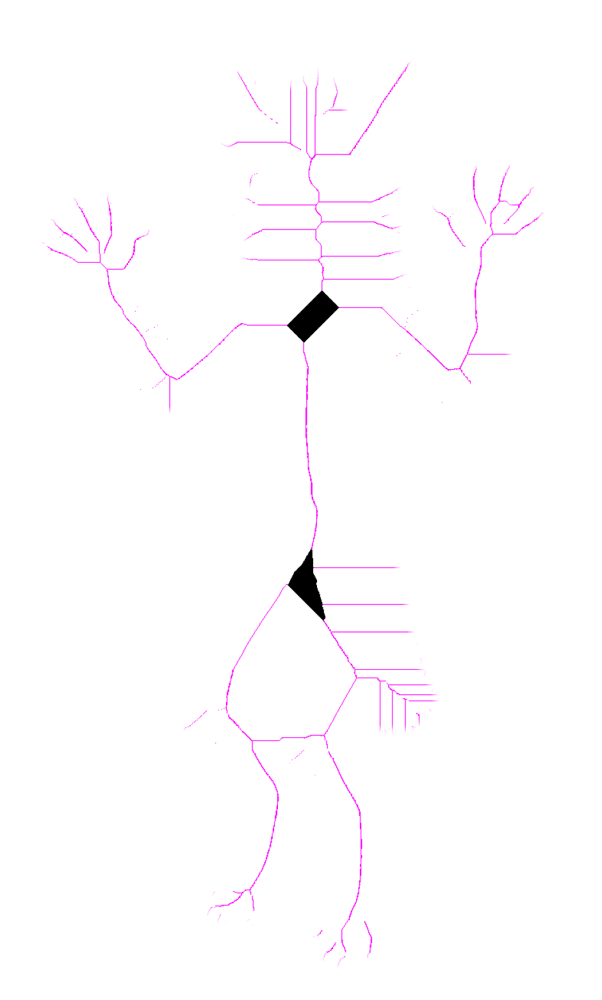

564


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.399999999999975..1.0].


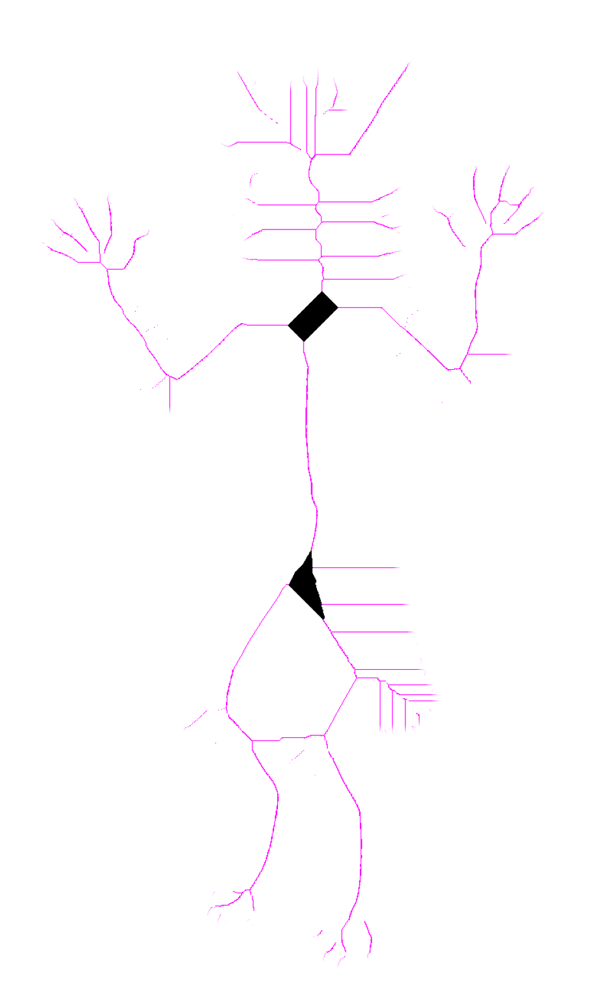

546


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.499999999999975..1.0].


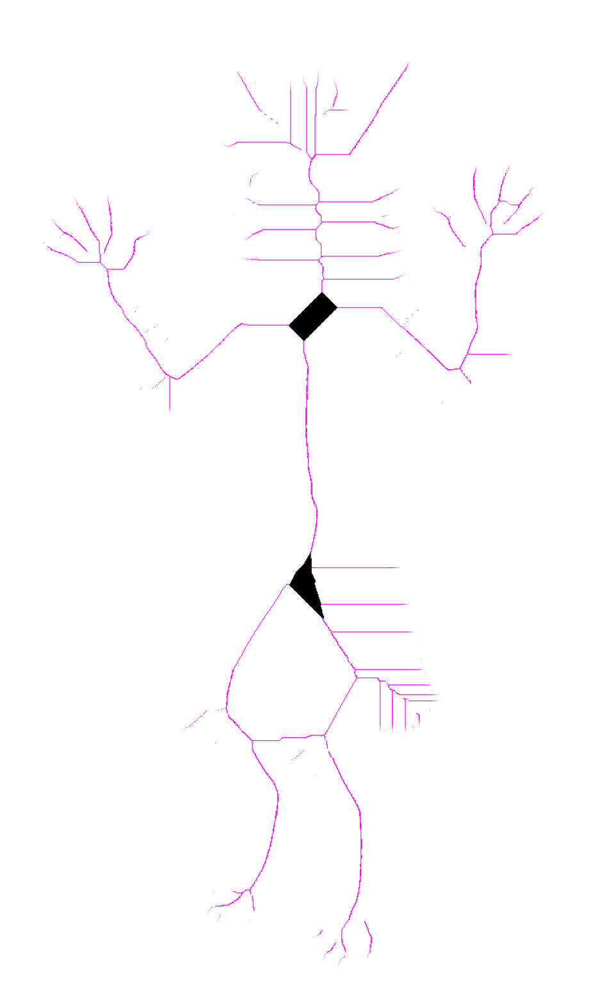

526


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.599999999999975..1.0].


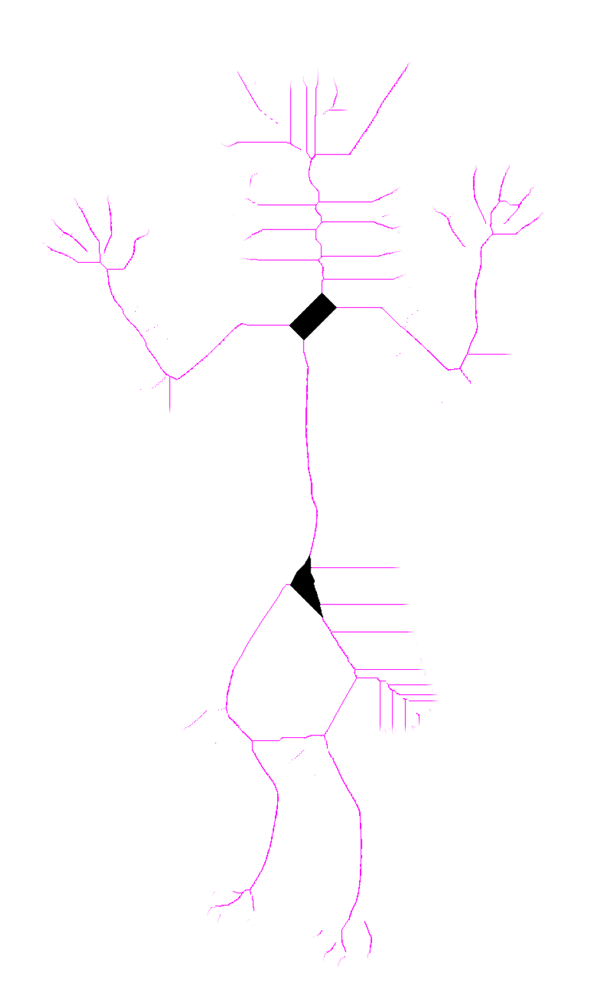

504


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.699999999999974..1.0].


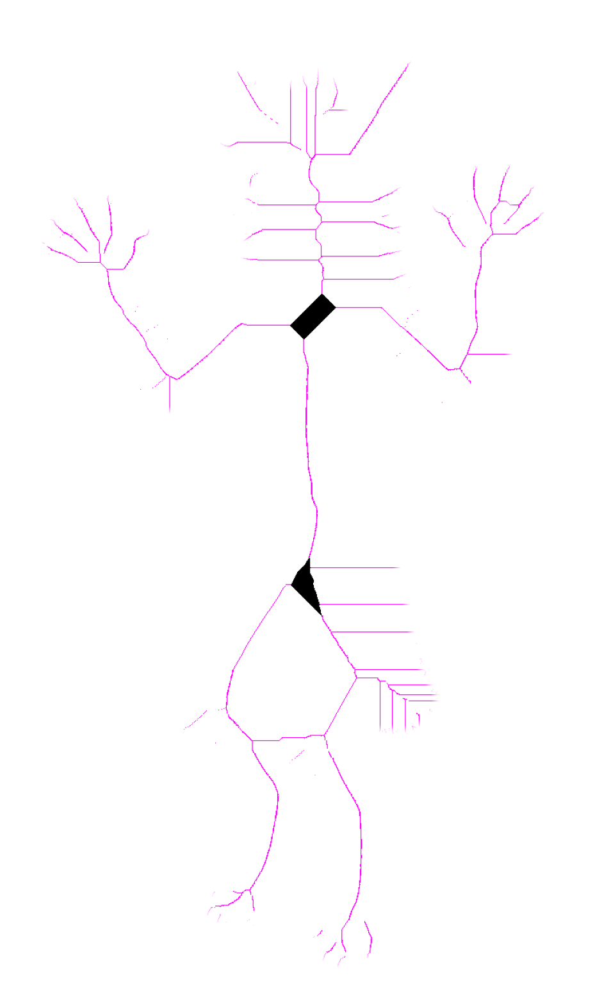

482


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.799999999999974..1.0].


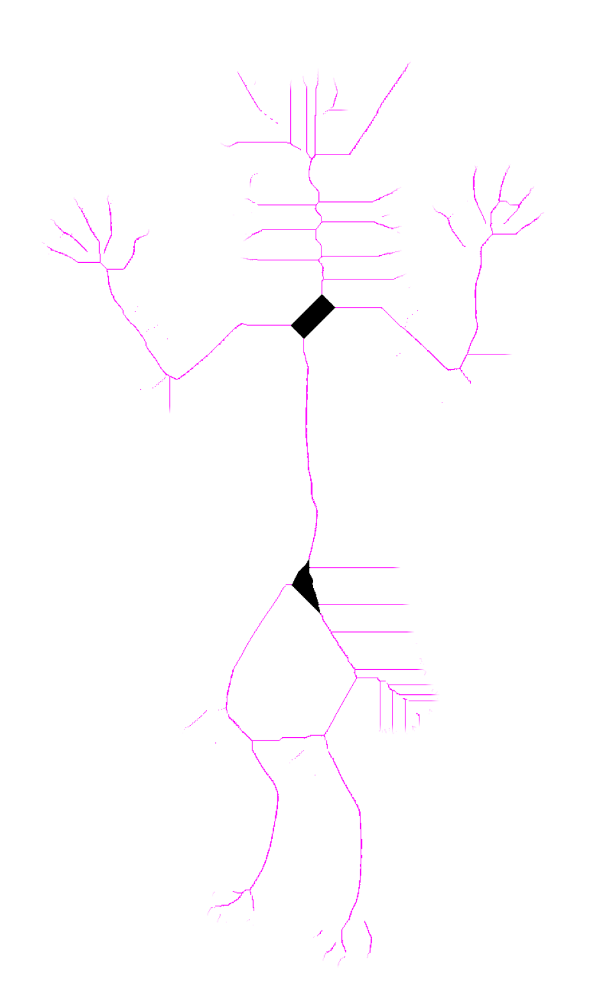

458


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.899999999999974..1.0].


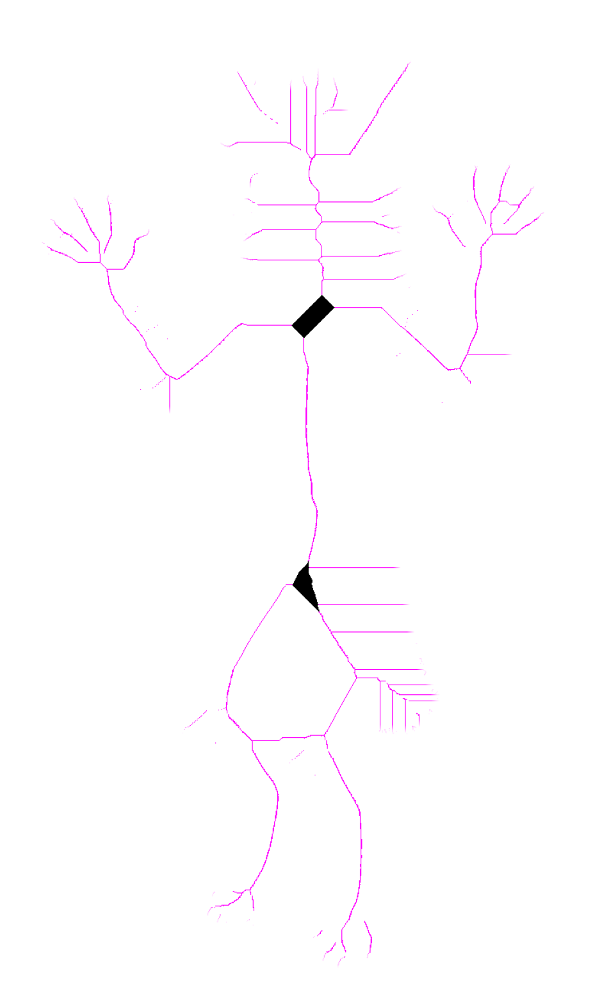

432


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.999999999999973..1.0].


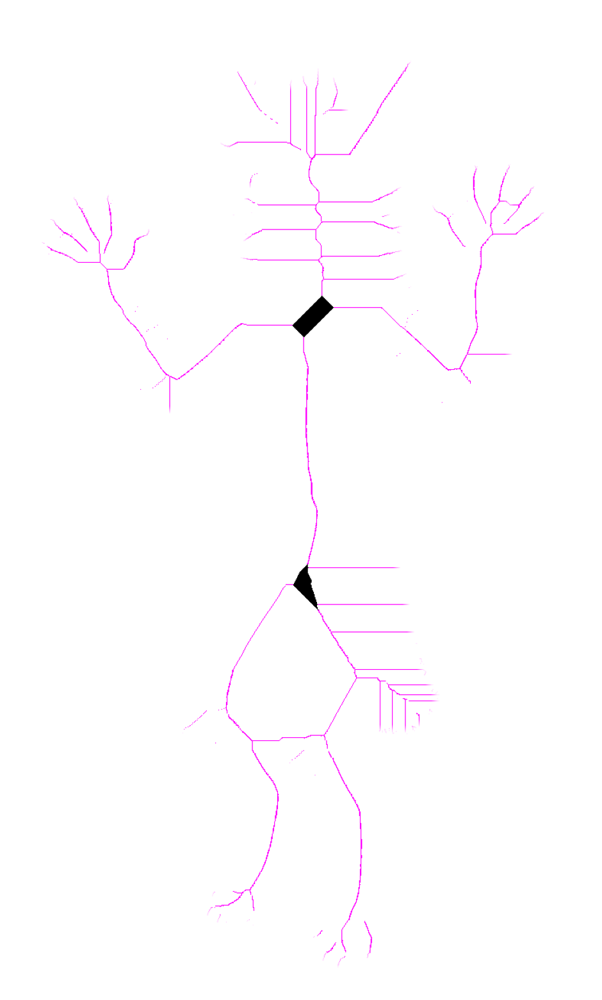

408


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.099999999999973..1.0].


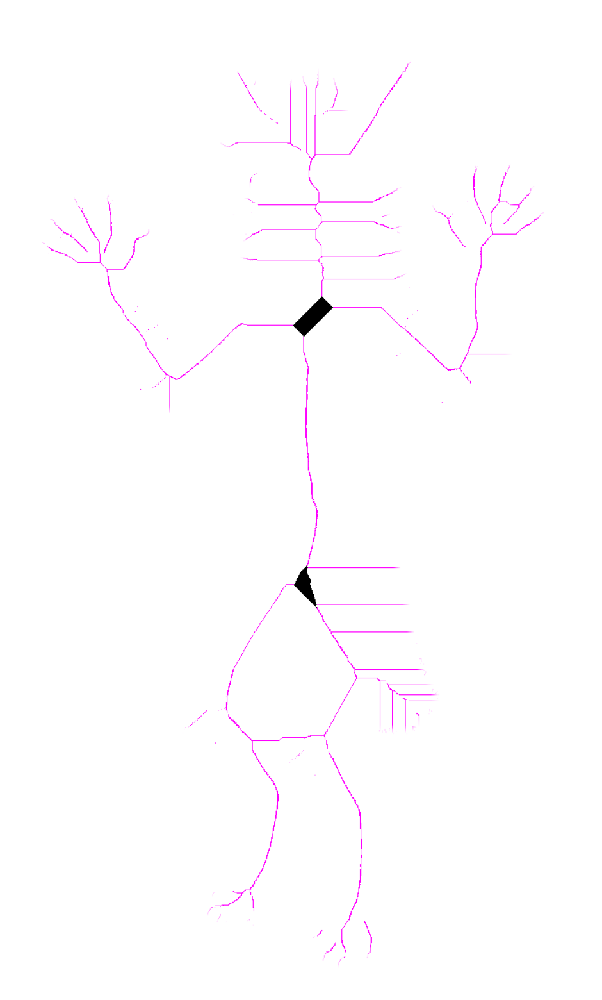

384


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.199999999999973..1.0].


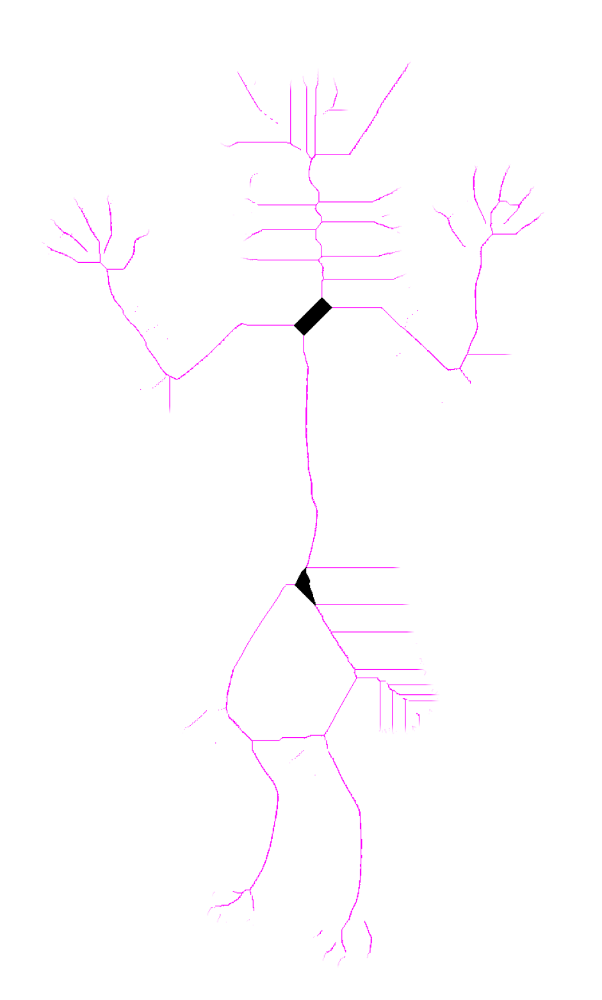

360


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.299999999999972..1.0].


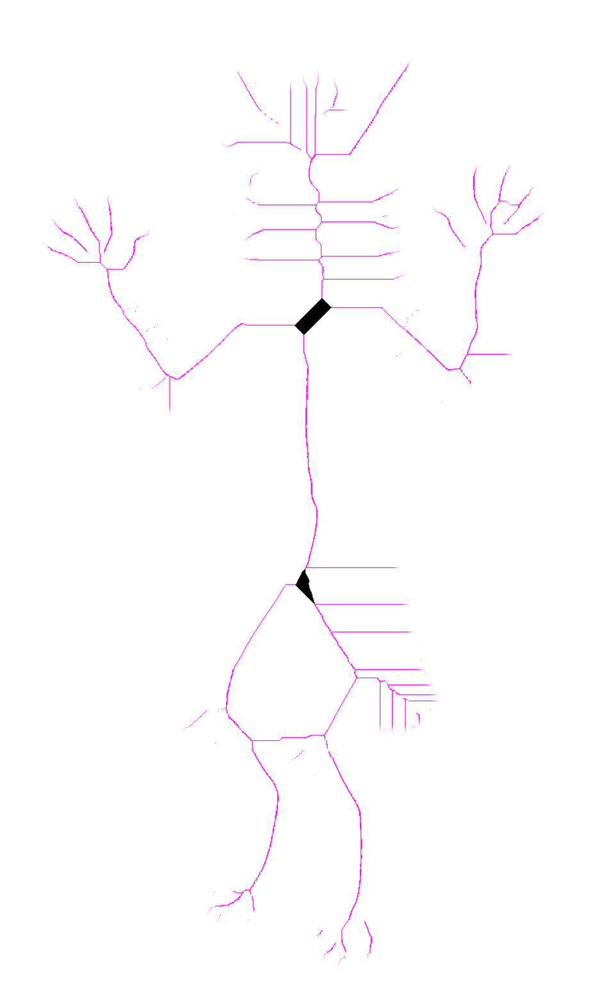

340


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.399999999999972..1.0].


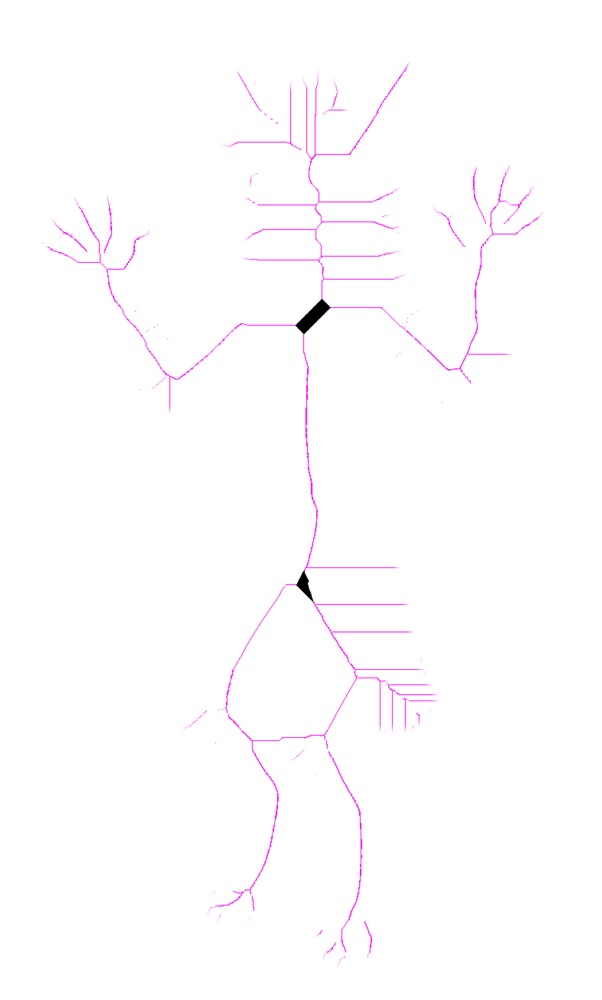

316


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.499999999999972..1.0].


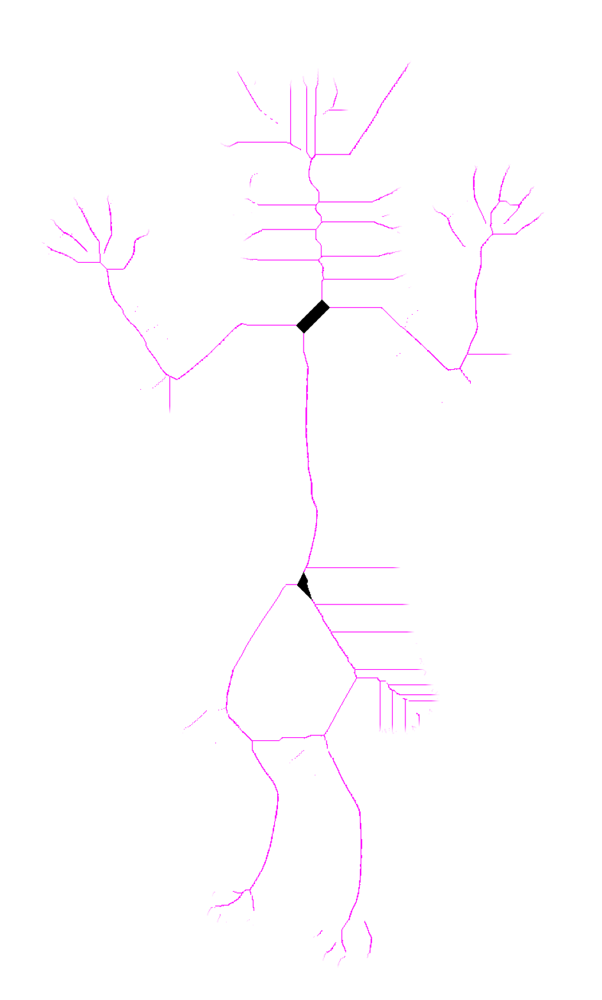

292


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.599999999999971..1.0].


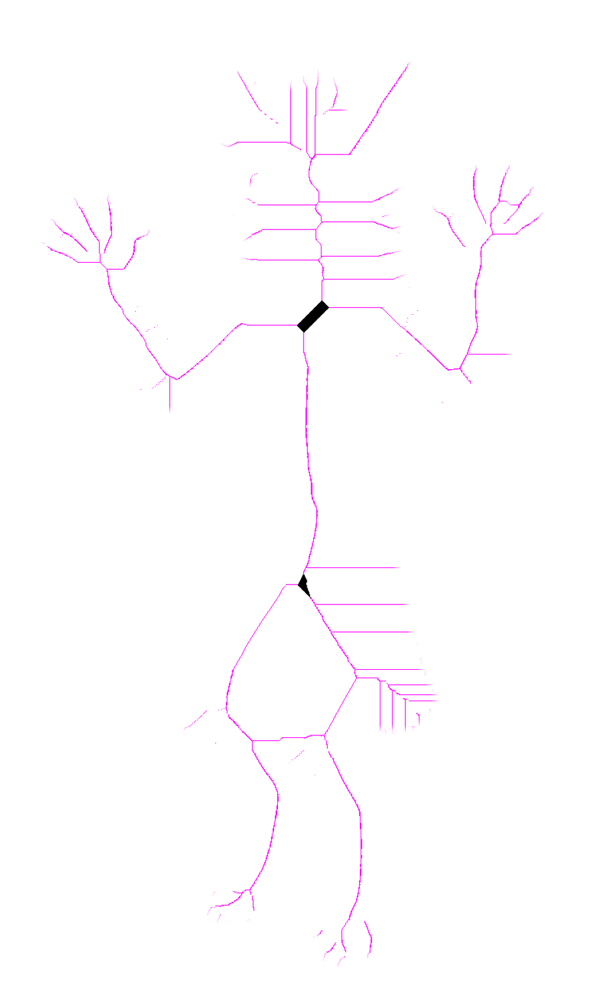

268


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.69999999999997..1.0].


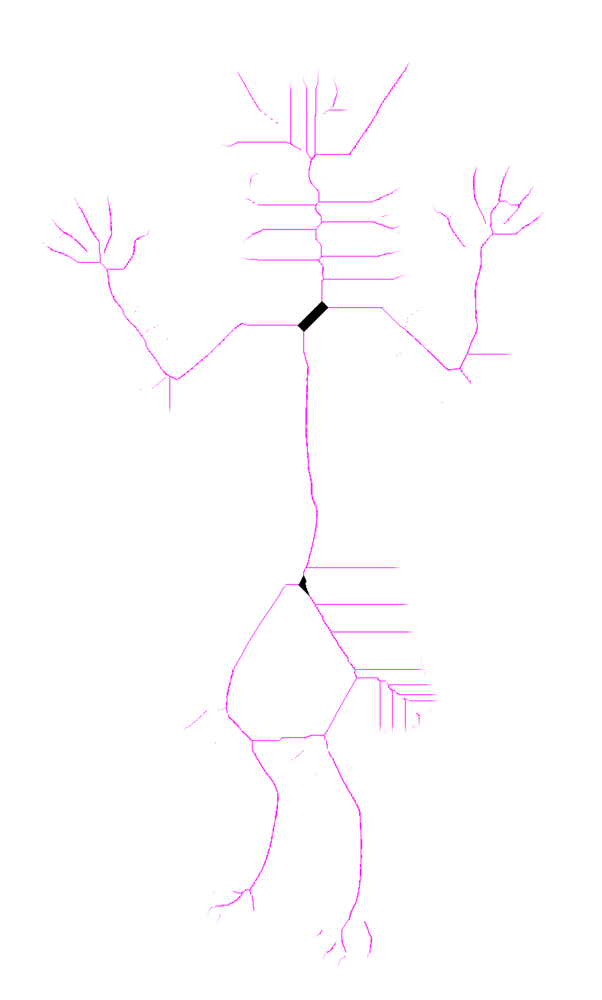

244


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.79999999999997..1.0].


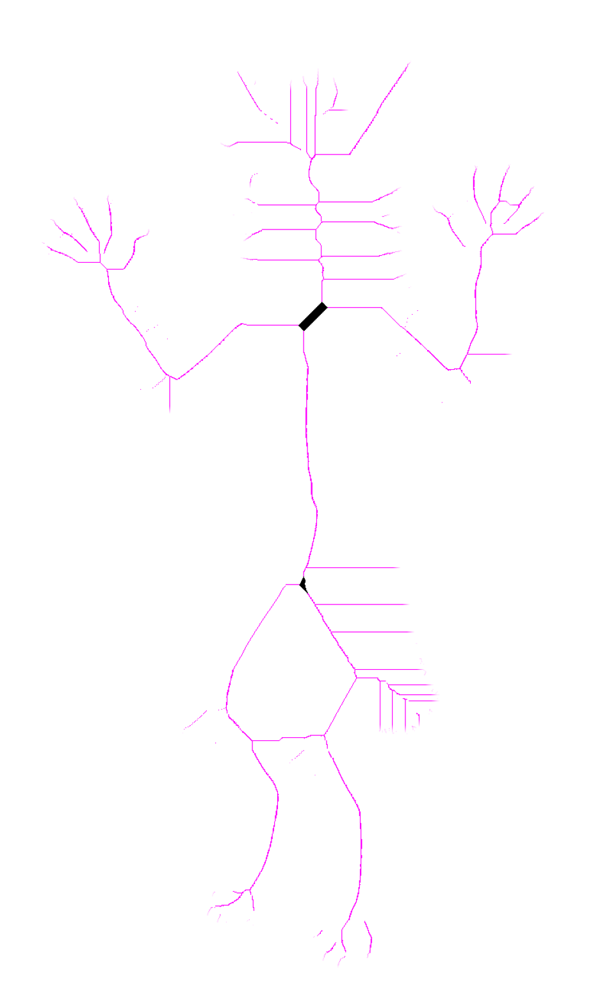

220


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.89999999999997..1.0].


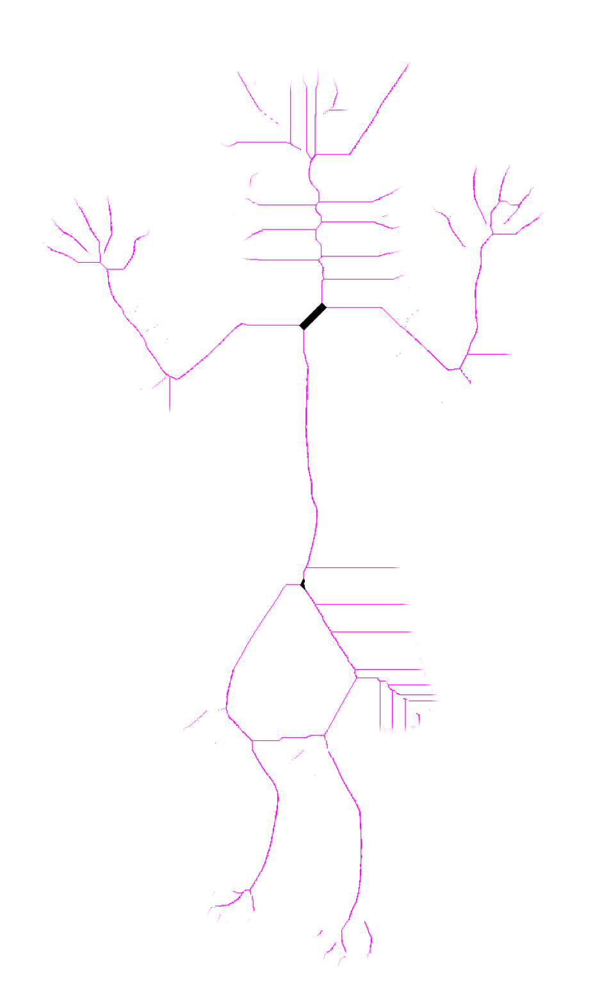

196


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.99999999999997..1.0].


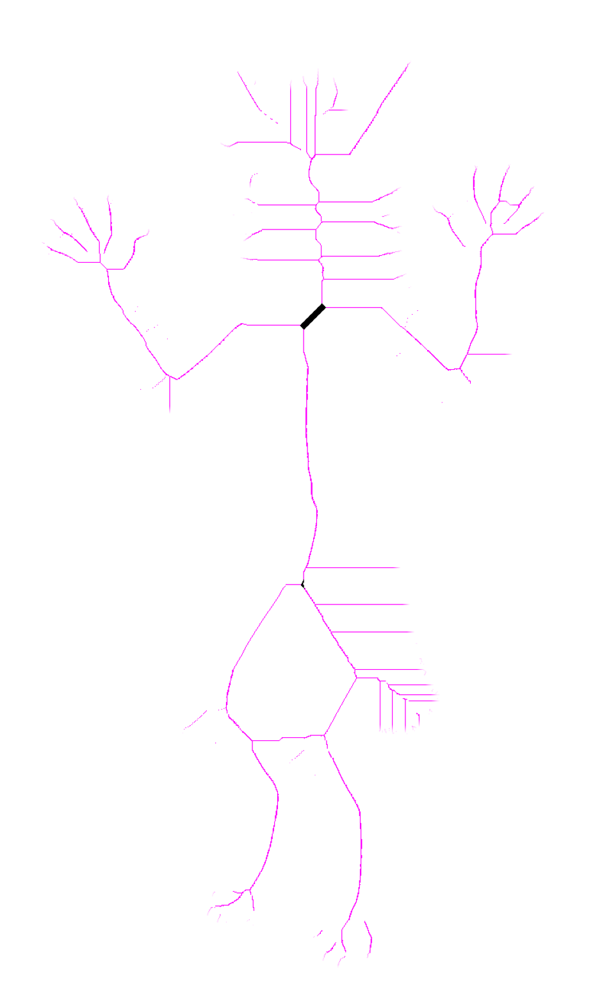

172


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.09999999999997..1.0].


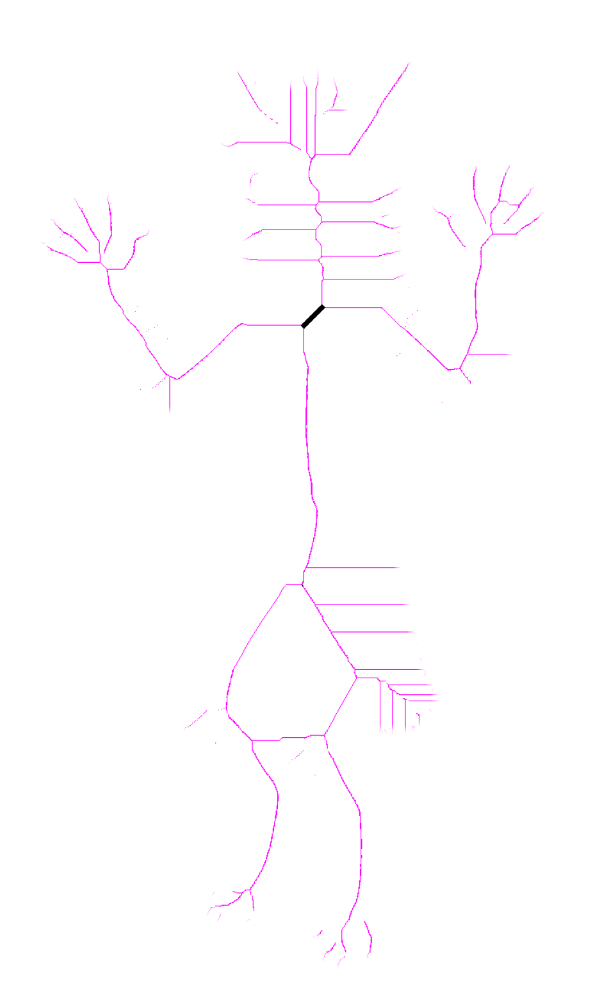

138


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.199999999999969..1.0].


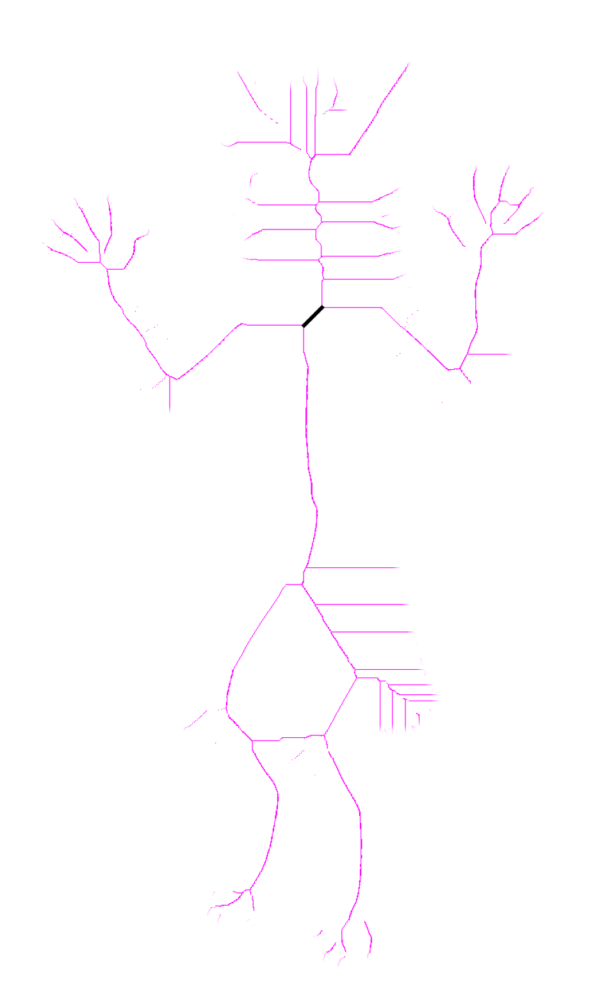

120


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.299999999999969..1.0].


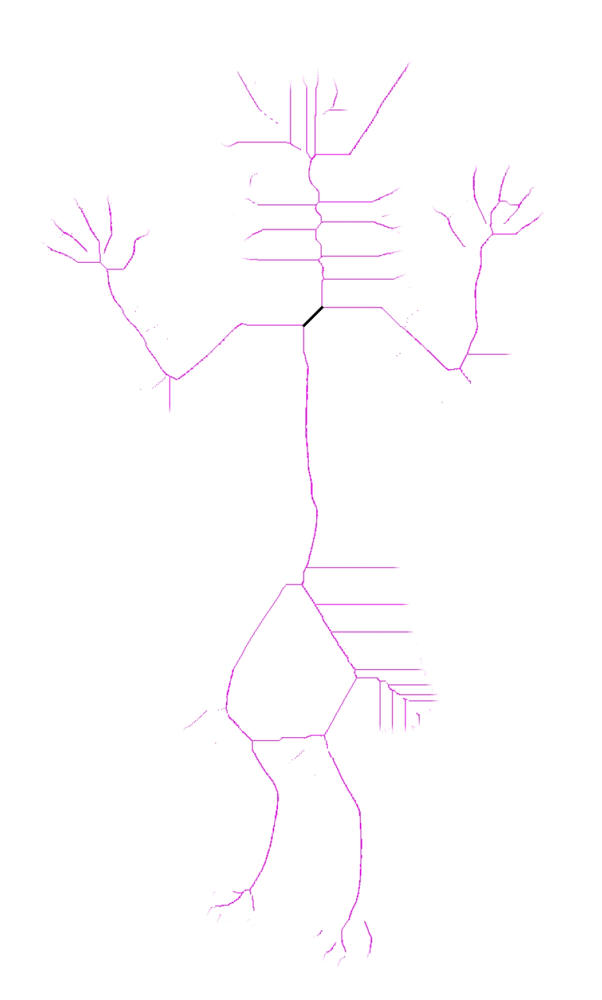

112


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.399999999999968..1.0].


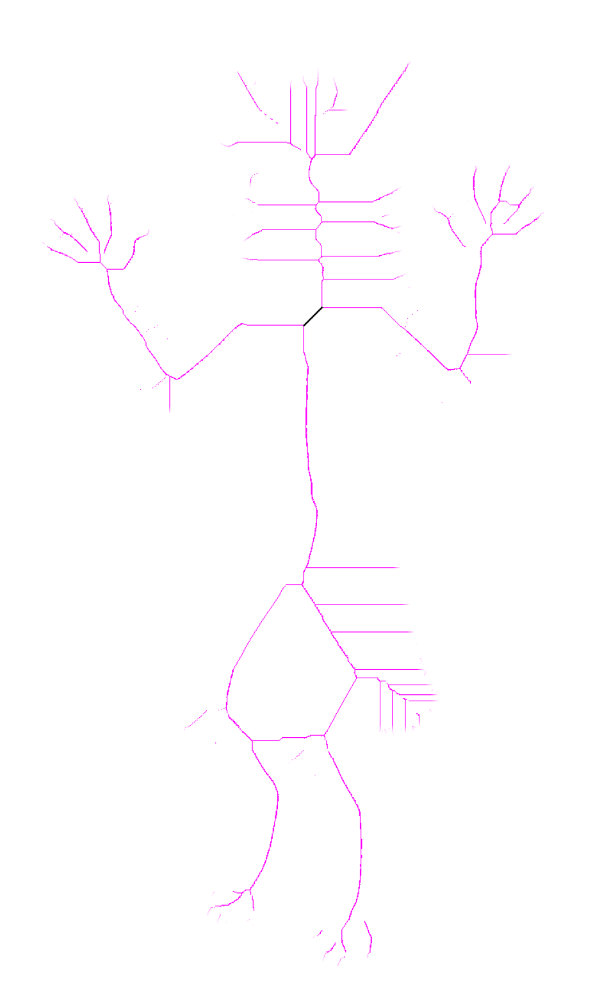

104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.499999999999968..1.0].


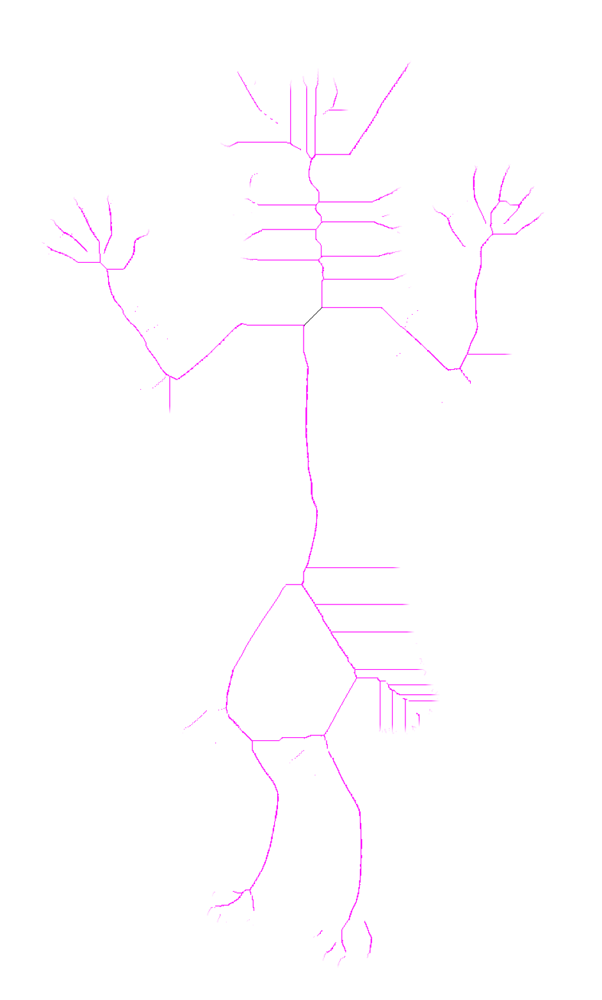

96


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.599999999999968..1.0].


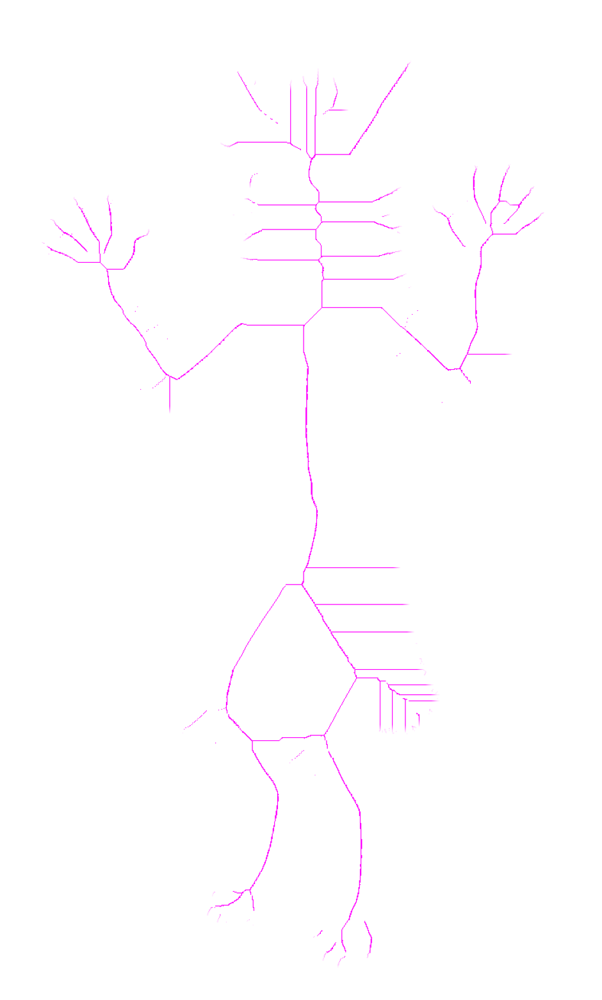

0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.599999999999968..1.0].


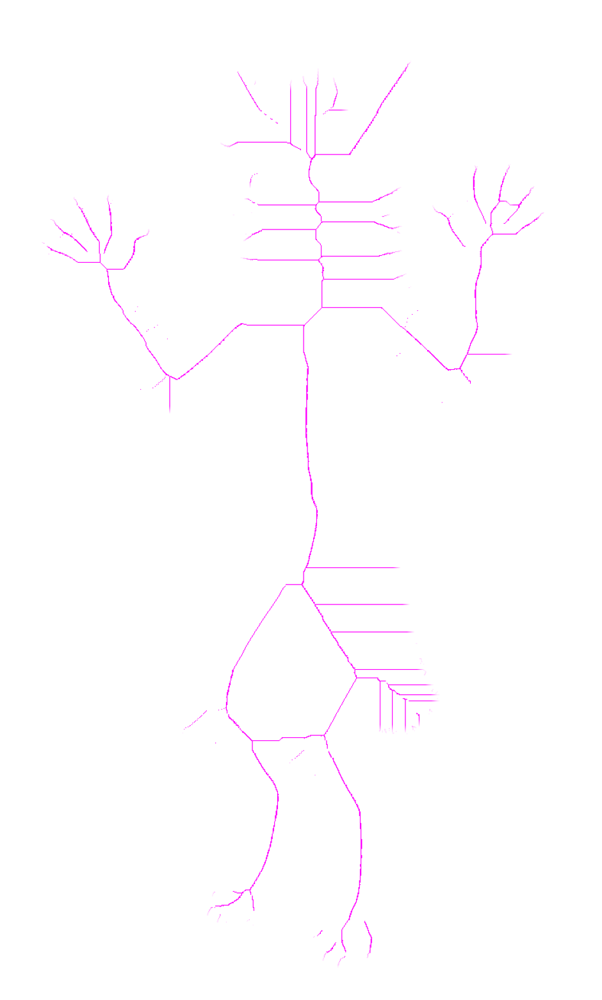

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..13.599999999999968].


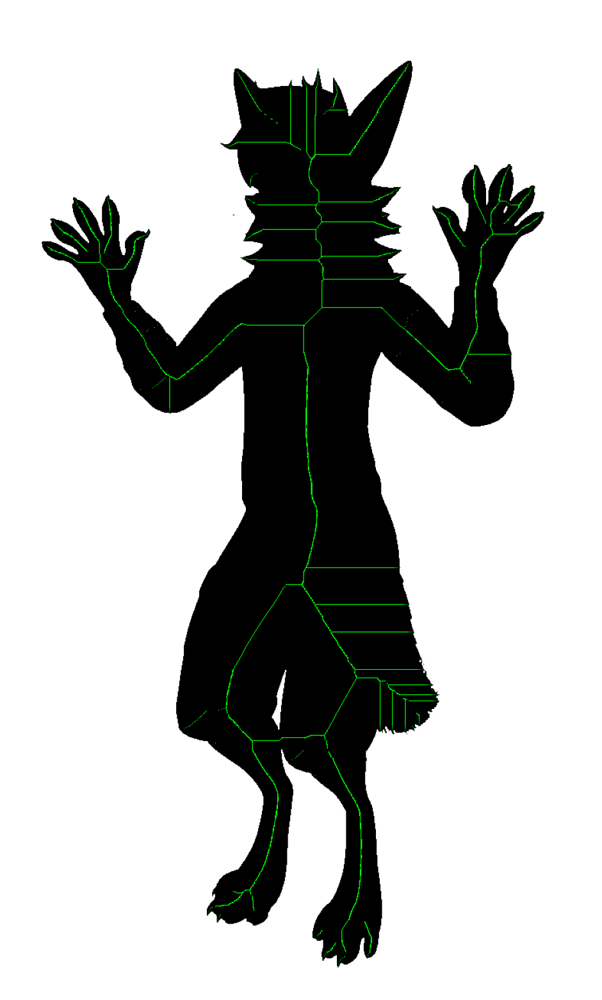

In [106]:
image3, line_image = shrink_to_lines(image2)
combined_image = np.add(image2[:, :, :3], line_image)
display_image(combined_image)

In [14]:
gray = [0.0, 0.1, 0.1]

def shrink_to_lines(img_input):
    new_image = np.zeros((img_input.shape[0], img_input.shape[1], 3))
    line_color = [0, 0, 0]
    for _ in range(500):
        still_black=False; #do this till 1000 or no more black
        line_color = np.add(line_color, gray)
        img = np.copy(img_input)
        for x in range(img_input.shape[1]):
            for y in range(img_input.shape[0]):
                if (img_input[y, x, 3]) == 1: #if opaque and on border make transparent
                    still_black=True


                    if y > 0: #up
                        if img_input[y - 1, x, 3] == 0:
                            img[y, x, :] = transparent 

                    if x > 0:
                        if img_input[y, x - 1, 3] == 0: #left
                            img[y, x, :] = transparent

                    if y < img_input.shape[0] - 1:
                        if img_input[y + 1, x, 3] == 0:
                            img[y, x, :] = transparent  

                    if x < img.shape[1] - 1:
                        if img_input[y, x + 1, 3] == 0: #right
                            img[y, x, :] = transparent
                    
                    #build lines
                    if ((y > 0) and (y < img_input.shape[0] - 1)):
                        if ((img[y - 1, x, 3] == 0) and (img[y + 1, x, 3] == 0)): #line is black with white on two sides
                            new_image[y, x, :] = line_color
                    
                    if ((x > 0) and ( x < img.shape[1] - 1)):
                        if ((img[y, x - 1, 3] == 0) and (img[y, x + 1, 3] == 0)): #line is black with white on two sides
                            new_image[y, x, :] = line_color

                    if ((y > 0) and (y < img_input.shape[0] - 1) and (x > 0) and ( x < img.shape[1] - 1)):
                        if ((img[y + 1, x + 1, 3] == 0) and (img[y - 1, x - 1, 3] == 0) and (img[y + 1, x - 1, 3] != 0) and (img[y - 1, x + 1, 3] != 0)):
                            new_image[y, x, :] = line_color
                        if ((img[y + 1, x + 1, 3] != 0) and (img[y - 1, x - 1, 3] != 0) and (img[y + 1, x - 1, 3] == 0) and (img[y - 1, x + 1, 3] == 0)):
                            new_image[y, x, :] = line_color
                    
                   
        img_input = img
        combined_image = np.subtract(img_input[:, :, :3], new_image)
        display_image(combined_image)

        if (still_black==False):
            return (img, new_image)
            
    return (img, new_image)

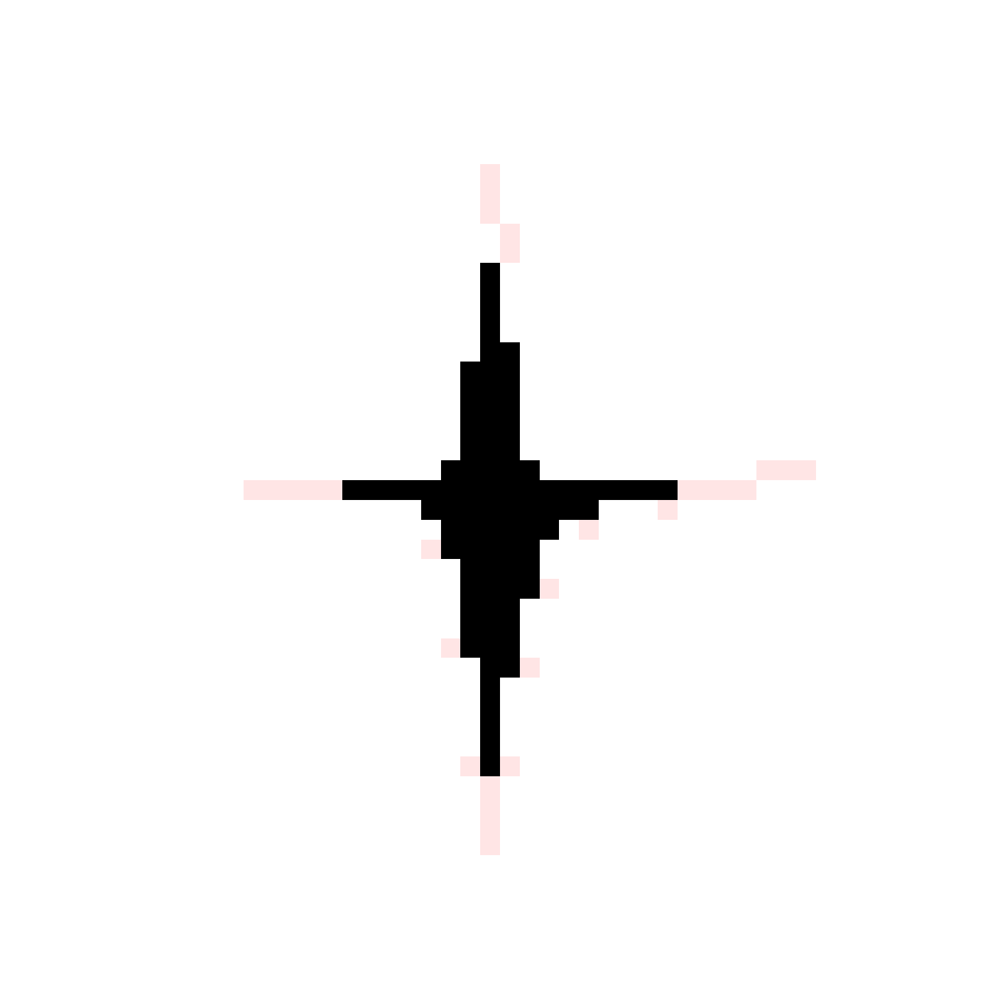

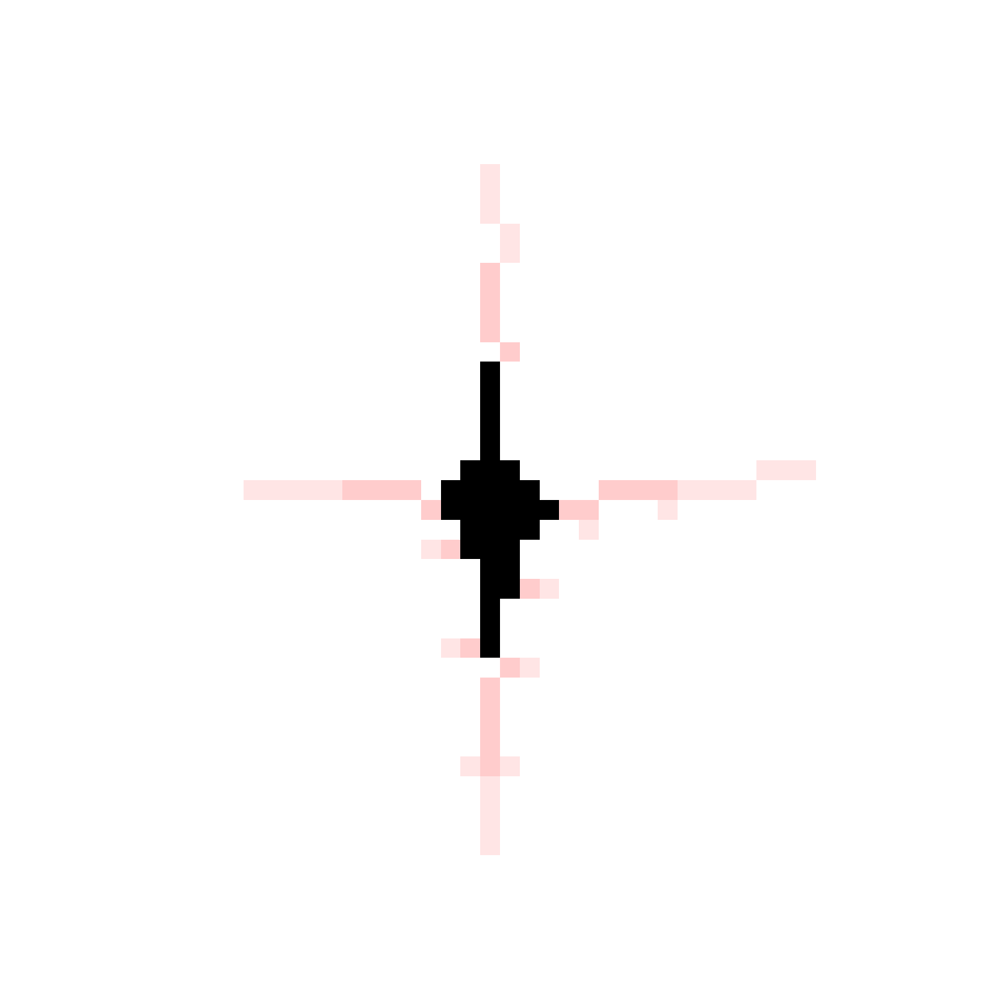

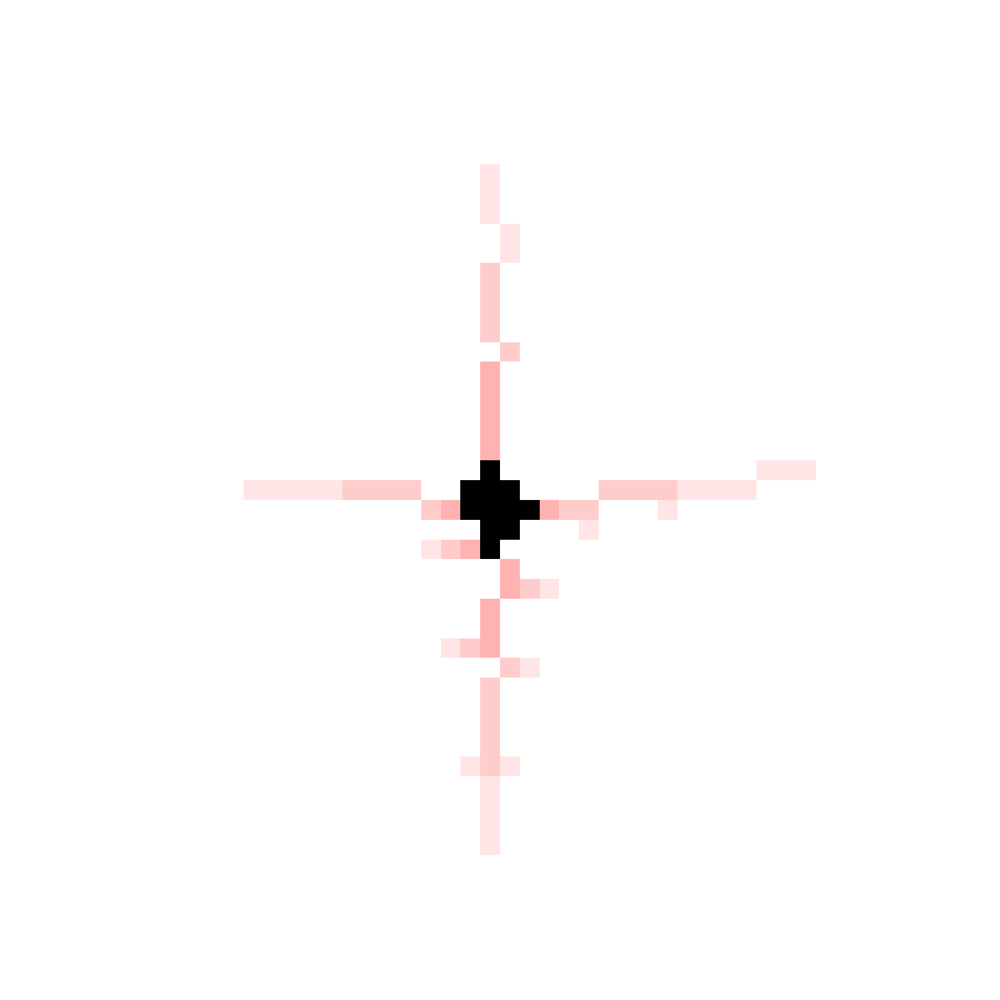

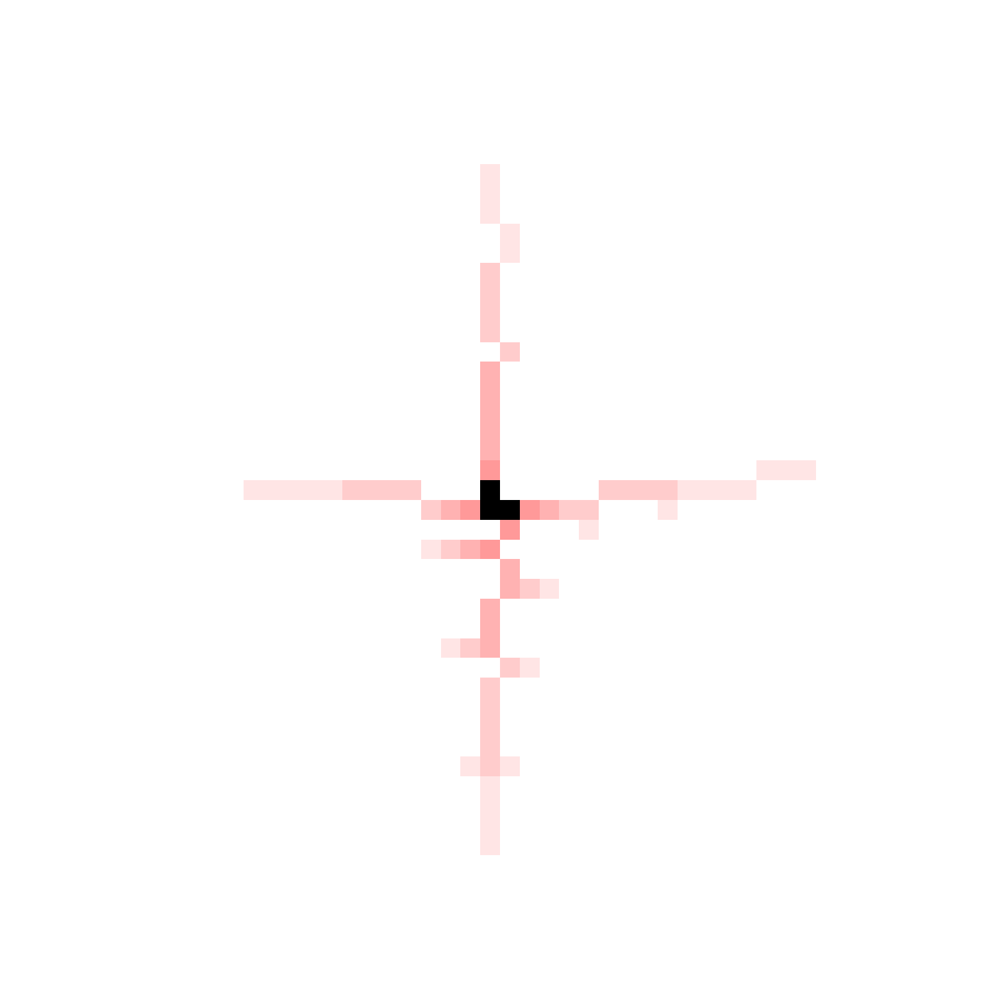

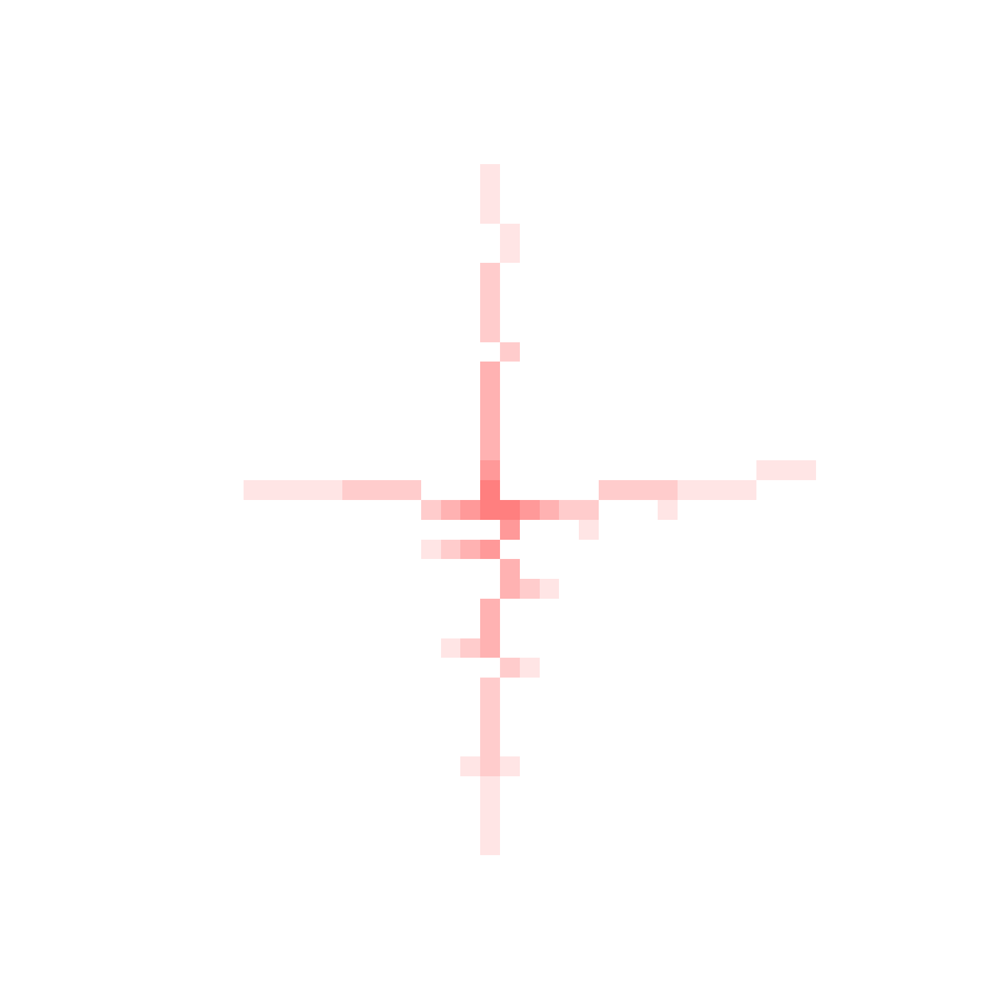

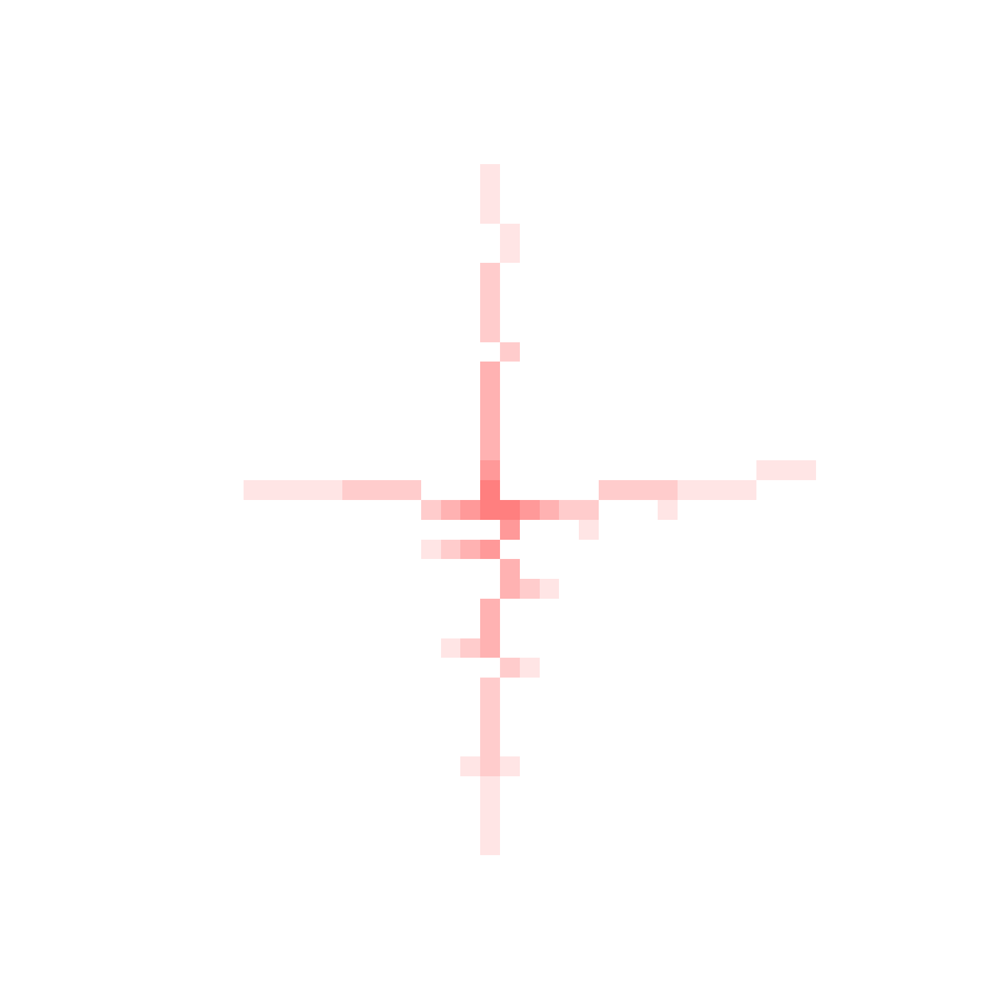

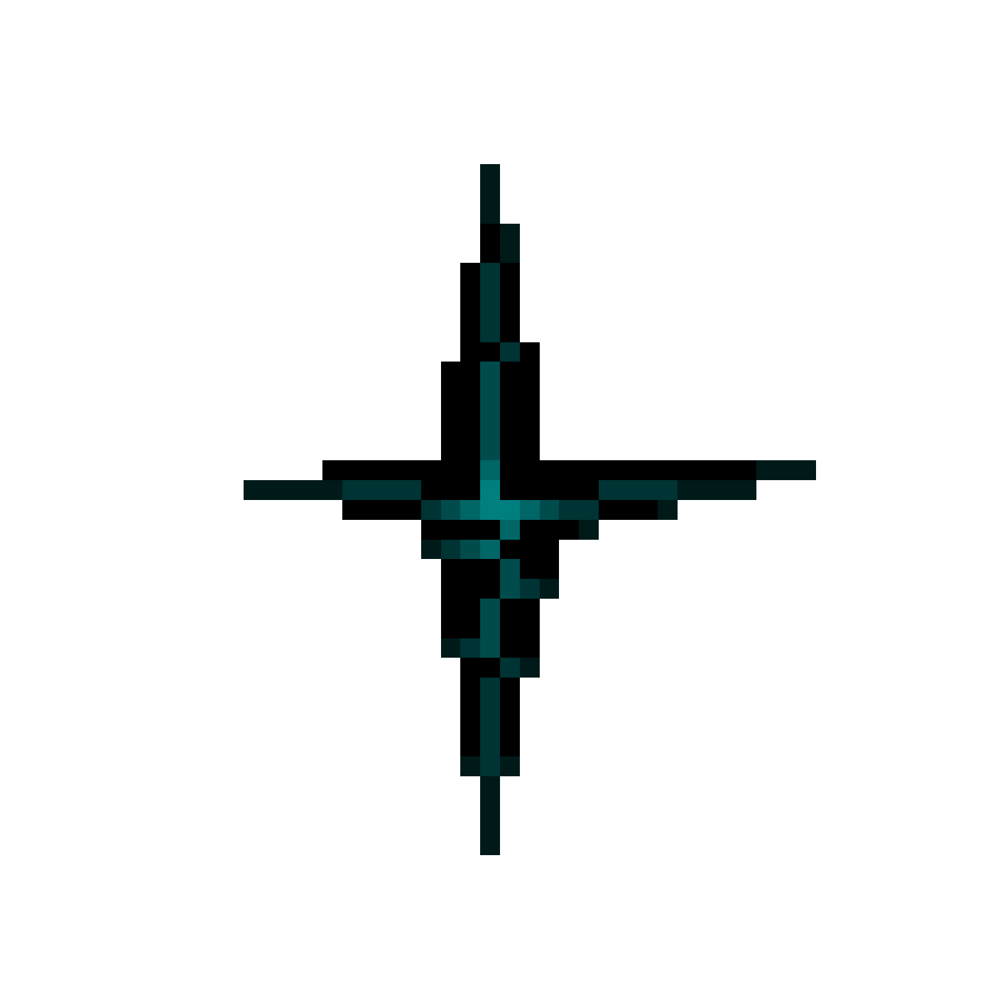

In [15]:
image3, line_image = shrink_to_lines(image2)
combined_image = np.add(image2[:, :, :3], line_image)
display_image(combined_image)

In [16]:
gray = [0.0, 0.1, 0.1]

def shrink_to_lines(img_input):
    new_image = np.zeros((img_input.shape[0], img_input.shape[1], 3))
    counter = 0
    line_color = [0, 0, 0]
    for _ in range(500):
        still_black=False; #do this till 1000 or no more black
        line_color = np.add(line_color, gray)
        img = np.copy(img_input)
        for x in range(img_input.shape[1]):
            for y in range(img_input.shape[0]):
                if (img_input[y, x, 3]) == 1: #if opaque and on border make transparent
                    still_black=True
                    
                    #build lines
                    if ((y > 0) and (y < img_input.shape[0] - 1)):
                        if ((img_input[y - 1, x, 3] == 0) and (img_input[y + 1, x, 3] == 0)): #line is black with white on two sides
                            new_image[y, x, :] = line_color
                    
                    if ((x > 0) and ( x < img.shape[1] - 1)):
                        if ((img_input[y, x - 1, 3] == 0) and (img_input[y, x + 1, 3] == 0)): #line is black with white on two sides
                            new_image[y, x, :] = line_color

                    if ((y > 0) and (y < img_input.shape[0] - 1) and (x > 0) and ( x < img.shape[1] - 1)):
                        if ((img_input[y + 1, x + 1, 3] == 0) and (img_input[y - 1, x - 1, 3] == 0) and (img_input[y + 1, x - 1, 3] != 0) and (img_input[y - 1, x + 1, 3] != 0)):
                            new_image[y, x, :] = line_color
                        if ((img_input[y + 1, x + 1, 3] != 0) and (img_input[y - 1, x - 1, 3] != 0) and (img_input[y + 1, x - 1, 3] == 0) and (img_input[y - 1, x + 1, 3] == 0)):
                            new_image[y, x, :] = line_color
                    
                    #shrink image
                    if (counter % 4 == 0):
                        if y > 0: #up
                            if img_input[y - 1, x, 3] == 0:
                                img[y, x, :] = transparent 
                    elif (counter % 4 == 1):
                        if x > 0:
                            if img_input[y, x - 1, 3] == 0: #left
                                img[y, x, :] = transparent
                    elif (counter % 4 == 2): #down
                        if y < img_input.shape[0] - 1:
                            if img_input[y + 1, x, 3] == 0:
                                img[y, x, :] = transparent  
                    elif (counter % 4 == 3):
                        if x < img.shape[1] - 1:
                            if img_input[y, x + 1, 3] == 0: #right
                                img[y, x, :] = transparent
        img_input = img
        combined_image = np.subtract(img_input[:, :, :3], new_image)
        display_image(combined_image)
        counter += 1
        print(counter)
        if (still_black==False):
            return (img, new_image)
            
    return (img, new_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1..1.0].


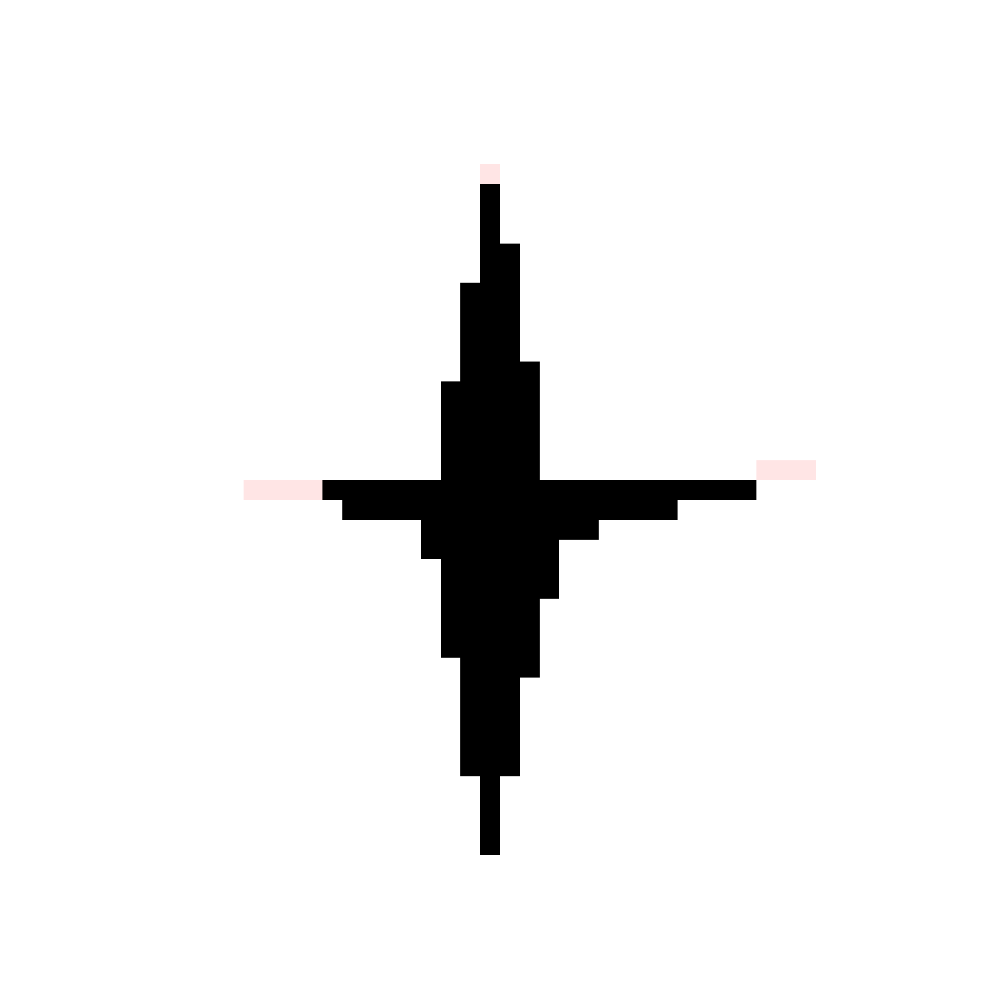

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2..1.0].


1


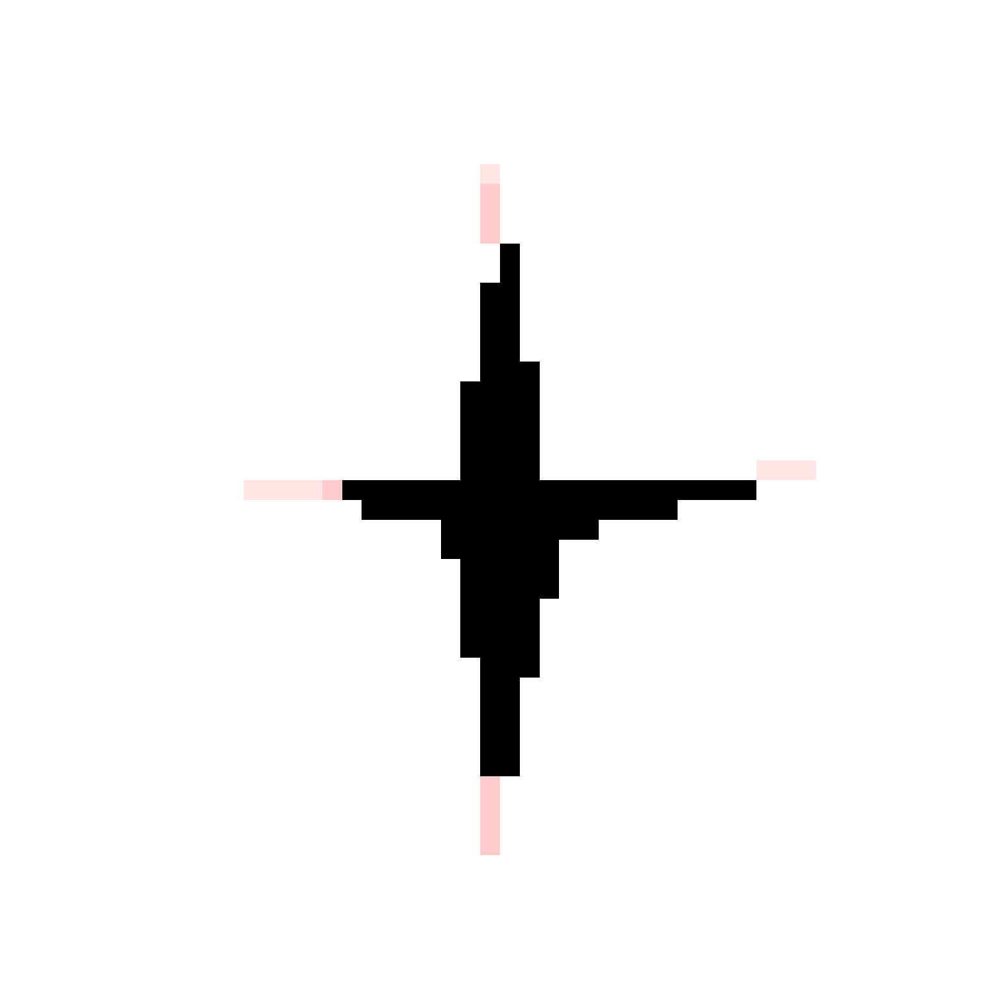

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30000000000000004..1.0].


2


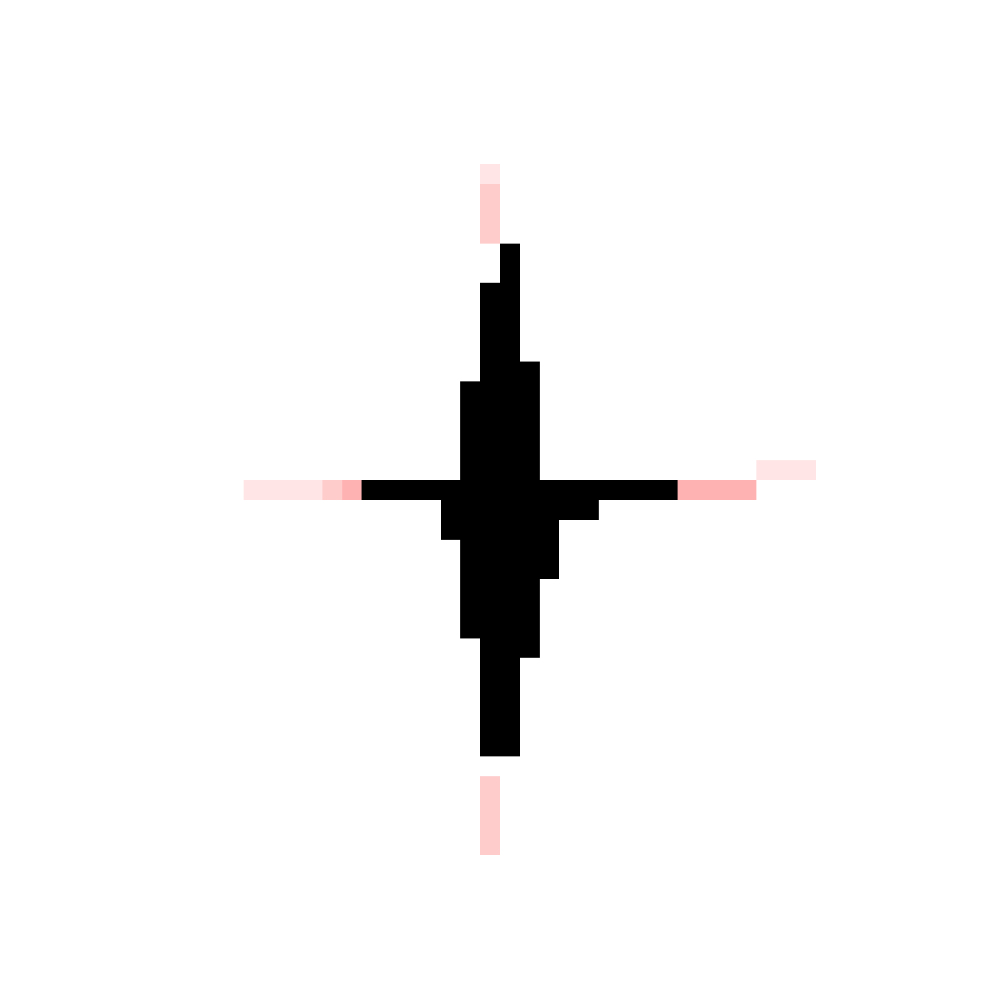

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4..1.0].


3


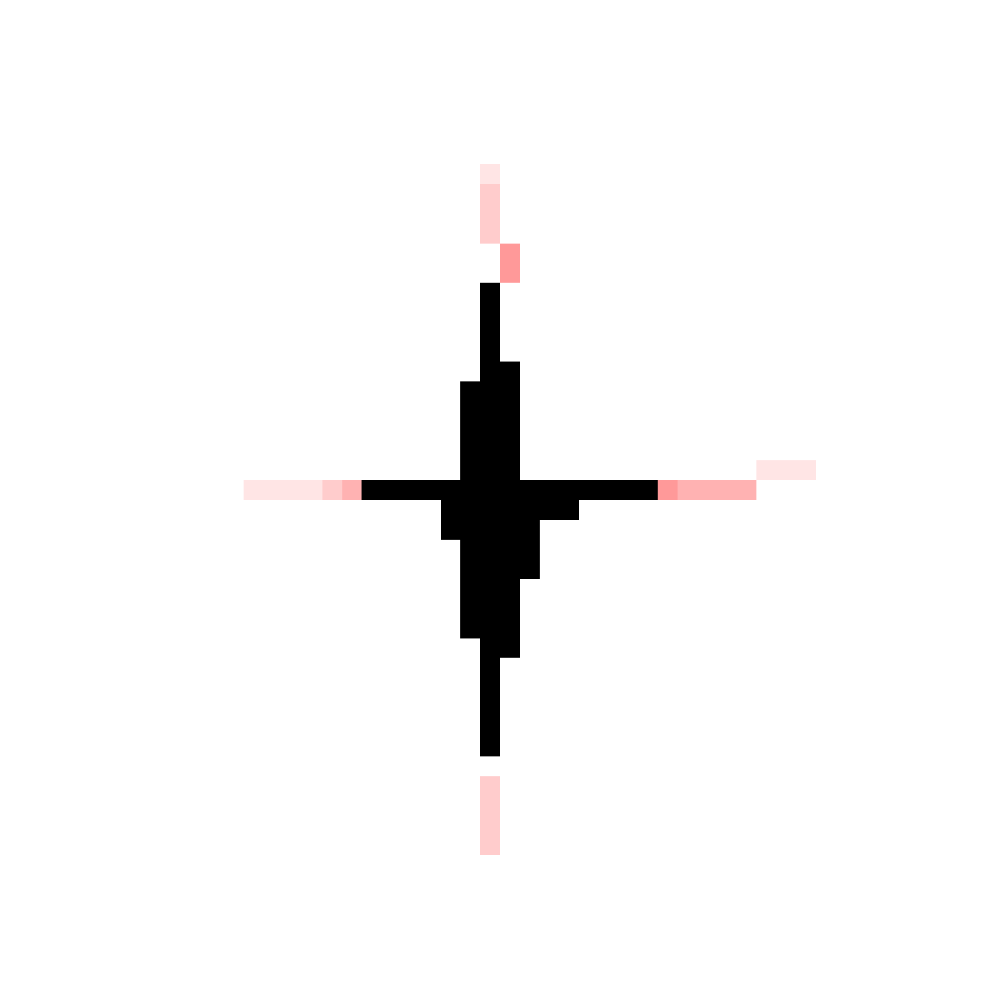

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5..1.0].


4


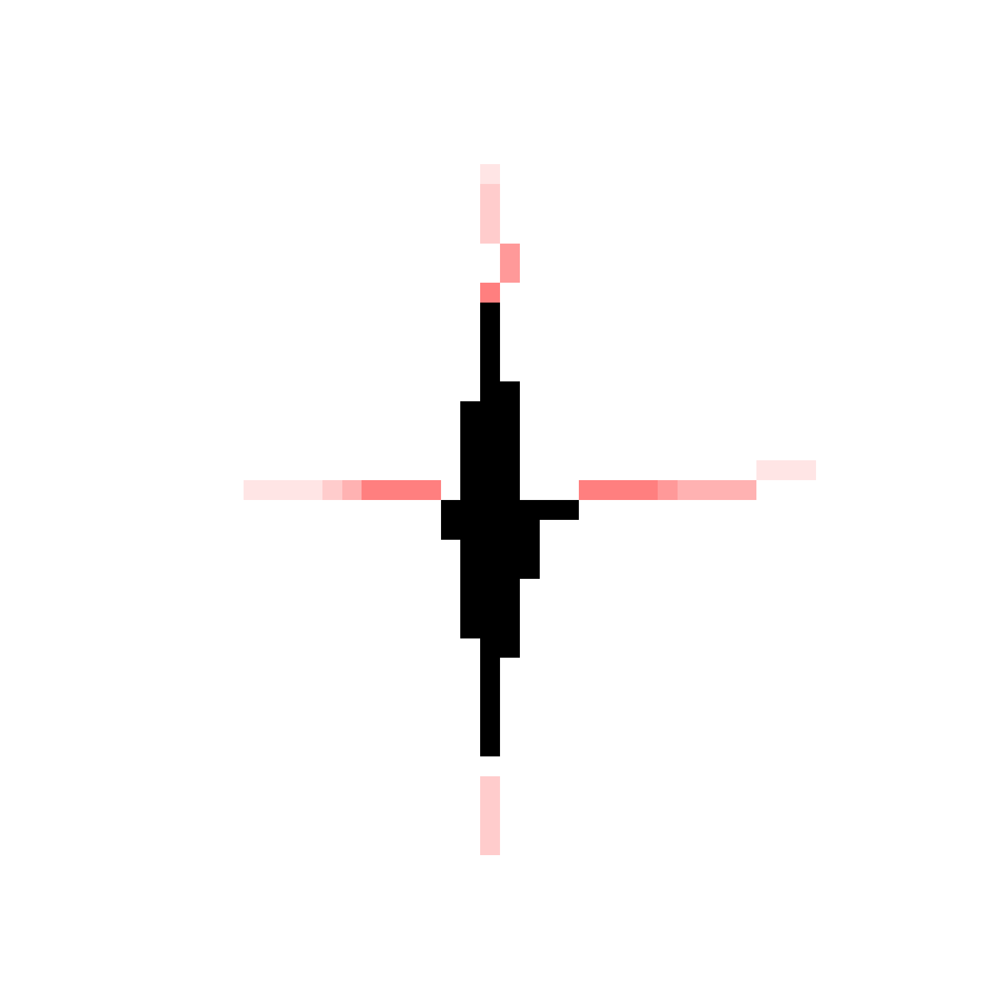

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6..1.0].


5


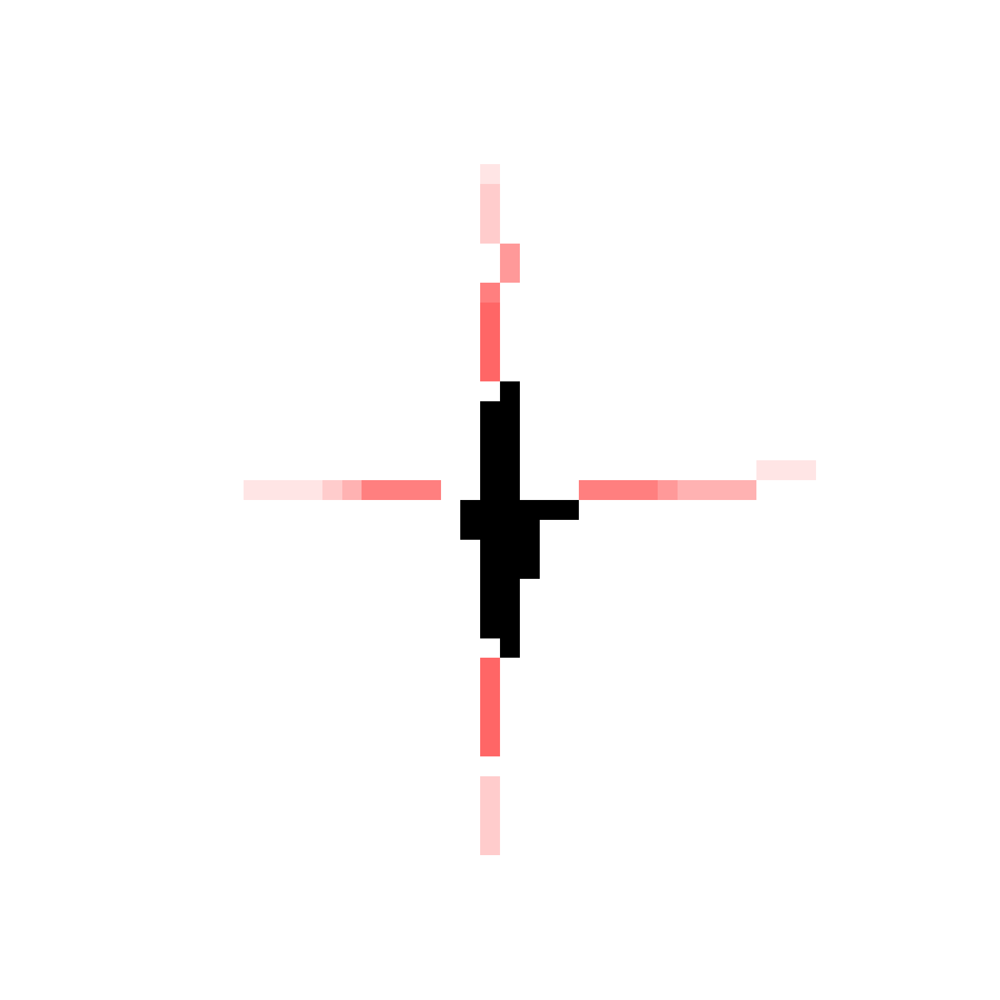

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7..1.0].


6


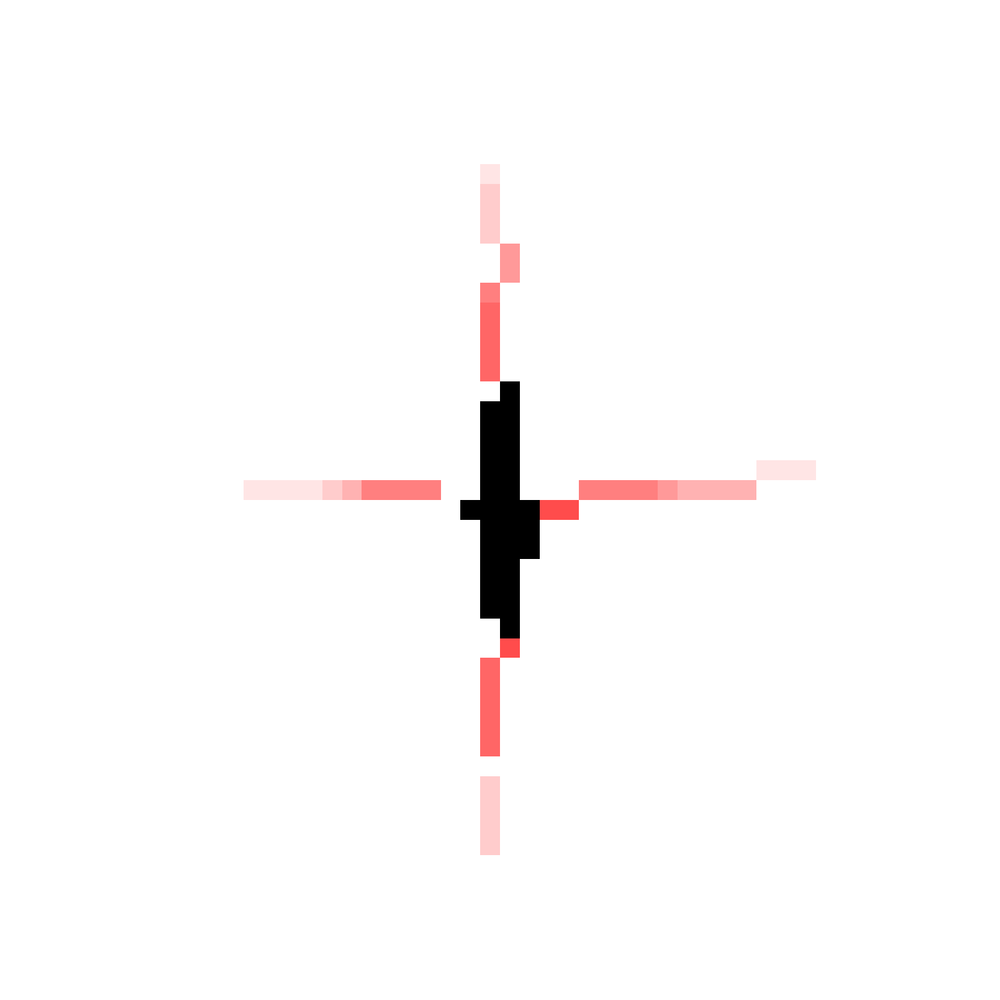

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7999999999999999..1.0].


7


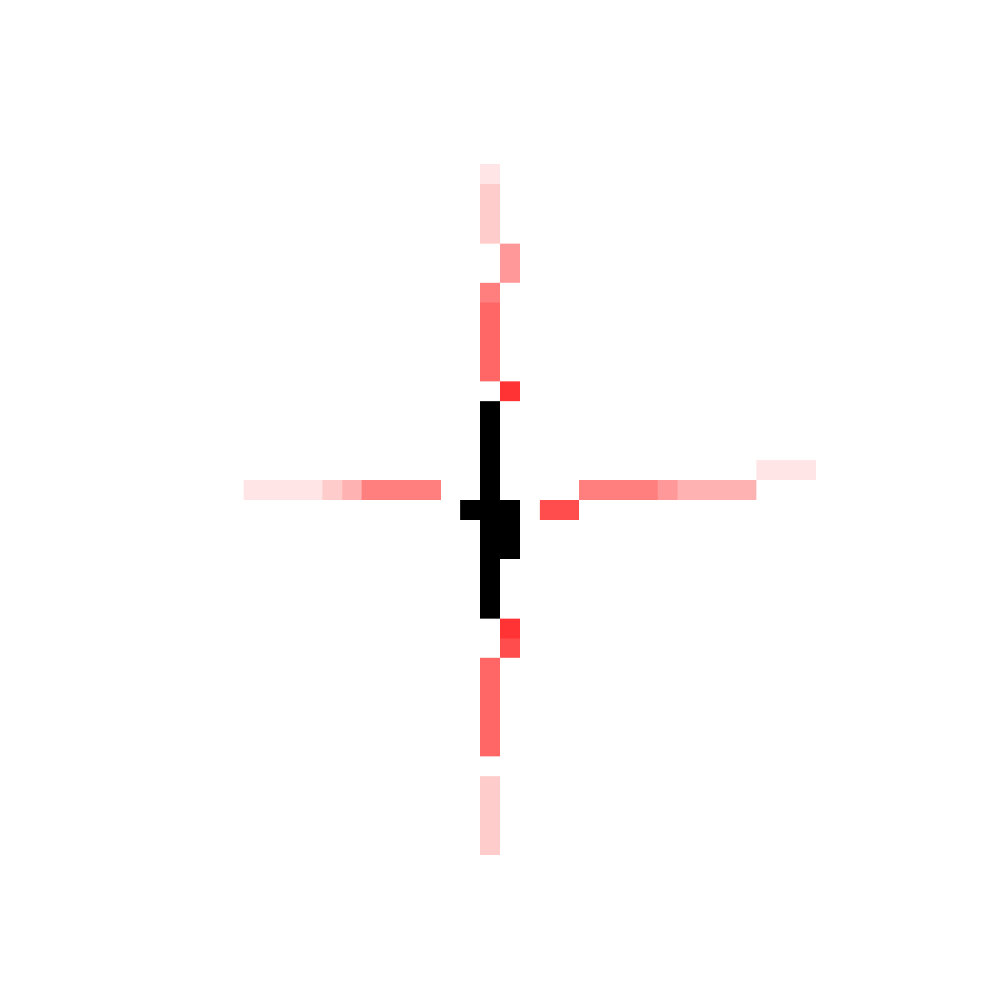

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8999999999999999..1.0].


8


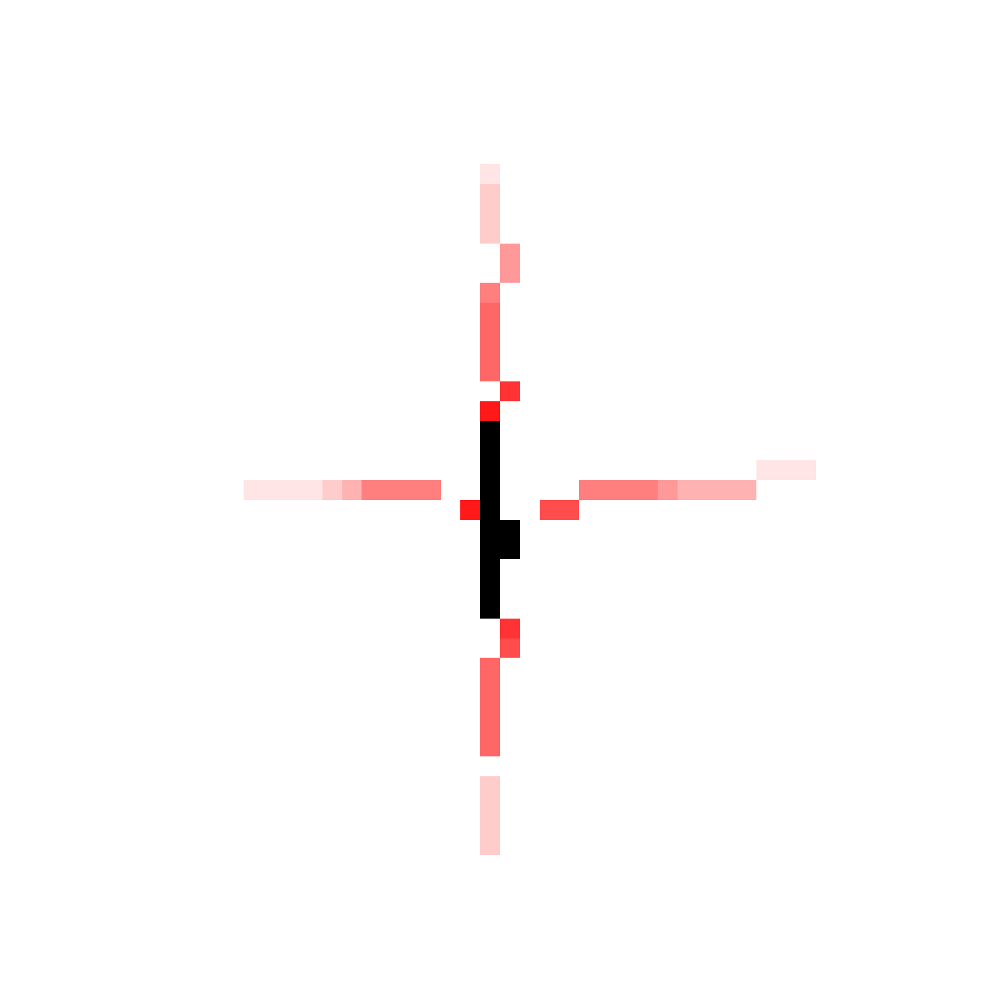

9


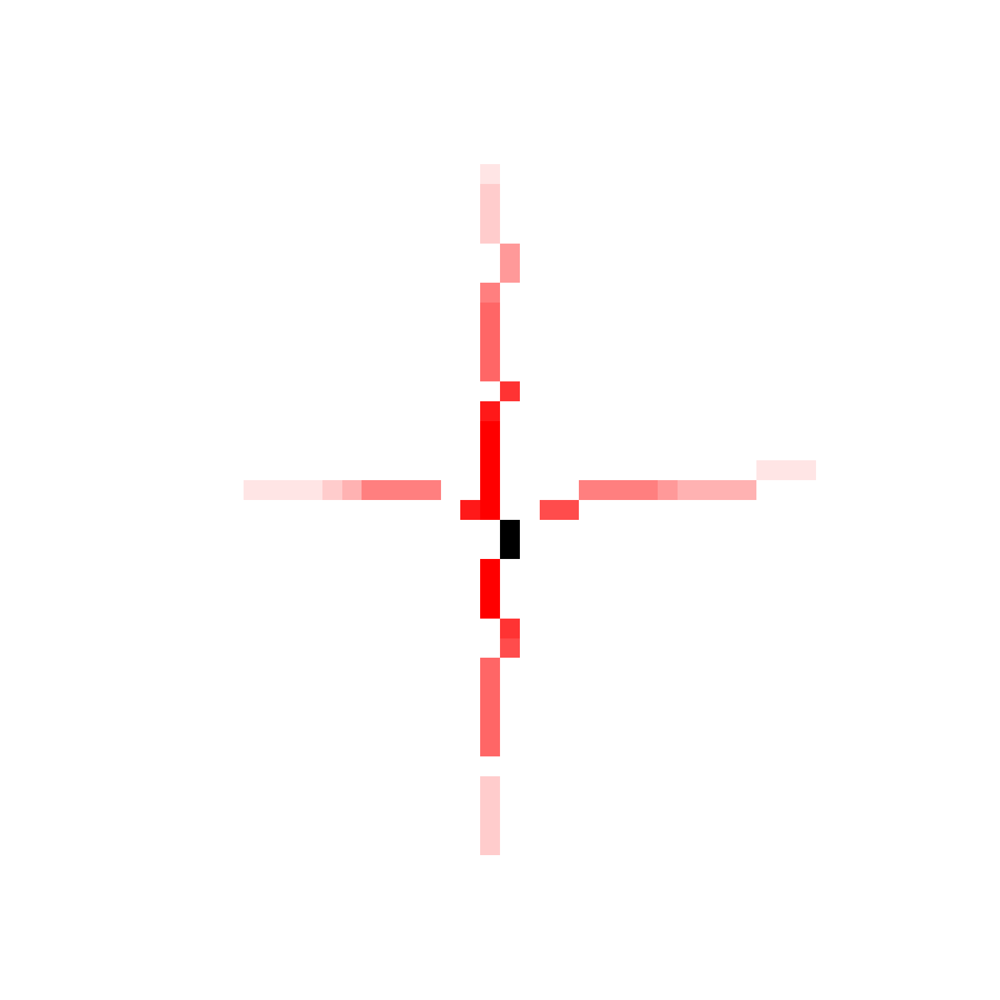

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0999999999999999..1.0].


10


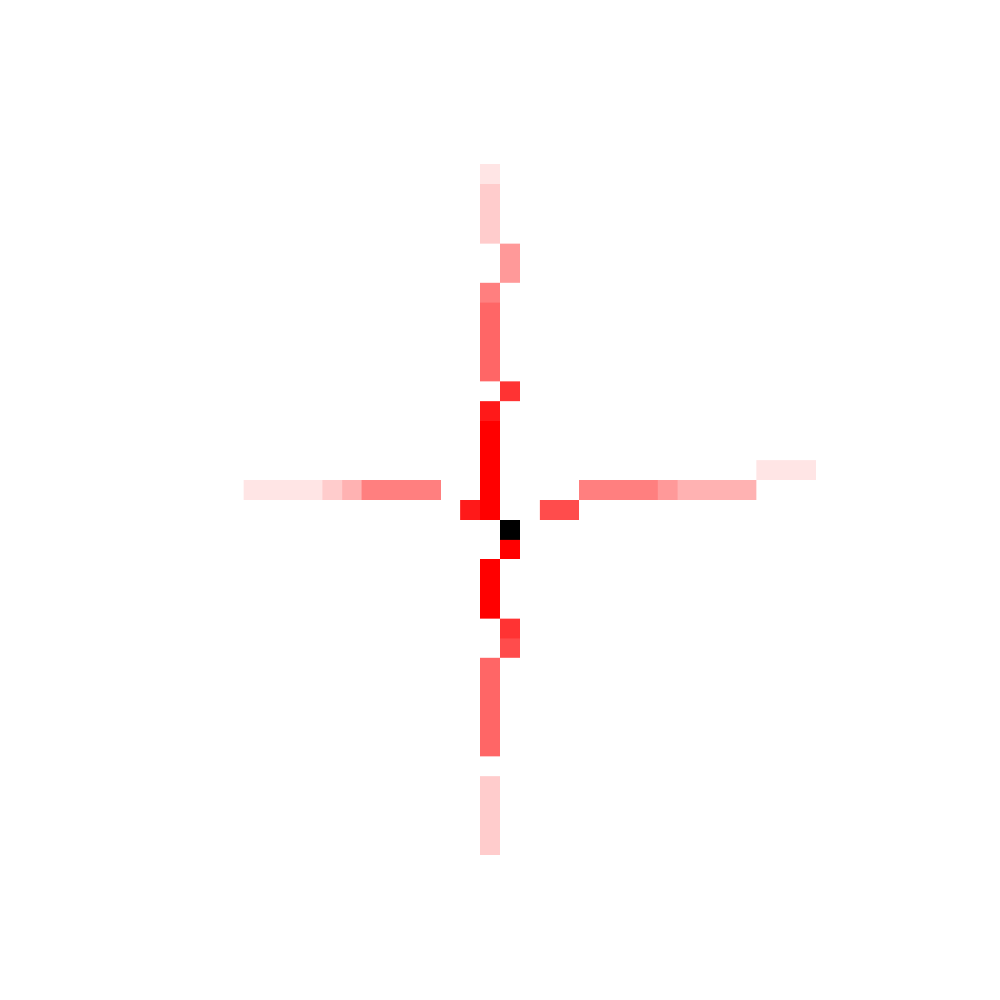

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19999999999999996..1.0].


11


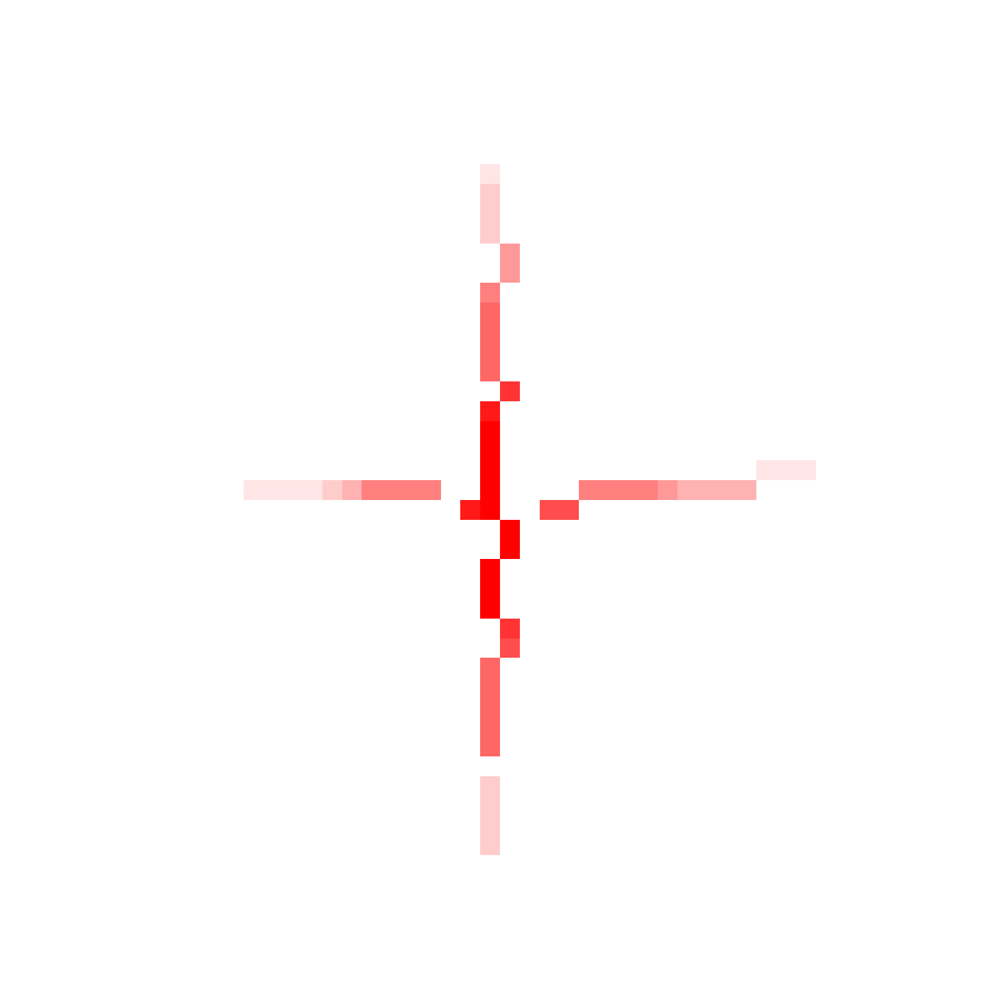

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19999999999999996..1.0].


12


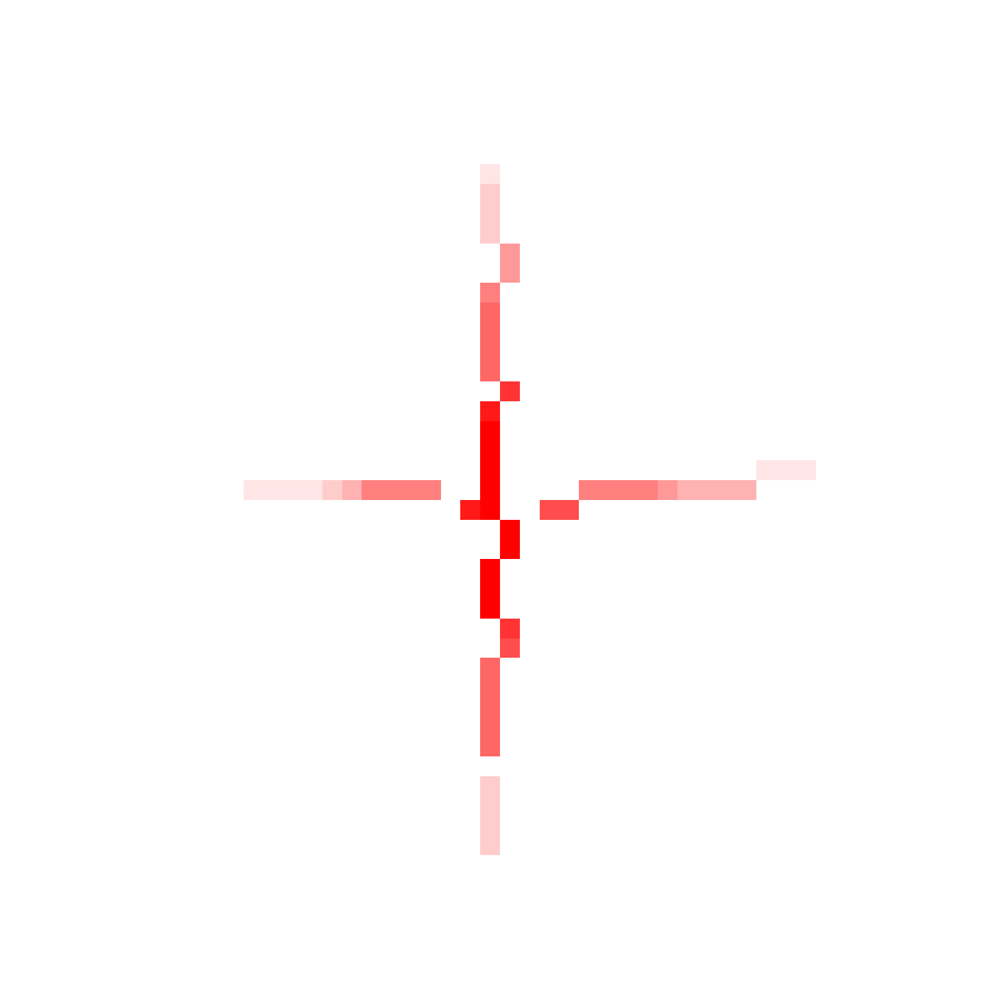

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2].


13


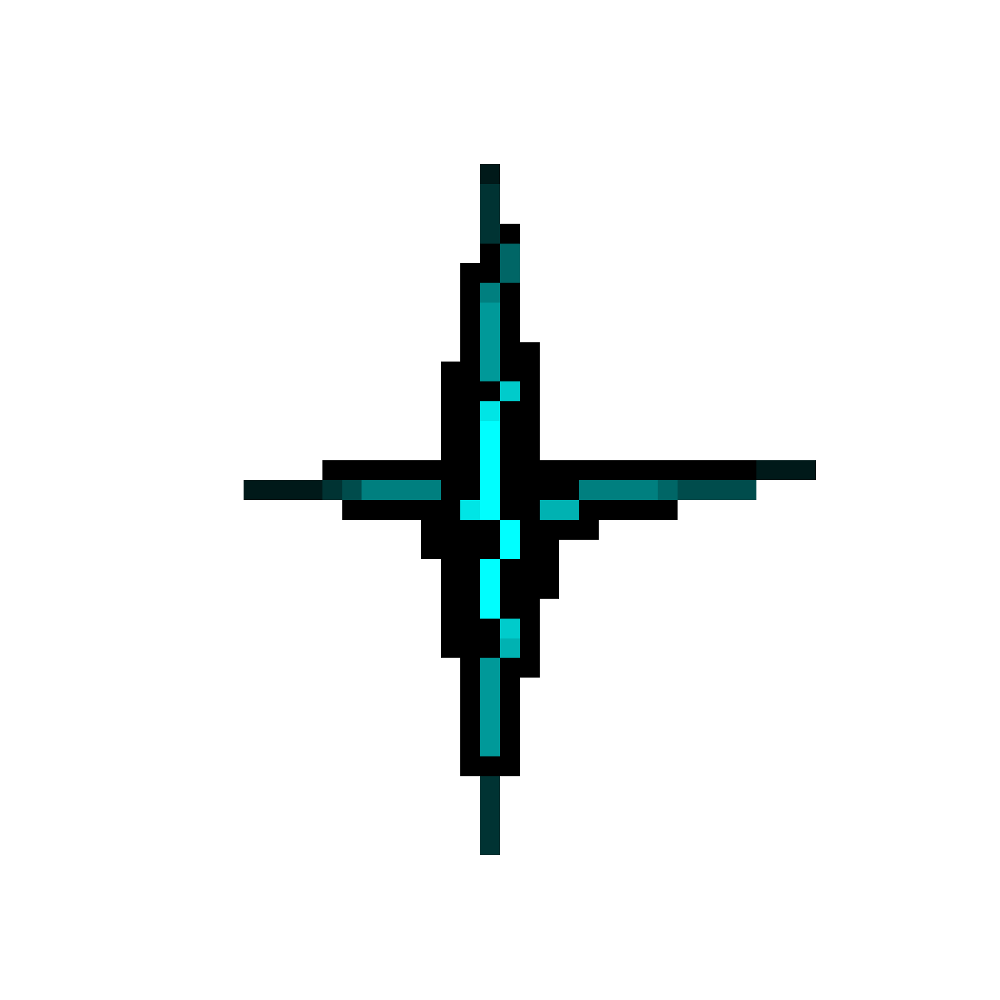

In [17]:
image3, line_image = shrink_to_lines(image2)
combined_image = np.add(image2[:, :, :3], line_image)
display_image(combined_image)

In [107]:
def draw_circle(pos, radius):
    circle1=plt.Circle(pos, radius=radius, alpha=0.5, edgecolor='r', facecolor='r', linewidth=0)
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_patch(circle1)

In [114]:
def make_into_circles(img_input, background_image):
    plt.figure(figsize=(20,20))
    plt.imshow( background_image)
    
    for x in range(img_input.shape[1] - 1):
        for y in range(img_input.shape[0] - 1):
            if img_input[y, x, 1] > 0:
                draw_circle((x, y), img_input[y, x, 1] * 8)
            
            gray = [0.0, 0.1, 0.1]
                

    plt.show()


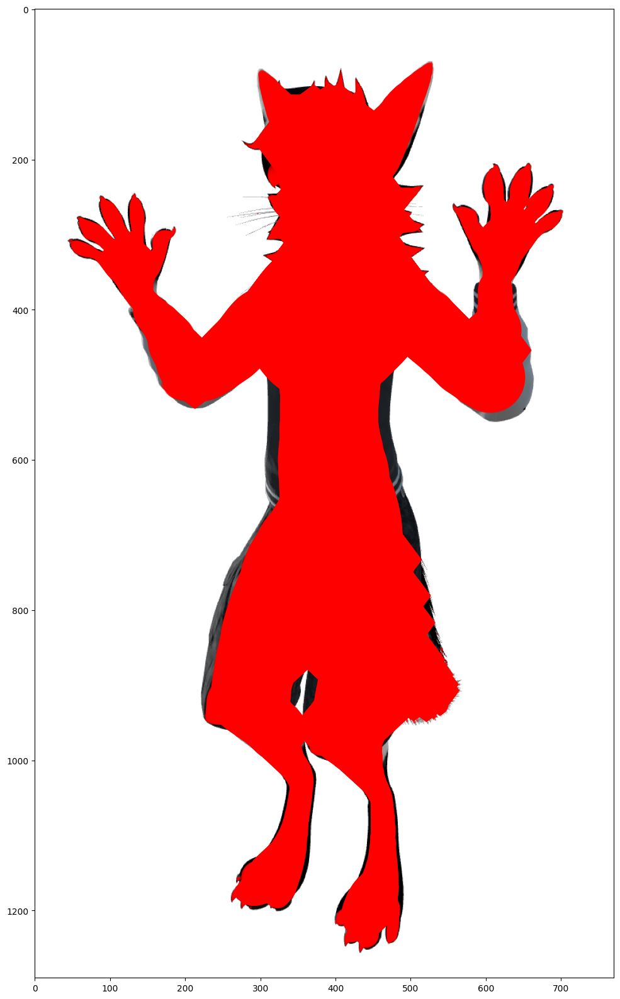

In [115]:
make_into_circles(line_image, image)